In [90]:
import cartopy.crs as ccrs
import cartopy.feature as cfeature
from math import cos, asin, sqrt
import matplotlib.pyplot as plt
import numpy as np
import pickle
import math
import xarray as xr
import netCDF4 as nc
from matplotlib import ticker, cm
from matplotlib import animation, rc
import matplotlib.tri as tri
import sys
#import metpy.calc as mpcalc
#from metpy.cbook import get_test_data
#from metpy.interpolate import cross_section
import scipy.ndimage as ndimage
from mpl_toolkits.axes_grid1 import make_axes_locatable
sys.setrecursionlimit(9000)
import scipy.ndimage
import statistics
import scipy.io
import h5py
from scipy.interpolate import griddata

In [163]:
# Change this part
sYear  = 2008
sMonth = 10
sDay   = 1
sHour  = 0
eYear  = 2008
eMonth = 10
eDay   = 7
eHour  = 0
# Set the location of the column
Center_lon = 5  # 417
Center_lat = -11.0 
Center_lon0 = 5
Center_lat0 = -11.0 

#Center_lon = 102  # 1194
#Center_lat = -30.0 
#Center_lon0 = 102
#Center_lat0 = -30.0  

#Center_lon = 272 #3426
#Center_lat = -14.0 
#Center_lon0 = 272
#Center_lat0 = -14.0  

In [42]:
UPsedi15_PATH = '/media/liran/PLR5/UPsedi/fixed15/'
UPhysedi15 = xr.open_mfdataset(UPsedi15_PATH+'HPhypersedi_sigmag_long_fixed15_L125_ERA5_2008_F-MMF1_frontera_ne16pg2_r05_oQU240_CRM1_64_x_120z200m.5s_crm_nx_rad_16_np_768_nlev_125.frontera.cam.h0.*.nc')
UPsedi20_PATH = '/media/liran/PLR5/UPsedi/fixed20/'
UPhysedi20 = xr.open_mfdataset(UPsedi20_PATH+'HPhypersedi_sigmag_long_fixed20_L125_ERA5_2008_F-MMF1_frontera_ne16pg2_r05_oQU240_CRM1_64_x_120z200m.5s_crm_nx_rad_16_np_768_nlev_125.frontera.cam.h0.*.nc')
UPhy_PATH = '/media/liran/Elements/Frontera_Cases/Peter_smooth_momentum/Ensemble/2008/'
UPhy2008 = xr.open_mfdataset(UPhy_PATH+'Multi-CRM_UPCTRL_hpv_ERA5_2008_F-MMF1_frontera_ne16pg2_r05_oQU240_CRM1_64_x_125z200m.2s_crm_nx_rad_16_np_768_nlev_125.frontera.cam.h0.2008-10-*.nc')

In [27]:
UP_Case = 'Multi-CRM_UPCTRL_v3_ERA5_2008_F-MMF1_frontera_ne16pg2_r05_oQU240_CRM1_64_64x_125z200m.0.5s_crm_nx_rad_16_np_2048_nlev_125.frontera'
UP_PATH = '/media/liran/Elements/Frontera_Cases/ERA5_Ensemble_UP/Multi-CRM_UPCTRL_v3_ERA5_2008_F-MMF1_frontera_ne16pg2_r05_oQU240_CRM1_64_64x_125z200m.0.5s_crm_nx_rad_16_np_2048_nlev_125.frontera/'
UP2008 = xr.open_mfdataset(UP_PATH+UP_Case+'.cam.h0.2008-10-*.nc')
SP_Case = 'Multi-CRM_SPCTRLv3_ERA5_2008_F-MMF1_frontera_ne16pg2_r05_oQU240_CRM1_32_32x_125z1200m.5s_crm_nx_rad_16_np_2048_nlev_125.frontera'
SP_PATH = '/media/liran/Elements/Frontera_Cases/ERA5_Ensemble_SP/Multi-CRM_SPCTRLv3_ERA5_2008_F-MMF1_frontera_ne16pg2_r05_oQU240_CRM1_32_32x_125z1200m.5s_crm_nx_rad_16_np_2048_nlev_125.frontera/'
SP2008 = xr.open_mfdataset(SP_PATH+SP_Case+'.cam.h0.2008-10-*.nc')

In [85]:
lon = SP2008.lon.isel(time=0).values
lat = SP2008.lat.isel(time=0).values
Z3 = SP2008.Z3.isel(time=0).values

In [4]:
# Function calculate the distance between two points
def distance2(lat1, lon1, lat2, lon2):
    p = 0.017453292519943295
    a = 0.5 - cos((lat2-lat1)*p)/2 + cos(lat1*p)*cos(lat2*p) * (1-cos((lon2-lon1)*p)) / 2
    return 12742 * asin(sqrt(a))

In [5]:
def find_indices(lst, condition):
    return [i for i, elem in enumerate(lst) if condition(elem)]

In [165]:
# Find the column index corresponds to the minimum distance
ddmin = 99999999.0
for icol in range(0,len(lon)-1):
    dd = distance2(lat[icol], lon[icol], Center_lat0, Center_lon0)
    if dd<ddmin:
        ddmin = dd
        indselect0 = icol
            
print(lon[indselect0])

4.218929611476212


In [166]:
# Find the column index corresponds to the minimum distance
ddmin = 99999999.0
for icol in range(0,len(lon)-1):
    dd = distance2(lat[icol], lon[icol], Center_lat, Center_lon)
    if dd<ddmin:
        ddmin = dd
        indselect = icol
            
print(indselect)

417


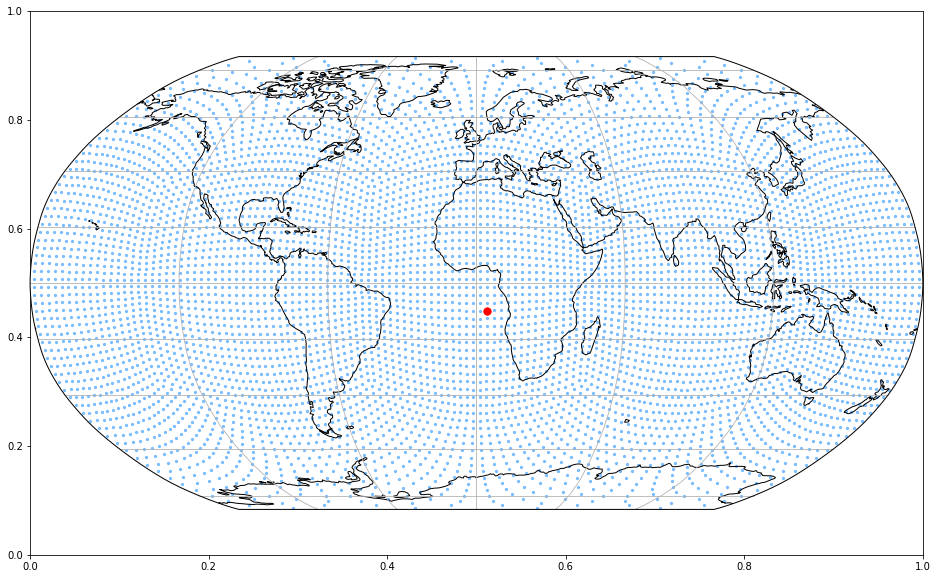

In [167]:
# Check the location of the selected column
#-- create figure and axes object
fig, ax = plt.subplots(figsize=(16,10))

#-- choose map projection
ax = fig.add_subplot(1,1,1, projection=ccrs.Robinson())
ax.set_global()
#-- add coastlines, country border lines, and grid lines
ax.coastlines()
ax.gridlines()
plt.scatter(lon[:], lat[:],
            color="dodgerblue",
            s=5,
            alpha=0.5,
            transform=ccrs.PlateCarree()) ## Important
plt.scatter(lon[indselect], lat[indselect],
            color="tomato",
            s=50,
            alpha=1,
            transform=ccrs.PlateCarree()) ## Important
plt.scatter(lon[indselect0], lat[indselect0],
            color="red",
            s=50,
            alpha=1,
            transform=ccrs.PlateCarree()) ## Important
#plt.show()
#plt.savefig('Height_Time_position_WPac_272_m14.png')
plt.savefig('Height_Time_position_WNami_5_m11.png')
#plt.savefig('Height_Time_position_WAus_102_m30.png')

In [174]:
T_UP = UP2008.T.values # T vertical diffusion K/s
CLOUD_UP  = UP2008.CLOUD.values
CLDLIQ_UP  = UP2008.CLDLIQ.values
Q_UP  = UP2008.Q.values
TMQ_UP  = UP2008.TMQ.values
QRS_UP  = UP2008.QRS.values
QRL_UP  = UP2008.QRL.values
PTTEND_UP  = UP2008.PTTEND.values
T_cross_UP = np.transpose(T_UP[:,:,indselect])
SPWWUP = UP2008.SPWW.values # Prec. water fall-out from CRM kg/kg/s
cld_crossUP = np.transpose(CLOUD_UP[:,:,indselect])
q_crossUP = np.transpose(Q_UP[:,:,indselect])
cldliq_crossUP = np.transpose(CLDLIQ_UP[:,:,indselect])
spww_crossUP = np.transpose(SPWWUP[:,:,indselect])
tmq_crossUP = np.transpose(TMQ_UP[:,indselect])
qrs_crossUP = np.transpose(QRS_UP[:,:,indselect])
qrl_crossUP = np.transpose(QRL_UP[:,:,indselect])
pttend_crossUP = np.transpose(PTTEND_UP[:,:,indselect])
Z3  = UP2008.Z3.values
Z3UP = Z3[0,:,indselect]

In [189]:
T_SP = SP2008.T.values # T vertical diffusion K/s
CLOUD_SP  = SP2008.CLOUD.values
CLDLIQ_SP  = SP2008.CLDLIQ.values
Q_SP  = SP2008.Q.values
TMQ_SP  = SP2008.TMQ.values
QRS_SP  = SP2008.QRS.values
QRL_SP  = SP2008.QRL.values
PTTEND_SP  = SP2008.PTTEND.values
T_cross_SP = np.transpose(T_SP[:,:,indselect])
SPWW_SP = SP2008.SPWW.values # Prec. water fall-out from CRM kg/kg/s
cld_crossSP = np.transpose(CLOUD_SP[:,:,indselect])
q_crossSP = np.transpose(Q_SP[:,:,indselect])
cldliq_crossSP = np.transpose(CLDLIQ_SP[:,:,indselect])
spww_crossSP = np.transpose(SPWW_SP[:,:,indselect])
tmq_crossSP = np.transpose(TMQ_SP[:,indselect])
qrs_crossSP = np.transpose(QRS_SP[:,:,indselect])
qrl_crossSP = np.transpose(QRL_SP[:,:,indselect])
pttend_crossSP = np.transpose(PTTEND_SP[:,:,indselect])
Z3  = SP2008.Z3.values
Z3SP = Z3[0,:,indselect]

In [176]:
T_UPhy = UPhy2008.T.values # T vertical diffusion K/s
CLOUD_UPhy  = UPhy2008.CLOUD.values
CLDLIQ_UPhy  = UPhy2008.CLDLIQ.values
Q_UPhy  = UPhy2008.Q.values
TMQ_UPhy  = UPhy2008.TMQ.values
QRS_UPhy  = UPhy2008.QRS.values
QRL_UPhy  = UPhy2008.QRL.values
PTTEND_UPhy  = UPhy2008.PTTEND.values
T_cross_UPhy = np.transpose(T_UPhy[:,:,indselect])
SPWWUPhy = UPhy2008.SPWW.values # Prec. water fall-out from CRM kg/kg/s
cld_crossUPhy = np.transpose(CLOUD_UPhy[:,:,indselect])
q_crossUPhy = np.transpose(Q_UPhy[:,:,indselect])
cldliq_crossUPhy = np.transpose(CLDLIQ_UPhy[:,:,indselect])
spww_crossUPhy = np.transpose(SPWWUPhy[:,:,indselect])
tmq_crossUPhy  = np.transpose(TMQ_UPhy[:,indselect])
qrs_crossUPhy = np.transpose(QRS_UPhy[:,:,indselect])
qrl_crossUPhy = np.transpose(QRL_UPhy[:,:,indselect])
pttend_crossUPhy = np.transpose(PTTEND_UPhy[:,:,indselect])
Z3  = UPhy2008.Z3.values
Z3UPhy = Z3[0,:,indselect]

In [177]:
T_UPhysedi15 = UPhysedi15.T.values # T vertical diffusion K/s
CLOUD_UPhysedi15  = UPhysedi15.CLOUD.values
CLDLIQ_UPhysedi15  = UPhysedi15.CLDLIQ.values
Q_UPhysedi15  = UPhysedi15.Q.values
TMQ_UPhysedi15  = UPhysedi15.TMQ.values
QRS_UPhysedi15  = UPhysedi15.QRS.values
QRL_UPhysedi15  = UPhysedi15.QRL.values
PTTEND_UPhysedi15  = UPhysedi15.PTTEND.values
T_cross_UPhysedi15 = np.transpose(T_UPhysedi15[:,:,indselect])
SPWWUPhysedi15 = UPhysedi15.SPWW.values # Prec. water fall-out from CRM kg/kg/s
cld_crossUPhysedi15 = np.transpose(CLOUD_UPhysedi15[:,:,indselect])
q_crossUPhysedi15 = np.transpose(Q_UPhysedi15[:,:,indselect])
cldliq_crossUPhysedi15 = np.transpose(CLDLIQ_UPhysedi15[:,:,indselect])
spww_crossUPhysedi15 = np.transpose(SPWWUPhysedi15[:,:,indselect])
tmq_crossUPhysedi15 = np.transpose(TMQ_UPhysedi15[:,indselect])
qrs_crossUPhysedi15 = np.transpose(QRS_UPhysedi15[:,:,indselect])
qrl_crossUPhysedi15 = np.transpose(QRL_UPhysedi15[:,:,indselect])
pttend_crossUPhysedi15 = np.transpose(PTTEND_UPhysedi15[:,:,indselect])
Z3  = UPhysedi15.Z3.values
Z3UPhysedi15 = Z3[0,:,indselect]

In [178]:
T_UPhysedi20 = UPhysedi20.T.values # T vertical diffusion K/s
CLOUD_UPhysedi20  = UPhysedi20.CLOUD.values
CLDLIQ_UPhysedi20  = UPhysedi20.CLDLIQ.values
Q_UPhysedi20  = UPhysedi20.Q.values
TMQ_UPhysedi20  = UPhysedi20.TMQ.values
QRS_UPhysedi20  = UPhysedi20.QRS.values
QRL_UPhysedi20  = UPhysedi20.QRL.values
PTTEND_UPhysedi20  = UPhysedi20.PTTEND.values
T_cross_UPhysedi20 = np.transpose(T_UPhysedi20[:,:,indselect])
SPWWUPhysedi20 = UPhysedi20.SPWW.values # Prec. water fall-out from CRM kg/kg/s
cld_crossUPhysedi20 = np.transpose(CLOUD_UPhysedi20[:,:,indselect])
q_crossUPhysedi20 = np.transpose(Q_UPhysedi20[:,:,indselect])
cldliq_crossUPhysedi20 = np.transpose(CLDLIQ_UPhysedi20[:,:,indselect])
spww_crossUPhysedi20 = np.transpose(SPWWUPhysedi20[:,:,indselect])
tmq_crossUPhysedi20 = np.transpose(TMQ_UPhysedi20[:,indselect])
qrs_crossUPhysedi20 = np.transpose(QRS_UPhysedi20[:,:,indselect])
qrl_crossUPhysedi20 = np.transpose(QRL_UPhysedi20[:,:,indselect])
pttend_crossUPhysedi20 = np.transpose(PTTEND_UPhysedi20[:,:,indselect])
Z3  = UPhysedi20.Z3.values
Z3UPhysedi20 = Z3[0,:,indselect]

In [179]:
pttend_crossSP

array([[ 1.22507203e-07, -1.00618752e-04, -1.00530036e-04, ...,
        -6.87894499e-05, -6.87024367e-05, -6.86206331e-05],
       [ 2.74330745e-07, -8.92674798e-05, -8.91886157e-05, ...,
        -8.06910029e-05, -8.02932263e-05, -7.98990368e-05],
       [ 2.11454587e-08, -6.26745459e-05,  4.97507681e-05, ...,
         1.11978770e-04,  1.13728071e-04,  1.15589792e-04],
       ...,
       [ 8.71297756e-10,  1.70215371e-05,  2.96830713e-05, ...,
        -8.26545584e-05, -3.48427384e-05, -4.33089626e-05],
       [ 6.72290357e-09,  9.90325680e-06,  8.42499940e-05, ...,
        -1.02948085e-04, -9.12824107e-05, -1.21324978e-04],
       [ 9.62442835e-04,  3.77377728e-04,  2.69964134e-04, ...,
         6.31635885e-06,  3.31554547e-05, -4.67135214e-06]], dtype=float32)

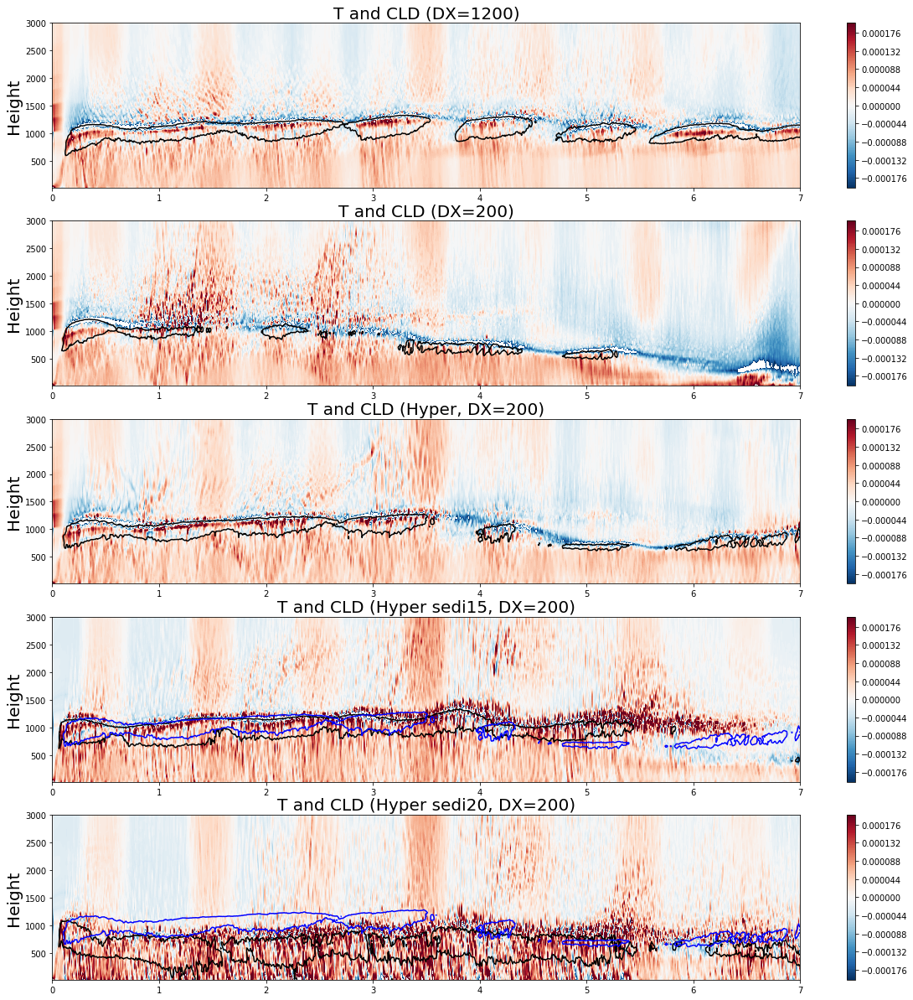

In [196]:
#  For SPCTRL and UPCTRL, both finished 5 day simulation
fig, (ax1,ax2,ax3,ax4,ax5) = plt.subplots(nrows=5, ncols=1, figsize=(20, 21))
varmin = [-2e-4]
varmax = [2e-4]
varinter = [101]
vardmin = [-4]
vardmax = [4]
vardinter = [101]
num1 = 1009
num2 = 1009
time = np.linspace(0, num1, num1)
time2 = np.linspace(0, num2, num2)
time3 = np.linspace(0, 289, 289)
levels = np.linspace(varmin[0], varmax[0], varinter[0])
levels2 = np.linspace(vardmin[0], vardmax[0], vardinter[0])

cf = ax1.contourf(time/144,Z3SP,pttend_crossSP,200, cmap="RdBu_r", levels=levels)
cf01 = ax1.contour(time/144,Z3SP,cld_crossSP,200,colors='k', levels=[0.2], linestyles='-')
#cf0002 = ax1.contour(time/144,Z3p,cld_cross1,200, colors='k', levels=[0.8], linestyles=':')
cb = fig.colorbar(cf, ax=ax1)
ax1.set(xlim=(0, 7), ylim=(min(Z3SP), 3000))
titlestring = ("T and CLD (DX=1200)")
tx = ax1.set_title(titlestring, fontsize=20)
#ax1.set_xlabel('Day', fontsize=20)
ax1.set_ylabel('Height', fontsize=20)

cf2 = ax2.contourf(time/144,Z3UP,pttend_crossUP,200, cmap="RdBu_r", levels=levels)
cf02 = ax2.contour(time/144,Z3UP,cld_crossUP,200,colors='k', levels=[0.2], linestyles='-')
cb2 = fig.colorbar(cf2, ax=ax2)
ax2.set(xlim=(0, 7), ylim=(min(Z3UP), 3000))
titlestring = ("T and CLD (DX=200)")
tx = ax2.set_title(titlestring, fontsize=20)
#ax2.set_xlabel('Day', fontsize=20)
ax2.set_ylabel('Height', fontsize=20)

cf3 = ax3.contourf(time/144,Z3UPhy,pttend_crossUPhy,200, cmap="RdBu_r", levels=levels)
cf03 = ax3.contour(time/144,Z3UPhy,cld_crossUPhy,200,colors='k', levels=[0.2], linestyles='-')
cb3 = fig.colorbar(cf3, ax=ax3)
ax3.set(xlim=(0, 7), ylim=(min(Z3UPhy), 3000))
titlestring = ("T and CLD (Hyper, DX=200)")
tx = ax3.set_title(titlestring, fontsize=20)
#ax2.set_xlabel('Day', fontsize=20)
ax3.set_ylabel('Height', fontsize=20)

cf4 = ax4.contourf(time/144,Z3UPhysedi15,pttend_crossUPhysedi15,200, cmap="RdBu_r", levels=levels)
cf04 = ax4.contour(time/144,Z3UPhysedi15,cld_crossUPhysedi15,200,colors='k', levels=[0.2], linestyles='-')
cf042 = ax4.contour(time/144,Z3UPhy,cld_crossUPhy,200,colors='b', levels=[0.2], linestyles='-')
cb4 = fig.colorbar(cf4, ax=ax4)
ax4.set(xlim=(0, 7), ylim=(min(Z3UPhysedi15), 3000))
titlestring = ("T and CLD (Hyper sedi15, DX=200)")
tx = ax4.set_title(titlestring, fontsize=20)
#ax2.set_xlabel('Day', fontsize=20)
ax4.set_ylabel('Height', fontsize=20)

cf5 = ax5.contourf(time/144,Z3UPhysedi20,pttend_crossUPhysedi20,200, cmap="RdBu_r", levels=levels)
cf05 = ax5.contour(time/144,Z3UPhysedi20,cld_crossUPhysedi20,200,colors='k', levels=[0.2], linestyles='-')
cf052 = ax5.contour(time/144,Z3UPhy,cld_crossUPhy,200,colors='b', levels=[0.2], linestyles='-')
cb5 = fig.colorbar(cf4, ax=ax5)
ax5.set(xlim=(0, 7), ylim=(min(Z3UPhysedi15), 3000))
titlestring = ("T and CLD (Hyper sedi20, DX=200)")
tx = ax5.set_title(titlestring, fontsize=20)
#ax2.set_xlabel('Day', fontsize=20)
ax5.set_ylabel('Height', fontsize=20)

plt.savefig('SP_UP_init_Crosssection_Wnamibia_5_m11_PTTENDCLD_Time_Height_UP.png')
#plt.savefig('SP_UP_init_Crosssection_WAus_102_m30_TCLD_Time_Height_UP.png')
#plt.savefig('SP_UP_init_Crosssection_WPac_272_m14_PTTENDCLD_Time_Height_UP.png')

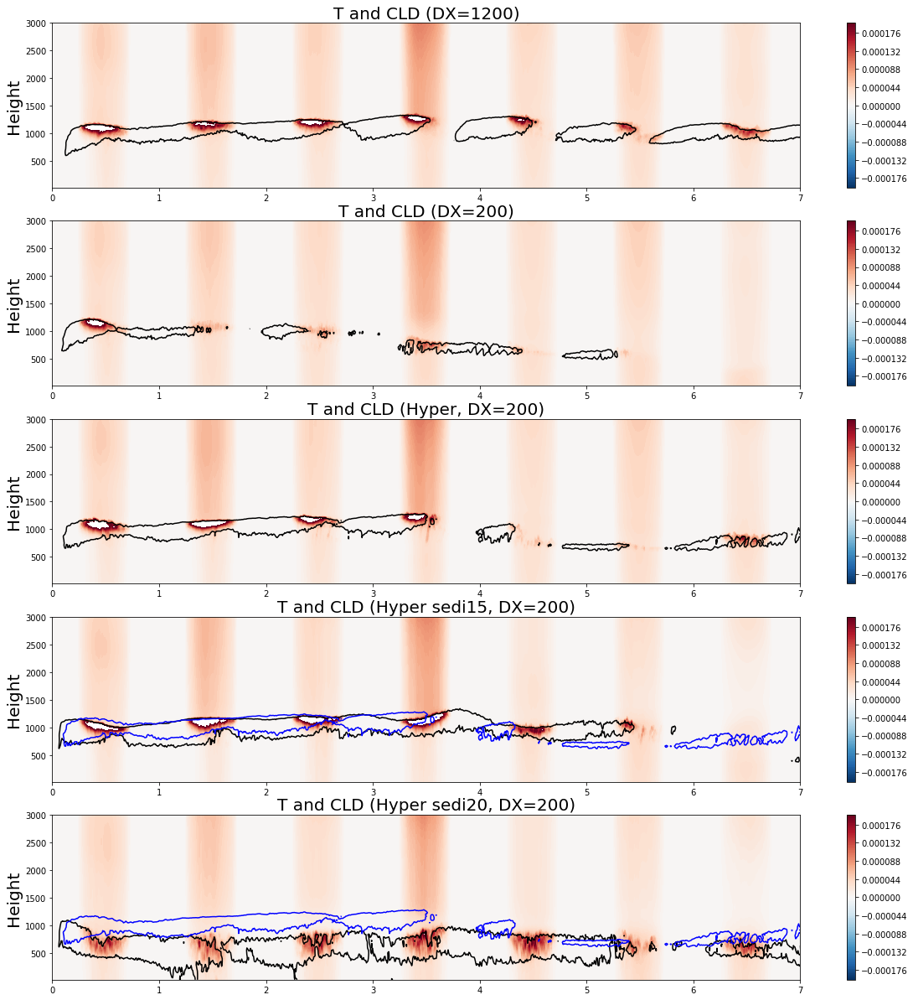

In [197]:
#  For SPCTRL and UPCTRL, both finished 5 day simulation
fig, (ax1,ax2,ax3,ax4,ax5) = plt.subplots(nrows=5, ncols=1, figsize=(20, 21))
varmin = [-2e-4]
varmax = [2e-4]
varinter = [101]
vardmin = [-4]
vardmax = [4]
vardinter = [101]
num1 = 1009
num2 = 1009
time = np.linspace(0, num1, num1)
time2 = np.linspace(0, num2, num2)
time3 = np.linspace(0, 289, 289)
levels = np.linspace(varmin[0], varmax[0], varinter[0])
levels2 = np.linspace(vardmin[0], vardmax[0], vardinter[0])

cf = ax1.contourf(time/144,Z3SP,qrs_crossSP,200, cmap="RdBu_r", levels=levels)
cf01 = ax1.contour(time/144,Z3SP,cld_crossSP,200,colors='k', levels=[0.2], linestyles='-')
#cf0002 = ax1.contour(time/144,Z3p,cld_cross1,200, colors='k', levels=[0.8], linestyles=':')
cb = fig.colorbar(cf, ax=ax1)
ax1.set(xlim=(0, 7), ylim=(min(Z3SP), 3000))
titlestring = ("T and CLD (DX=1200)")
tx = ax1.set_title(titlestring, fontsize=20)
#ax1.set_xlabel('Day', fontsize=20)
ax1.set_ylabel('Height', fontsize=20)

cf2 = ax2.contourf(time/144,Z3UP,qrs_crossUP,200, cmap="RdBu_r", levels=levels)
cf02 = ax2.contour(time/144,Z3UP,cld_crossUP,200,colors='k', levels=[0.2], linestyles='-')
cb2 = fig.colorbar(cf2, ax=ax2)
ax2.set(xlim=(0, 7), ylim=(min(Z3UP), 3000))
titlestring = ("T and CLD (DX=200)")
tx = ax2.set_title(titlestring, fontsize=20)
#ax2.set_xlabel('Day', fontsize=20)
ax2.set_ylabel('Height', fontsize=20)

cf3 = ax3.contourf(time/144,Z3UPhy,qrs_crossUPhy,200, cmap="RdBu_r", levels=levels)
cf03 = ax3.contour(time/144,Z3UPhy,cld_crossUPhy,200,colors='k', levels=[0.2], linestyles='-')
cb3 = fig.colorbar(cf3, ax=ax3)
ax3.set(xlim=(0, 7), ylim=(min(Z3UPhy), 3000))
titlestring = ("T and CLD (Hyper, DX=200)")
tx = ax3.set_title(titlestring, fontsize=20)
#ax2.set_xlabel('Day', fontsize=20)
ax3.set_ylabel('Height', fontsize=20)

cf4 = ax4.contourf(time/144,Z3UPhysedi15,qrs_crossUPhysedi15,200, cmap="RdBu_r", levels=levels)
cf04 = ax4.contour(time/144,Z3UPhysedi15,cld_crossUPhysedi15,200,colors='k', levels=[0.2], linestyles='-')
cf042 = ax4.contour(time/144,Z3UPhy,cld_crossUPhy,200,colors='b', levels=[0.2], linestyles='-')
cb4 = fig.colorbar(cf4, ax=ax4)
ax4.set(xlim=(0, 7), ylim=(min(Z3UPhysedi15), 3000))
titlestring = ("T and CLD (Hyper sedi15, DX=200)")
tx = ax4.set_title(titlestring, fontsize=20)
#ax2.set_xlabel('Day', fontsize=20)
ax4.set_ylabel('Height', fontsize=20)

cf5 = ax5.contourf(time/144,Z3UPhysedi20,qrs_crossUPhysedi20,200, cmap="RdBu_r", levels=levels)
cf05 = ax5.contour(time/144,Z3UPhysedi20,cld_crossUPhysedi20,200,colors='k', levels=[0.2], linestyles='-')
cf052 = ax5.contour(time/144,Z3UPhy,cld_crossUPhy,200,colors='b', levels=[0.2], linestyles='-')
cb5 = fig.colorbar(cf4, ax=ax5)
ax5.set(xlim=(0, 7), ylim=(min(Z3UPhysedi15), 3000))
titlestring = ("T and CLD (Hyper sedi20, DX=200)")
tx = ax5.set_title(titlestring, fontsize=20)
#ax2.set_xlabel('Day', fontsize=20)
ax5.set_ylabel('Height', fontsize=20)

plt.savefig('SP_UP_init_Crosssection_Wnamibia_5_m11_QRSCLD_Time_Height_UP.png')
#plt.savefig('SP_UP_init_Crosssection_WAus_102_m30_TCLD_Time_Height_UP.png')
#plt.savefig('SP_UP_init_Crosssection_WPac_272_m14_QRSCLD_Time_Height_UP.png')

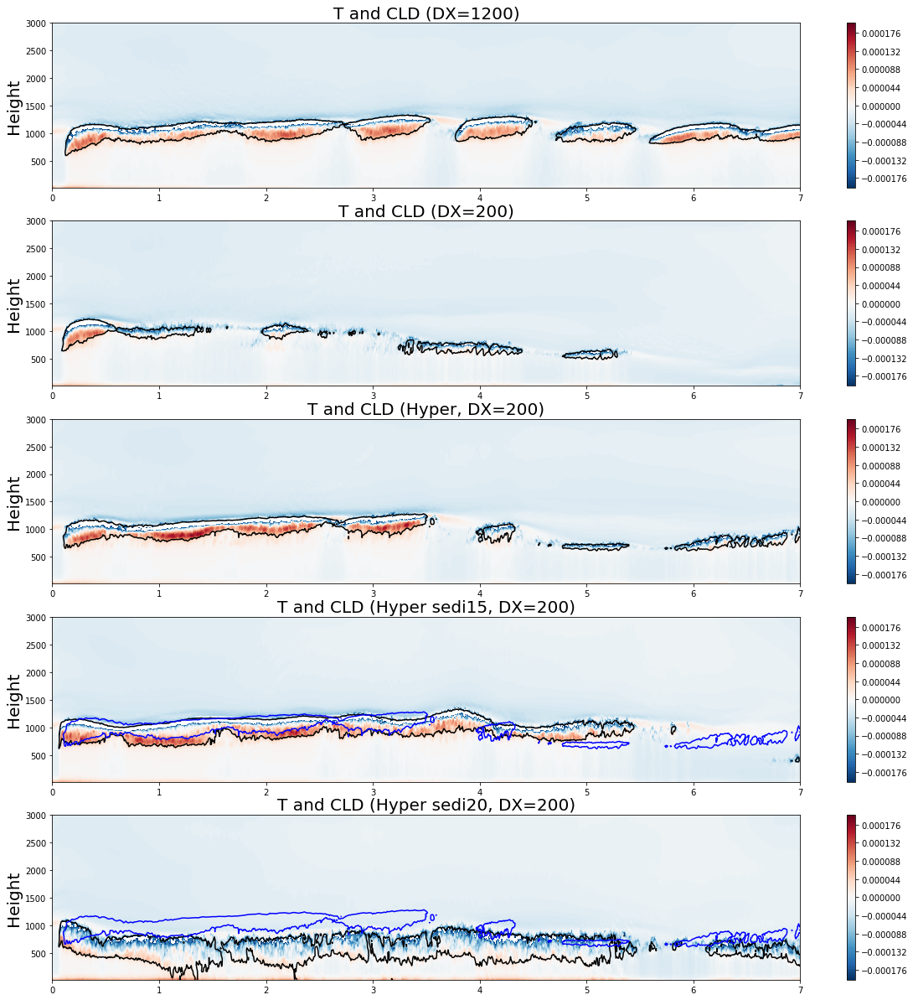

In [198]:
#  For SPCTRL and UPCTRL, both finished 5 day simulation
fig, (ax1,ax2,ax3,ax4,ax5) = plt.subplots(nrows=5, ncols=1, figsize=(20, 21))
varmin = [-2e-4]
varmax = [2e-4]
varinter = [101]
vardmin = [-4]
vardmax = [4]
vardinter = [101]
num1 = 1009
num2 = 1009
time = np.linspace(0, num1, num1)
time2 = np.linspace(0, num2, num2)
time3 = np.linspace(0, 289, 289)
levels = np.linspace(varmin[0], varmax[0], varinter[0])
levels2 = np.linspace(vardmin[0], vardmax[0], vardinter[0])

cf = ax1.contourf(time/144,Z3SP,qrl_crossSP,200, cmap="RdBu_r", levels=levels)
cf01 = ax1.contour(time/144,Z3SP,cld_crossSP,200,colors='k', levels=[0.2], linestyles='-')
#cf0002 = ax1.contour(time/144,Z3p,cld_cross1,200, colors='k', levels=[0.8], linestyles=':')
cb = fig.colorbar(cf, ax=ax1)
ax1.set(xlim=(0, 7), ylim=(min(Z3SP), 3000))
titlestring = ("T and CLD (DX=1200)")
tx = ax1.set_title(titlestring, fontsize=20)
#ax1.set_xlabel('Day', fontsize=20)
ax1.set_ylabel('Height', fontsize=20)

cf2 = ax2.contourf(time/144,Z3UP,qrl_crossUP,200, cmap="RdBu_r", levels=levels)
cf02 = ax2.contour(time/144,Z3UP,cld_crossUP,200,colors='k', levels=[0.2], linestyles='-')
cb2 = fig.colorbar(cf2, ax=ax2)
ax2.set(xlim=(0, 7), ylim=(min(Z3UP), 3000))
titlestring = ("T and CLD (DX=200)")
tx = ax2.set_title(titlestring, fontsize=20)
#ax2.set_xlabel('Day', fontsize=20)
ax2.set_ylabel('Height', fontsize=20)

cf3 = ax3.contourf(time/144,Z3UPhy,qrl_crossUPhy,200, cmap="RdBu_r", levels=levels)
cf03 = ax3.contour(time/144,Z3UPhy,cld_crossUPhy,200,colors='k', levels=[0.2], linestyles='-')
cb3 = fig.colorbar(cf3, ax=ax3)
ax3.set(xlim=(0, 7), ylim=(min(Z3UPhy), 3000))
titlestring = ("T and CLD (Hyper, DX=200)")
tx = ax3.set_title(titlestring, fontsize=20)
#ax2.set_xlabel('Day', fontsize=20)
ax3.set_ylabel('Height', fontsize=20)

cf4 = ax4.contourf(time/144,Z3UPhysedi15,qrl_crossUPhysedi15,200, cmap="RdBu_r", levels=levels)
cf04 = ax4.contour(time/144,Z3UPhysedi15,cld_crossUPhysedi15,200,colors='k', levels=[0.2], linestyles='-')
cf042 = ax4.contour(time/144,Z3UPhy,cld_crossUPhy,200,colors='b', levels=[0.2], linestyles='-')
cb4 = fig.colorbar(cf4, ax=ax4)
ax4.set(xlim=(0, 7), ylim=(min(Z3UPhysedi15), 3000))
titlestring = ("T and CLD (Hyper sedi15, DX=200)")
tx = ax4.set_title(titlestring, fontsize=20)
#ax2.set_xlabel('Day', fontsize=20)
ax4.set_ylabel('Height', fontsize=20)

cf5 = ax5.contourf(time/144,Z3UPhysedi20,qrl_crossUPhysedi20,200, cmap="RdBu_r", levels=levels)
cf05 = ax5.contour(time/144,Z3UPhysedi20,cld_crossUPhysedi20,200,colors='k', levels=[0.2], linestyles='-')
cf052 = ax5.contour(time/144,Z3UPhy,cld_crossUPhy,200,colors='b', levels=[0.2], linestyles='-')
cb5 = fig.colorbar(cf4, ax=ax5)
ax5.set(xlim=(0, 7), ylim=(min(Z3UPhysedi15), 3000))
titlestring = ("T and CLD (Hyper sedi20, DX=200)")
tx = ax5.set_title(titlestring, fontsize=20)
#ax2.set_xlabel('Day', fontsize=20)
ax5.set_ylabel('Height', fontsize=20)

plt.savefig('SP_UP_init_Crosssection_Wnamibia_5_m11_QRLCLD_Time_Height_UP.png')
#plt.savefig('SP_UP_init_Crosssection_WAus_102_m30_TCLD_Time_Height_UP.png')
#plt.savefig('SP_UP_init_Crosssection_WPac_272_m14_QRLCLD_Time_Height_UP.png')

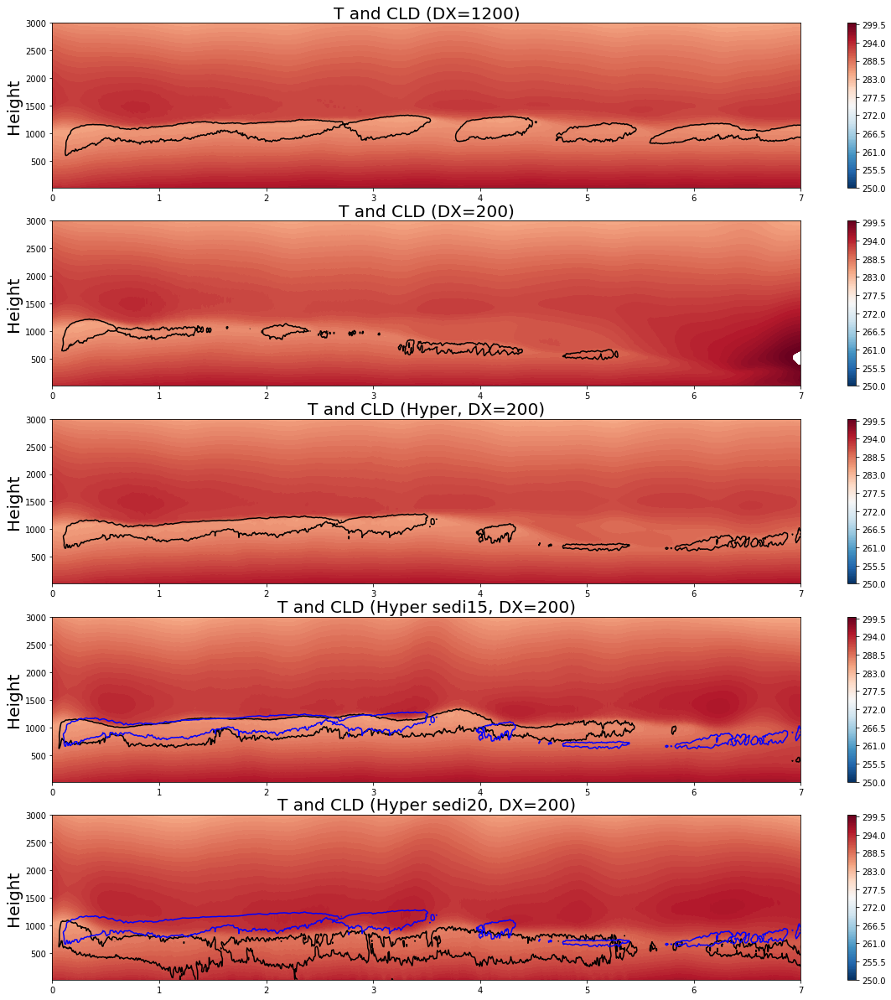

In [193]:
#  For SPCTRL and UPCTRL, both finished 5 day simulation
fig, (ax1,ax2,ax3,ax4,ax5) = plt.subplots(nrows=5, ncols=1, figsize=(20, 21))
varmin = [250]
varmax = [300]
varinter = [101]
vardmin = [-4]
vardmax = [4]
vardinter = [101]
num1 = 1009
num2 = 1009
time = np.linspace(0, num1, num1)
time2 = np.linspace(0, num2, num2)
time3 = np.linspace(0, 289, 289)
levels = np.linspace(varmin[0], varmax[0], varinter[0])
levels2 = np.linspace(vardmin[0], vardmax[0], vardinter[0])

cf = ax1.contourf(time/144,Z3SP,T_cross_SP,200, cmap="RdBu_r", levels=levels)
cf01 = ax1.contour(time/144,Z3SP,cld_crossSP,200,colors='k', levels=[0.2], linestyles='-')
#cf0002 = ax1.contour(time/144,Z3p,cld_cross1,200, colors='k', levels=[0.8], linestyles=':')
cb = fig.colorbar(cf, ax=ax1)
ax1.set(xlim=(0, 7), ylim=(min(Z3SP), 3000))
titlestring = ("T and CLD (DX=1200)")
tx = ax1.set_title(titlestring, fontsize=20)
#ax1.set_xlabel('Day', fontsize=20)
ax1.set_ylabel('Height', fontsize=20)

cf2 = ax2.contourf(time/144,Z3UP,T_cross_UP,200, cmap="RdBu_r", levels=levels)
cf02 = ax2.contour(time/144,Z3UP,cld_crossUP,200,colors='k', levels=[0.2], linestyles='-')
cb2 = fig.colorbar(cf2, ax=ax2)
ax2.set(xlim=(0, 7), ylim=(min(Z3UP), 3000))
titlestring = ("T and CLD (DX=200)")
tx = ax2.set_title(titlestring, fontsize=20)
#ax2.set_xlabel('Day', fontsize=20)
ax2.set_ylabel('Height', fontsize=20)

cf3 = ax3.contourf(time/144,Z3UPhy,T_cross_UPhy,200, cmap="RdBu_r", levels=levels)
cf03 = ax3.contour(time/144,Z3UPhy,cld_crossUPhy,200,colors='k', levels=[0.2], linestyles='-')
cb3 = fig.colorbar(cf3, ax=ax3)
ax3.set(xlim=(0, 7), ylim=(min(Z3UPhy), 3000))
titlestring = ("T and CLD (Hyper, DX=200)")
tx = ax3.set_title(titlestring, fontsize=20)
#ax2.set_xlabel('Day', fontsize=20)
ax3.set_ylabel('Height', fontsize=20)

cf4 = ax4.contourf(time/144,Z3UPhysedi15,T_cross_UPhysedi15,200, cmap="RdBu_r", levels=levels)
cf04 = ax4.contour(time/144,Z3UPhysedi15,cld_crossUPhysedi15,200,colors='k', levels=[0.2], linestyles='-')
cf042 = ax4.contour(time/144,Z3UPhy,cld_crossUPhy,200,colors='b', levels=[0.2], linestyles='-')
cb4 = fig.colorbar(cf4, ax=ax4)
ax4.set(xlim=(0, 7), ylim=(min(Z3UPhysedi15), 3000))
titlestring = ("T and CLD (Hyper sedi15, DX=200)")
tx = ax4.set_title(titlestring, fontsize=20)
#ax2.set_xlabel('Day', fontsize=20)
ax4.set_ylabel('Height', fontsize=20)

cf5 = ax5.contourf(time/144,Z3UPhysedi20,T_cross_UPhysedi20,200, cmap="RdBu_r", levels=levels)
cf05 = ax5.contour(time/144,Z3UPhysedi20,cld_crossUPhysedi20,200,colors='k', levels=[0.2], linestyles='-')
cf052 = ax5.contour(time/144,Z3UPhy,cld_crossUPhy,200,colors='b', levels=[0.2], linestyles='-')
cb5 = fig.colorbar(cf4, ax=ax5)
ax5.set(xlim=(0, 7), ylim=(min(Z3UPhysedi15), 3000))
titlestring = ("T and CLD (Hyper sedi20, DX=200)")
tx = ax5.set_title(titlestring, fontsize=20)
#ax2.set_xlabel('Day', fontsize=20)
ax5.set_ylabel('Height', fontsize=20)

plt.savefig('SP_UP_init_Crosssection_Wnamibia_5_m11_TCLD_Time_Height_UP.png')
#plt.savefig('SP_UP_init_Crosssection_WAus_102_m30_TCLD_Time_Height_UP.png')
#plt.savefig('SP_UP_init_Crosssection_WPac_272_m14_TCLD_Time_Height_UP.png')

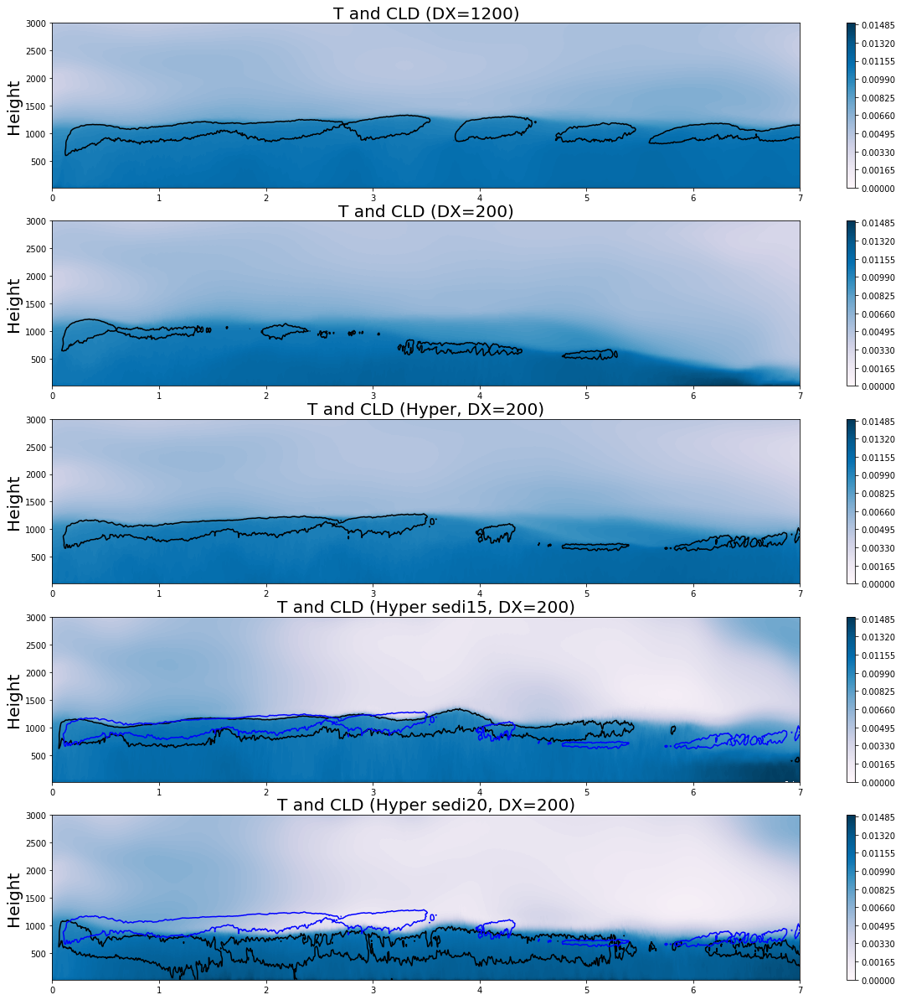

In [194]:
#  For SPCTRL and UPCTRL, both finished 5 day simulation
fig, (ax1,ax2,ax3,ax4,ax5) = plt.subplots(nrows=5, ncols=1, figsize=(20, 21))
varmin = [0]
varmax = [0.015]
varinter = [101]
vardmin = [-4]
vardmax = [4]
vardinter = [101]
num1 = 1009
num2 = 1009
time = np.linspace(0, num1, num1)
time2 = np.linspace(0, num2, num2)
time3 = np.linspace(0, 289, 289)
levels = np.linspace(varmin[0], varmax[0], varinter[0])
levels2 = np.linspace(vardmin[0], vardmax[0], vardinter[0])

cf = ax1.contourf(time/144,Z3SP,q_crossSP,200, cmap="PuBu", levels=levels)
cf01 = ax1.contour(time/144,Z3SP,cld_crossSP,200,colors='k', levels=[0.2], linestyles='-')
#cf0002 = ax1.contour(time/144,Z3p,cld_cross1,200, colors='k', levels=[0.8], linestyles=':')
cb = fig.colorbar(cf, ax=ax1)
ax1.set(xlim=(0, 7), ylim=(min(Z3SP), 3000))
titlestring = ("T and CLD (DX=1200)")
tx = ax1.set_title(titlestring, fontsize=20)
#ax1.set_xlabel('Day', fontsize=20)
ax1.set_ylabel('Height', fontsize=20)

cf2 = ax2.contourf(time/144,Z3UP,q_crossUP,200, cmap="PuBu", levels=levels)
cf02 = ax2.contour(time/144,Z3UP,cld_crossUP,200,colors='k', levels=[0.2], linestyles='-')
cb2 = fig.colorbar(cf2, ax=ax2)
ax2.set(xlim=(0, 7), ylim=(min(Z3UP), 3000))
titlestring = ("T and CLD (DX=200)")
tx = ax2.set_title(titlestring, fontsize=20)
#ax2.set_xlabel('Day', fontsize=20)
ax2.set_ylabel('Height', fontsize=20)

cf3 = ax3.contourf(time/144,Z3UPhy,q_crossUPhy,200, cmap="PuBu", levels=levels)
cf03 = ax3.contour(time/144,Z3UPhy,cld_crossUPhy,200,colors='k', levels=[0.2], linestyles='-')
cb3 = fig.colorbar(cf3, ax=ax3)
ax3.set(xlim=(0, 7), ylim=(min(Z3UPhy), 3000))
titlestring = ("T and CLD (Hyper, DX=200)")
tx = ax3.set_title(titlestring, fontsize=20)
#ax2.set_xlabel('Day', fontsize=20)
ax3.set_ylabel('Height', fontsize=20)

cf4 = ax4.contourf(time/144,Z3UPhysedi15,q_crossUPhysedi15,200, cmap="PuBu", levels=levels)
cf04 = ax4.contour(time/144,Z3UPhysedi15,cld_crossUPhysedi15,200,colors='k', levels=[0.2], linestyles='-')
cf042 = ax4.contour(time/144,Z3UPhy,cld_crossUPhy,200,colors='b', levels=[0.2], linestyles='-')
cb4 = fig.colorbar(cf4, ax=ax4)
ax4.set(xlim=(0, 7), ylim=(min(Z3UPhysedi15), 3000))
titlestring = ("T and CLD (Hyper sedi15, DX=200)")
tx = ax4.set_title(titlestring, fontsize=20)
#ax2.set_xlabel('Day', fontsize=20)
ax4.set_ylabel('Height', fontsize=20)

cf5 = ax5.contourf(time/144,Z3UPhysedi20,q_crossUPhysedi20,200, cmap="PuBu", levels=levels)
cf05 = ax5.contour(time/144,Z3UPhysedi20,cld_crossUPhysedi20,200,colors='k', levels=[0.2], linestyles='-')
cf052 = ax5.contour(time/144,Z3UPhy,cld_crossUPhy,200,colors='b', levels=[0.2], linestyles='-')
cb5 = fig.colorbar(cf4, ax=ax5)
ax5.set(xlim=(0, 7), ylim=(min(Z3UPhysedi15), 3000))
titlestring = ("T and CLD (Hyper sedi20, DX=200)")
tx = ax5.set_title(titlestring, fontsize=20)
#ax2.set_xlabel('Day', fontsize=20)
ax5.set_ylabel('Height', fontsize=20)

plt.savefig('SP_UP_iniq_crosssection_Wnamibia_5_m11_TCLD_Time_Height_UP.png')
#plt.savefig('SP_UP_iniq_crosssection_WAus_102_m30_TCLD_Time_Height_UP.png')
#plt.savefig('SP_UP_iniq_crosssection_WPac_272_m14_QCLD_Time_Height_UP.png')

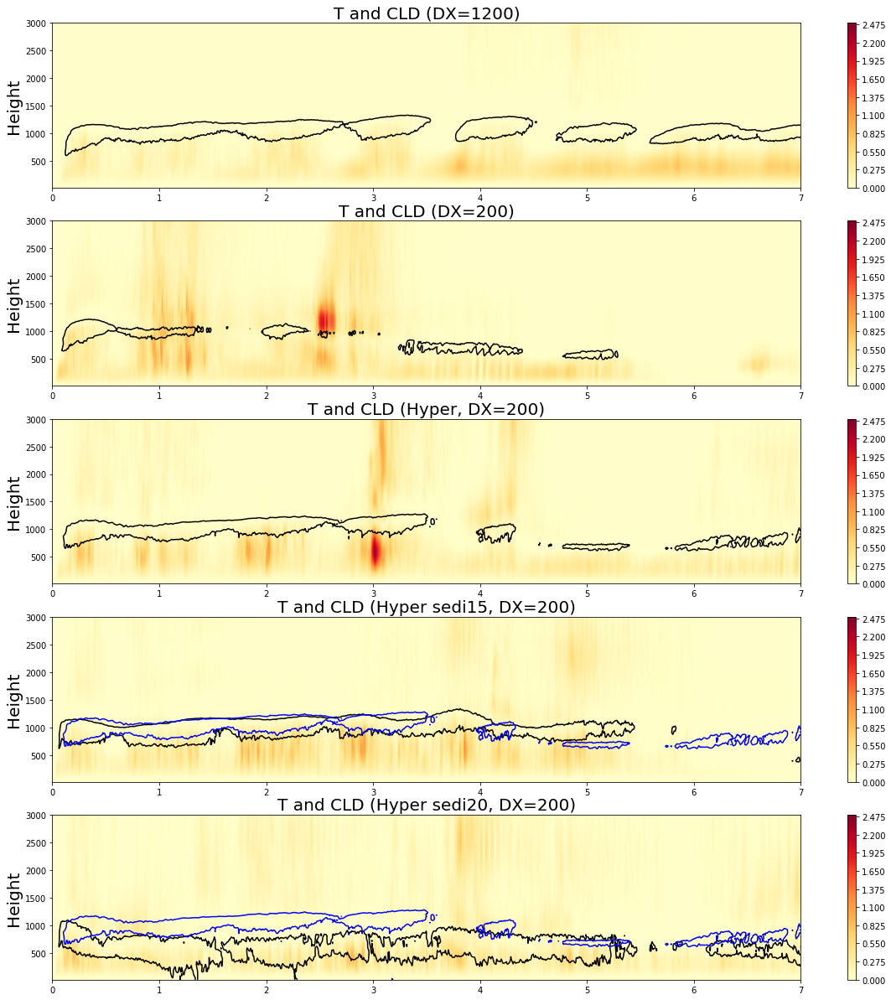

In [195]:
#  For SPCTRL and UPCTRL, both finished 5 day simulation
fig, (ax1,ax2,ax3,ax4,ax5) = plt.subplots(nrows=5, ncols=1, figsize=(20, 21))
varmin = [0]
varmax = [2.5]
varinter = [101]
vardmin = [-4]
vardmax = [4]
vardinter = [101]
num1 = 1009
num2 = 1009
time = np.linspace(0, num1, num1)
time2 = np.linspace(0, num2, num2)
time3 = np.linspace(0, 289, 289)
levels = np.linspace(varmin[0], varmax[0], varinter[0])
levels2 = np.linspace(vardmin[0], vardmax[0], vardinter[0])

cf = ax1.contourf(time/144,Z3SP,spww_crossSP,200, cmap="YlOrRd", levels=levels)
cf01 = ax1.contour(time/144,Z3SP,cld_crossSP,200,colors='k', levels=[0.2], linestyles='-')
#cf0002 = ax1.contour(time/144,Z3p,cld_cross1,200, colors='k', levels=[0.8], linestyles=':')
cb = fig.colorbar(cf, ax=ax1)
ax1.set(xlim=(0, 7), ylim=(min(Z3SP), 3000))
titlestring = ("T and CLD (DX=1200)")
tx = ax1.set_title(titlestring, fontsize=20)
#ax1.set_xlabel('Day', fontsize=20)
ax1.set_ylabel('Height', fontsize=20)

cf2 = ax2.contourf(time/144,Z3UP,spww_crossUP,200, cmap="YlOrRd", levels=levels)
cf02 = ax2.contour(time/144,Z3UP,cld_crossUP,200,colors='k', levels=[0.2], linestyles='-')
cb2 = fig.colorbar(cf2, ax=ax2)
ax2.set(xlim=(0, 7), ylim=(min(Z3UP), 3000))
titlestring = ("T and CLD (DX=200)")
tx = ax2.set_title(titlestring, fontsize=20)
#ax2.set_xlabel('Day', fontsize=20)
ax2.set_ylabel('Height', fontsize=20)

cf3 = ax3.contourf(time/144,Z3UPhy,spww_crossUPhy,200, cmap="YlOrRd", levels=levels)
cf03 = ax3.contour(time/144,Z3UPhy,cld_crossUPhy,200,colors='k', levels=[0.2], linestyles='-')
cb3 = fig.colorbar(cf3, ax=ax3)
ax3.set(xlim=(0, 7), ylim=(min(Z3UPhy), 3000))
titlestring = ("T and CLD (Hyper, DX=200)")
tx = ax3.set_title(titlestring, fontsize=20)
#ax2.set_xlabel('Day', fontsize=20)
ax3.set_ylabel('Height', fontsize=20)

cf4 = ax4.contourf(time/144,Z3UPhysedi15,spww_crossUPhysedi15,200, cmap="YlOrRd", levels=levels)
cf04 = ax4.contour(time/144,Z3UPhysedi15,cld_crossUPhysedi15,200,colors='k', levels=[0.2], linestyles='-')
cf042 = ax4.contour(time/144,Z3UPhy,cld_crossUPhy,200,colors='b', levels=[0.2], linestyles='-')
cb4 = fig.colorbar(cf4, ax=ax4)
ax4.set(xlim=(0, 7), ylim=(min(Z3UPhysedi15), 3000))
titlestring = ("T and CLD (Hyper sedi15, DX=200)")
tx = ax4.set_title(titlestring, fontsize=20)
#ax2.set_xlabel('Day', fontsize=20)
ax4.set_ylabel('Height', fontsize=20)

cf5 = ax5.contourf(time/144,Z3UPhysedi20,spww_crossUPhysedi20,200, cmap="YlOrRd", levels=levels)
cf05 = ax5.contour(time/144,Z3UPhysedi20,cld_crossUPhysedi20,200,colors='k', levels=[0.2], linestyles='-')
cf052 = ax5.contour(time/144,Z3UPhy,cld_crossUPhy,200,colors='b', levels=[0.2], linestyles='-')
cb5 = fig.colorbar(cf4, ax=ax5)
ax5.set(xlim=(0, 7), ylim=(min(Z3UPhysedi15), 3000))
titlestring = ("T and CLD (Hyper sedi20, DX=200)")
tx = ax5.set_title(titlestring, fontsize=20)
#ax2.set_xlabel('Day', fontsize=20)
ax5.set_ylabel('Height', fontsize=20)

plt.savefig('SP_UP_inispww_crosssection_Wnamibia_5_m11_TCLD_Time_Height_UP.png')
#plt.savefig('SP_UP_inispww_crosssection_WAus_102_m30_TCLD_Time_Height_UP.png')
#plt.savefig('SP_UP_inispww_crosssection_WPac_272_m14_SPWWCLD_Time_Height_UP.png')

In [62]:
CERES_PATH = '/media/liran/Elements/CERES/'
count = 0
ndays = 7
iy = 2008
CERES_FAME = 'CERES_SYN1deg-Day_Terra-Aqua-MODIS_Ed4.1_Subset_'+str(iy)+'1001-'+str(iy)+'1130.nc'
CERES_FILE = nc.Dataset(CERES_PATH+CERES_FAME, mode = 'r')
toa_sw_all_daily = CERES_FILE.variables['toa_sw_all_daily']
toa_lw_all_daily = CERES_FILE.variables['toa_lw_all_daily']
toa_solar_all_daily = CERES_FILE.variables['toa_solar_all_daily']
if count ==0: 
    fsntoa_obs      = toa_solar_all_daily[sDay-1:sDay-1+ndays,:,:]-toa_sw_all_daily[sDay-1:sDay-1+ndays,:,:]
    toa_lw_obs      = toa_lw_all_daily[sDay-1:sDay-1+ndays,:,:]
else:
    work1           = toa_solar_all_daily[sDay-1:sDay-1+ndays,:,:]-toa_sw_all_daily[sDay-1:sDay-1+ndays,:,:]
    work2           = toa_lw_all_daily[sDay-1:sDay-1+ndays,:,:]
    fsntoa_obs      = fsntoa_obs+work1
    toa_lw_obs      = toa_lw_obs+work2
print(count)
fsntoa_obs = fsntoa_obs
toa_lw_obs = toa_lw_obs
fsntoa_obs_mean = np.mean(fsntoa_obs, axis=0)
toa_lw_obs_mean = np.mean(toa_lw_obs, axis=0)
# Read coordinates
lon_CERES  = CERES_FILE.variables['lon'] # 360
lat_CERES  = CERES_FILE.variables['lat'] # 180
time_CERES = CERES_FILE.variables['time']

0


/home/liran/.local/lib/python3.7/site-packages/ipykernel_launcher.py:11: UserWarning: WARNING: valid_min not used since it
cannot be safely cast to variable data type
  # This is added back by InteractiveShellApp.init_path()
/home/liran/.local/lib/python3.7/site-packages/ipykernel_launcher.py:11: UserWarning: WARNING: valid_max not used since it
cannot be safely cast to variable data type
  # This is added back by InteractiveShellApp.init_path()
/home/liran/.local/lib/python3.7/site-packages/ipykernel_launcher.py:12: UserWarning: WARNING: valid_min not used since it
cannot be safely cast to variable data type
  if sys.path[0] == '':
/home/liran/.local/lib/python3.7/site-packages/ipykernel_launcher.py:12: UserWarning: WARNING: valid_max not used since it
cannot be safely cast to variable data type
  if sys.path[0] == '':


In [131]:
Center_lon1 = 265.0  # <<<<< Set the start longitude
Center_lat1 = -8.0  # <<<<< Set the start latitude
Center_lon2 = 265.0  # <<<<< Set the end longitude
Center_lat2 = -30.0   # <<<<< Set the end latitude

Center_lon3 = 280.00  # <<<<< Set the start longitude
Center_lat3 = -8.0  # <<<<< Set the start latitude
Center_lon4 = 280.00  # <<<<< Set the end longitude
Center_lat4 = -30.0   # <<<<< Set the end latitude

In [205]:
Center_lon1 = 0.0  # <<<<< Set the start longitude
Center_lat1 = 0.0  # <<<<< Set the start latitude
Center_lon2 = 0.0  # <<<<< Set the end longitude
Center_lat2 = -30.0   # <<<<< Set the end latitude

Center_lon3 = 10.00  # <<<<< Set the start longitude
Center_lat3 = 0.0  # <<<<< Set the start latitude
Center_lon4 = 10.00  # <<<<< Set the end longitude
Center_lat4 = -30.0   # <<<<< Set the end latitude

In [132]:
# Function calculate the distance between two points
def distancef(lat1, lon1, lat2, lon2):
    p = 0.017453292519943295
    a = 0.5 - cos((lat2-lat1)*p)/2 + cos(lat1*p)*cos(lat2*p) * (1-cos((lon2-lon1)*p)) / 2
    return 12742 * asin(sqrt(a))

In [267]:
# Function calculate the distance between two points
def lonlat_in(lat, lon, lat1, lon1, lat2, lon2):
    flag = 0
    if lon >lon1:
        if lon <lon2:
            if lat >lat1:
                if lat <lat2:
                    flag = 1
    return flag

In [206]:
# Find the column index corresponds to the minimum distance
ddmin1 = 99999999.0
for il in range(len(lon_CERES)):
    for ila in range(len(lat_CERES)):
        dd = distancef(lat_CERES[ila], lon_CERES[il], Center_lat1, Center_lon1)
        if dd<ddmin1:
            ddmin1 = dd
            minindexlon1 = il
            minindexlat1 = ila
print(ddmin1,minindexlon1,minindexlat1)

78.62618767685291 0 89


In [207]:
# Find the column index corresponds to the minimum distance
ddmin1 = 99999999.0
for il in range(len(lon_CERES)):
    for ila in range(len(lat_CERES)):
        dd = distancef(lat_CERES[ila], lon_CERES[il], Center_lat2, Center_lon2)
        if dd<ddmin1:
            ddmin1 = dd
            minindexlon2 = il
            minindexlat2 = ila
print(ddmin1,minindexlon2,minindexlat2)

73.46865591561594 0 59


In [208]:
# Find the column index corresponds to the minimum distance
ddmin1 = 99999999.0
for il in range(len(lon_CERES)):
    for ila in range(len(lat_CERES)):
        dd = distancef(lat_CERES[ila], lon_CERES[il], Center_lat3, Center_lon3)
        if dd<ddmin1:
            ddmin1 = dd
            minindexlon3 = il
            minindexlat3 = ila
print(ddmin1,minindexlon3,minindexlat3)

78.62618767685291 9 89


In [209]:
# Find the column index corresponds to the minimum distance
ddmin1 = 99999999.0
for il in range(len(lon_CERES)):
    for ila in range(len(lat_CERES)):
        dd = distancef(lat_CERES[ila], lon_CERES[il], Center_lat4, Center_lon4)
        if dd<ddmin1:
            ddmin1 = dd
            minindexlon4 = il
            minindexlat4 = ila
print(ddmin1,minindexlon4,minindexlat4)

73.46865591561594 9 59


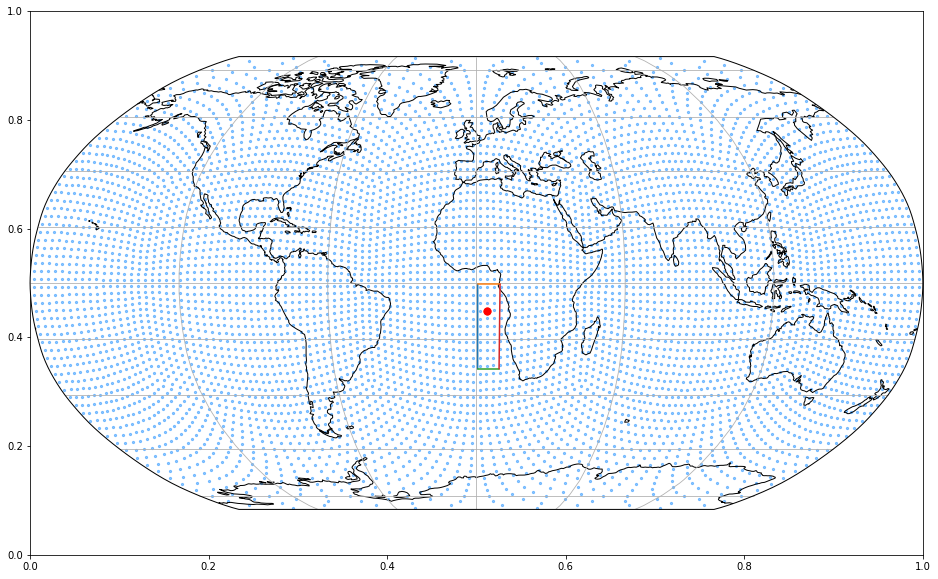

In [210]:
# Check the location of the selected column
#-- create figure and axes object
fig, ax = plt.subplots(figsize=(16,10))

#-- choose map projection
ax = fig.add_subplot(1,1,1, projection=ccrs.Robinson())
ax.set_global()
#-- add coastlines, country border lines, and grid lines
ax.coastlines()
ax.gridlines()
plt.scatter(lon[:], lat[:],
            color="dodgerblue",
            s=5,
            alpha=0.5,
            transform=ccrs.PlateCarree()) ## Important
plt.scatter(lon[indselect], lat[indselect],
            color="tomato",
            s=50,
            alpha=1,
            transform=ccrs.PlateCarree()) ## Important
plt.scatter(lon[indselect0], lat[indselect0],
            color="red",
            s=50,
            alpha=1,
            transform=ccrs.PlateCarree()) ## Important


plt.plot([lon_CERES[minindexlon1],lon_CERES[minindexlon2]],[lat_CERES[minindexlat1],lat_CERES[minindexlat2]],transform=ccrs.PlateCarree())
plt.plot([lon_CERES[minindexlon1],lon_CERES[minindexlon3]],[lat_CERES[minindexlat1],lat_CERES[minindexlat3]],transform=ccrs.PlateCarree())
plt.plot([lon_CERES[minindexlon2],lon_CERES[minindexlon4]],[lat_CERES[minindexlat2],lat_CERES[minindexlat4]],transform=ccrs.PlateCarree())
plt.plot([lon_CERES[minindexlon3],lon_CERES[minindexlon4]],[lat_CERES[minindexlat3],lat_CERES[minindexlat4]],transform=ccrs.PlateCarree())

#plt.show()
#plt.savefig('Height_Time_position_WPac_272_m14.png')
plt.savefig('Height_Time_position_WNami_5_m11.png')
#plt.savefig('Height_Time_position_WAus_102_m30.png')

In [86]:
# Read coordinates
points6 = np.zeros([6144, 2])
points6[:,0] = lon
points6[:,1] = lat
xi = lon_CERES[:]
yi = lat_CERES[:]
Xi, Yi = np.meshgrid(lon_CERES, lat_CERES)

In [211]:
hstart = 1
hend   = 1009
UP_Ensemble    = np.zeros([1,6144])
SP_Ensemble    = np.zeros([1,6144])
UPhy_Ensemble  = np.zeros([1,6144])
UPhys15_Ensemble  = np.zeros([1,6144])
UPhys20_Ensemble  = np.zeros([1,6144])
UP2008_FSNTOA                 = UP2008.variables['FSNTOA'] 
SP2008_FSNTOA                 = SP2008.variables['FSNTOA'] 
UPhy2008_FSNTOA               = UPhy2008.variables['FSNTOA'] 
UPhys15_2008_FSNTOA           = UPhysedi15.variables['FSNTOA']
UPhys20_2008_FSNTOA           = UPhysedi20.variables['FSNTOA']
UP_Ensemble[0,:] = np.mean(UP2008_FSNTOA[hstart-1:hend-1,:], axis=0)
SP_Ensemble[0,:] = np.mean(SP2008_FSNTOA[hstart-1:hend-1,:], axis=0)
UPhy_Ensemble[0,:] = np.mean(UPhy2008_FSNTOA[hstart-1:hend-1,:], axis=0)
UPhys15_Ensemble[0,:] = np.mean(UPhys15_2008_FSNTOA[:,:], axis=0)
UPhys20_Ensemble[0,:] = np.mean(UPhys20_2008_FSNTOA[:,:], axis=0)

In [212]:
 #<<<<<<<<
UPFSNTOA_Ensemble_standard        = np.mean(UP_Ensemble, axis=0)
SPFSNTOA_Ensemble_standard        = np.mean(SP_Ensemble, axis=0)
UPhyFSNTOA_Ensemble_standard      = np.mean(UPhy_Ensemble, axis=0)
UPhys15_Ensemble_standard     = np.mean(UPhys15_Ensemble, axis=0)
UPhys20_Ensemble_standard     = np.mean(UPhys20_Ensemble, axis=0)
UPFSNTOA_Ensemble_standardi  = griddata(points6,UPFSNTOA_Ensemble_standard[:], (Xi, Yi), method='nearest')
SPFSNTOA_Ensemble_standardi  = griddata(points6,SPFSNTOA_Ensemble_standard[:], (Xi, Yi), method='nearest')
UPhyFSNTOA_Ensemble_standardi  = griddata(points6,UPhyFSNTOA_Ensemble_standard[:], (Xi, Yi), method='nearest')
UPhys15_Ensemble_standardi  = griddata(points6,UPhys15_Ensemble_standard[:], (Xi, Yi), method='nearest')
UPhys20_Ensemble_standardi  = griddata(points6,UPhys20_Ensemble_standard[:], (Xi, Yi), method='nearest')

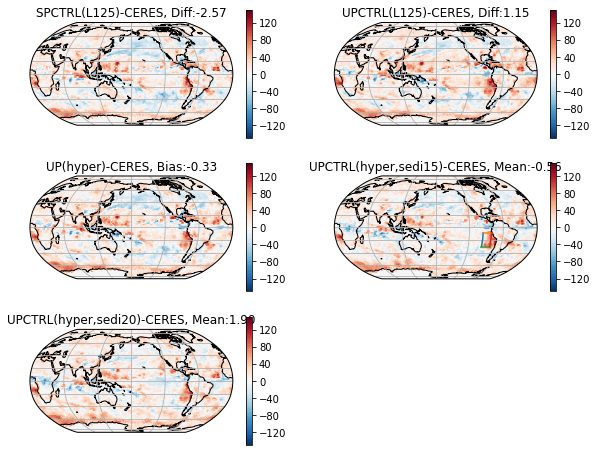

In [138]:
# Compare the Low cloud fraction
#xi = lon_ERA5[:]+180
#yi = lat_ERA5[:]
xi = lon_CERES[:]+180
yi = lat_CERES[:]
#-- create figure and axes object
fig = plt.figure(figsize=(10,8))
levels = np.linspace(0, 1, 101)
levels2 = np.linspace(-150.0, 150.0, 101)
levels3 = np.linspace(-60,60, 101)
# --------------------
ax2 = fig.add_subplot(3,2,1, projection=ccrs.Robinson(central_longitude=180.0))
ax2.coastlines()
ax2.gridlines()
cntr2=ax2.contourf(xi, yi, SPFSNTOA_Ensemble_standardi[:,:]-fsntoa_obs_mean[:,:], levels=levels2, cmap="RdBu_r",transform=ccrs.PlateCarree(central_longitude=180.0))
cb2 = fig.colorbar(cntr2, ax=ax2)
tick_locator = ticker.MaxNLocator(nbins = 9)
cb2.locator = tick_locator
cb2.update_ticks()
title2 = 'SPCTRL(L125)-CERES, Diff:'+'{:.2f}'
ax2.set_title(title2.format(np.mean(SPFSNTOA_Ensemble_standardi[:,:]-fsntoa_obs_mean[:,:])))
# --------------------
ax2 = fig.add_subplot(3,2,2, projection=ccrs.Robinson(central_longitude=180.0))
ax2.coastlines()
ax2.gridlines()
cntr2=ax2.contourf(xi, yi, UPFSNTOA_Ensemble_standardi[:,:]-fsntoa_obs_mean[:,:], levels=levels2, cmap="RdBu_r",transform=ccrs.PlateCarree(central_longitude=180.0))
cb2 = fig.colorbar(cntr2, ax=ax2)
tick_locator = ticker.MaxNLocator(nbins = 9)
cb2.locator = tick_locator
cb2.update_ticks()
title2 = 'UPCTRL(L125)-CERES, Diff:'+'{:.2f}'
ax2.set_title(title2.format(np.mean(UPFSNTOA_Ensemble_standardi[:,:]-fsntoa_obs_mean[:,:])))
# --------------------
ax6 = fig.add_subplot(3,2,3, projection=ccrs.Robinson(central_longitude=180.0))
ax6.coastlines()
ax6.gridlines()
cntr6=ax6.contourf(xi, yi, UPhyFSNTOA_Ensemble_standardi[:,:]-fsntoa_obs_mean[:,:], levels=levels2, cmap="RdBu_r",transform=ccrs.PlateCarree(central_longitude=180.0))
cb6 = fig.colorbar(cntr6, ax=ax6)
tick_locator = ticker.MaxNLocator(nbins = 9)
cb6.locator = tick_locator
cb6.update_ticks()
title6 = 'UP(hyper)-CERES, Bias:'+'{:.2f}'
ax6.set_title(title6.format(np.mean(UPhyFSNTOA_Ensemble_standardi[:,:]-fsntoa_obs_mean[:,:])))
# --------------------
ax55 = fig.add_subplot(3,2,4, projection=ccrs.Robinson(central_longitude=180.0))
ax55.set_global()
#-- add coastlines, country border lines, and grid lines
ax55.coastlines()
ax55.gridlines()
cntr55=ax55.contourf(xi, yi, UPhys15_Ensemble_standardi[:,:]-fsntoa_obs_mean[:,:], levels=levels2, cmap="RdBu_r",transform=ccrs.PlateCarree(central_longitude=180.0))
cb55 = fig.colorbar(cntr55, ax=ax55)
tick_locator = ticker.MaxNLocator(nbins = 9)
cb55.locator = tick_locator
cb55.update_ticks()
ax55.plot([lon_CERES[minindexlon1],lon_CERES[minindexlon2]],[lat_CERES[minindexlat1],lat_CERES[minindexlat2]],transform=ccrs.PlateCarree())
ax55.plot([lon_CERES[minindexlon1],lon_CERES[minindexlon3]],[lat_CERES[minindexlat1],lat_CERES[minindexlat3]],transform=ccrs.PlateCarree())
ax55.plot([lon_CERES[minindexlon2],lon_CERES[minindexlon4]],[lat_CERES[minindexlat2],lat_CERES[minindexlat4]],transform=ccrs.PlateCarree())
ax55.plot([lon_CERES[minindexlon3],lon_CERES[minindexlon4]],[lat_CERES[minindexlat3],lat_CERES[minindexlat4]],transform=ccrs.PlateCarree())
title55 = 'UPCTRL(hyper,sedi15)-CERES, Mean:'+'{:.2f}'
ax55.set_title(title55.format(np.mean(UPhys15_Ensemble_standardi[:,:]-fsntoa_obs_mean[:,:])))

# --------------------
ax55 = fig.add_subplot(3,2,5, projection=ccrs.Robinson(central_longitude=180.0))
ax55.set_global()
#-- add coastlines, country border lines, and grid lines
ax55.coastlines()
ax55.gridlines()
cntr55=ax55.contourf(xi, yi, UPhys20_Ensemble_standardi[:,:]-fsntoa_obs_mean[:,:], levels=levels2, cmap="RdBu_r",transform=ccrs.PlateCarree(central_longitude=180.0))
cb55 = fig.colorbar(cntr55, ax=ax55)
tick_locator = ticker.MaxNLocator(nbins = 9)
cb55.locator = tick_locator
cb55.update_ticks()
title55 = 'UPCTRL(hyper,sedi20)-CERES, Mean:'+'{:.2f}'
ax55.set_title(title55.format(np.mean(UPhys20_Ensemble_standardi[:,:]-fsntoa_obs_mean[:,:])))
plt.savefig('2008_FSNTOAdiffCERES_hypersedi_day0To7.png')

plt.show()

In [ ]:
SPdiff = SPFSNTOA_Ensemble_standardi[:,:]-fsntoa_obs_mean[:,:]
UPdiff = UPFSNTOA_Ensemble_standardi[:,:]-fsntoa_obs_mean[:,:]
UPhydiff = UPhyFSNTOA_Ensemble_standardi[:,:]-fsntoa_obs_mean[:,:]
UPhysedi15diff = UPhys15_Ensemble_standardi[:,:]-fsntoa_obs_mean[:,:]
UPhysedi20diff = UPhys20_Ensemble_standardi[:,:]-fsntoa_obs_mean[:,:]
SPdiff_2d = SPdiff[minindexlat4:minindexlat3,minindexlon2:minindexlon3]
UPdiff_2d = UPdiff[minindexlat4:minindexlat3,minindexlon2:minindexlon3]
UPhydiff_2d = UPhydiff[minindexlat4:minindexlat3,minindexlon2:minindexlon3]
UPhysedi15diff_2d = UPhysedi15diff[minindexlat4:minindexlat3,minindexlon2:minindexlon3]
UPhysedi20diff_2d = UPhysedi20diff[minindexlat4:minindexlat3,minindexlon2:minindexlon3]
SPdiff_1d = SPdiff_2d.flatten()
UPdiff_1d = UPdiff_2d.flatten()
UPhydiff_1d = UPhydiff_2d.flatten()
UPhysedi15diff_1d = UPhysedi15diff_2d.flatten()
UPhysedi20diff_1d = UPhysedi20diff_2d.flatten()

In [ ]:
x = np.random.randn(len(SPdiff_1d), 5)
x[:,0] = SPdiff_1d
x[:,1] = UPdiff_1d
x[:,2] = UPhydiff_1d
x[:,3] = UPhysedi15diff_1d
x[:,4] = UPhysedi20diff_1d
colors = ['green', 'blue', 'lime','red','black']
lab = ['SP', 'UP', 'UPhy','UPhysedi15','UPhysedi20']

In [ ]:
# plot (normalized) histogram of the data
import matplotlib.pyplot as plt 
#plt.hist(x, 50, facecolor='green', alpha=0.5);
plt.hist(x, 6, density = True, 
         histtype ='bar',
         color = colors,
         label = lab)
plt.legend(prop ={'size': 10})
#plt.savefig('2008_FSNTOAdiffCEREShist_hypersedi_day0To7.png')
plt.savefig('2008_FSNTOA_WNami_diffCEREShist_hypersedi_day0To7.png')
plt.show()

In [313]:
SPdiff = SPFSNTOA_Ensemble_standardi
UPdiff = UPFSNTOA_Ensemble_standardi
UPhydiff = UPhyFSNTOA_Ensemble_standardi
UPhysedi15diff = UPhys15_Ensemble_standardi
UPhysedi20diff = UPhys20_Ensemble_standardi
ObsCERES = fsntoa_obs_mean
SPdiff_2d = SPdiff[minindexlat4:minindexlat3,minindexlon2:minindexlon3]
UPdiff_2d = UPdiff[minindexlat4:minindexlat3,minindexlon2:minindexlon3]
UPhydiff_2d = UPhydiff[minindexlat4:minindexlat3,minindexlon2:minindexlon3]
UPhysedi15diff_2d = UPhysedi15diff[minindexlat4:minindexlat3,minindexlon2:minindexlon3]
UPhysedi20diff_2d = UPhysedi20diff[minindexlat4:minindexlat3,minindexlon2:minindexlon3]
ObsCERES_2d = ObsCERES[minindexlat4:minindexlat3,minindexlon2:minindexlon3]
SPdiff_1d = SPdiff_2d.flatten()
UPdiff_1d = UPdiff_2d.flatten()
UPhydiff_1d = UPhydiff_2d.flatten()
UPhysedi15diff_1d = UPhysedi15diff_2d.flatten()
UPhysedi20diff_1d = UPhysedi20diff_2d.flatten()
SPdiff = SPFSNTOA_Ensemble_standardi
UPdiff = UPFSNTOA_Ensemble_standardi
UPhydiff = UPhyFSNTOA_Ensemble_standardi
UPhysedi15diff = UPhys15_Ensemble_standardi
UPhysedi20diff = UPhys20_Ensemble_standardi
ObsCERES = fsntoa_obs_mean
SPdiff_2d = SPdiff[minindexlat4:minindexlat3,minindexlon2:minindexlon3]
UPdiff_2d = UPdiff[minindexlat4:minindexlat3,minindexlon2:minindexlon3]
UPhydiff_2d = UPhydiff[minindexlat4:minindexlat3,minindexlon2:minindexlon3]
UPhysedi15diff_2d = UPhysedi15diff[minindexlat4:minindexlat3,minindexlon2:minindexlon3]
UPhysedi20diff_2d = UPhysedi20diff[minindexlat4:minindexlat3,minindexlon2:minindexlon3]
ObsCERES_2d = ObsCERES[minindexlat4:minindexlat3,minindexlon2:minindexlon3]
SPdiff_1d = SPdiff_2d.flatten()
UPdiff_1d = UPdiff_2d.flatten()
UPhydiff_1d = UPhydiff_2d.flatten()
UPhysedi15diff_1d = UPhysedi15diff_2d.flatten()
UPhysedi20diff_1d = UPhysedi20diff_2d.flatten()
ObsCERES_1d = ObsCERES_2d.flatten()

In [314]:
x = np.random.randn(len(SPdiff_1d), 6)
x[:,0] = SPdiff_1d
x[:,1] = UPdiff_1d
x[:,2] = UPhydiff_1d
x[:,3] = UPhysedi15diff_1d
x[:,4] = UPhysedi20diff_1d
x[:,5] = UPhysedi20diff_1d
colors = ['green', 'blue', 'lime','red','magenta','black']
lab = ['SP', 'UP', 'UPhy','UPhysedi15','UPhysedi20','CERES']

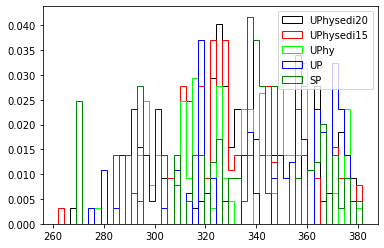

In [218]:
# plot (normalized) histogram of the data
import matplotlib.pyplot as plt 
#plt.hist(x, 50, facecolor='green', alpha=0.5);
plt.hist(x, 50, density = True, 
         histtype ='step',
         color = colors,
         label = lab)
plt.legend(prop ={'size': 10})
#plt.savefig('2008_FSNTOAdiffCEREShist_hypersedi_day0To7.png')
plt.savefig('2008_FSNTOA_WNami_diffCEREShist_hypersedi_day0To7.png')
plt.show()

In [239]:
x.shape

(270, 5)

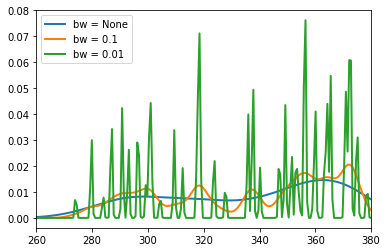

In [246]:
import numpy as np
import scipy.stats
t_range = np.linspace(260,380,200)
bw_values =  [None, 0.1, 0.01]
data = x[:,1]
kde = [scipy.stats.gaussian_kde(data,bw_method=bw) for bw in bw_values]
for i, bw in enumerate(bw_values):
    plt.plot(t_range,kde[i](t_range),lw=2, label='bw = '+str(bw))
plt.xlim(260,380)
plt.legend(loc='best')


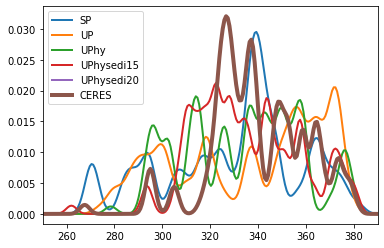

In [327]:
t_range = np.linspace(250,390,200)
exp_values = [0,1,2,3,4,5]
bw_values =  [None, 0.1, 0.01]
for ie in range(6):
    data = x[:,ie]
    kde = [scipy.stats.gaussian_kde(data,bw_method=bw) for bw in bw_values]
    if ie<5:
        plt.plot(t_range,kde[1](t_range),lw=2, label = lab[ie])
    else:
        plt.plot(t_range,kde[1](t_range),lw=4, label = lab[ie])
    plt.legend(prop ={'size': 10})
#plt.plot(t_range,kde[1](t_range),lw=4, label = lab[5])
plt.xlim(250,390)
plt.savefig('2008_FSNTOA_hist_day0To7.png')

In [251]:
Peruvian_Center_lon1 = 0.0  # <<<<< Set the start longitude
Peruvian_Center_lat1 = 0.0  # <<<<< Set the start latitude
Peruvian_Center_lon2 = 0.0  # <<<<< Set the end longitude
Peruvian_Center_lat2 = -30.0   # <<<<< Set the end latitude
Peruvian_Center_lon3 = 10.00  # <<<<< Set the start longitude
Peruvian_Center_lat3 = 0.0  # <<<<< Set the start latitude
Peruvian_Center_lon4 = 10.00  # <<<<< Set the end longitude
Peruvian_Center_lat4 = -30.0   # <<<<< Set the end latitude

# Find the column index corresponds to the minimum distance
ddmin1 = 99999999.0
for il in range(len(lon_CERES)):
    for ila in range(len(lat_CERES)):
        dd = distancef(lat_CERES[ila], lon_CERES[il], Peruvian_Center_lat1, Peruvian_Center_lon1)
        if dd<ddmin1:
            ddmin1 = dd
            minindexlon1 = il
            minindexlat1 = ila
print(ddmin1,minindexlon1,minindexlat1)
# Find the column index corresponds to the minimum distance
ddmin1 = 99999999.0
for il in range(len(lon_CERES)):
    for ila in range(len(lat_CERES)):
        dd = distancef(lat_CERES[ila], lon_CERES[il], Peruvian_Center_lat2, Peruvian_Center_lon2)
        if dd<ddmin1:
            ddmin1 = dd
            minindexlon2 = il
            minindexlat2 = ila
print(ddmin1,minindexlon2,minindexlat2)
# Find the column index corresponds to the minimum distance
ddmin1 = 99999999.0
for il in range(len(lon_CERES)):
    for ila in range(len(lat_CERES)):
        dd = distancef(lat_CERES[ila], lon_CERES[il], Peruvian_Center_lat3, Peruvian_Center_lon3)
        if dd<ddmin1:
            ddmin1 = dd
            minindexlon3 = il
            minindexlat3 = ila
print(ddmin1,minindexlon3,minindexlat3)
# Find the column index corresponds to the minimum distance
ddmin1 = 99999999.0
for il in range(len(lon_CERES)):
    for ila in range(len(lat_CERES)):
        dd = distancef(lat_CERES[ila], lon_CERES[il], Peruvian_Center_lat4, Peruvian_Center_lon4)
        if dd<ddmin1:
            ddmin1 = dd
            minindexlon4 = il
            minindexlat4 = ila
print(ddmin1,minindexlon4,minindexlat4)

78.62618767685291 0 89
73.46865591561594 0 59
78.62618767685291 9 89
73.46865591561594 9 59


In [363]:
# ERA5 data  ---------------------------------------------------------------------------------------------------
iy = 2008
ndays = 7
sDay = 1
eDay = 7
ERA5_Path = '/media/liran/PLR5/ERA5/'+str(iy)+'/'
ERA5_Ensemblelcc = np.zeros([7,24,721,1440])
ERA5_Ensemblelwp = np.zeros([7,24,721,1440])
for id in range(sDay,eDay+1,1):
    ERA5_files = xr.open_mfdataset(ERA5_Path+'ERA5_sfc_'+str(iy)+'10'+str(id).zfill(2)+'.nc')
    ERA5_hourly = ERA5_files.variables['lcc']
    ERA5_hourly2 = ERA5_files.variables['tclw']
    print(ERA5_hourly.shape)
    ERA5_Ensemblelcc[id-1,:,:,:] = ERA5_hourly
    ERA5_Ensemblelwp[id-1,:,:,:] = ERA5_hourly2

lon_ERA5  = ERA5_files.variables['longitude'] # 360
lat_ERA5  = ERA5_files.variables['latitude'] # 180Multi-CRM_Aqua_UPCTRL5_1month_frontera_ne16pg2_ne16pg2_CRM1_64_125z_200m.0.5s_crm_nx_rad_16_np_2048_nlev_125.frontera
xi = lon_ERA5[:]
yi = lat_ERA5[:]
XiERA5, YiERA5 = np.meshgrid(lon_ERA5, lat_ERA5)

(24, 721, 1440)
(24, 721, 1440)
(24, 721, 1440)
(24, 721, 1440)
(24, 721, 1440)
(24, 721, 1440)
(24, 721, 1440)


In [364]:
XiERA5.shape

(721, 1440)

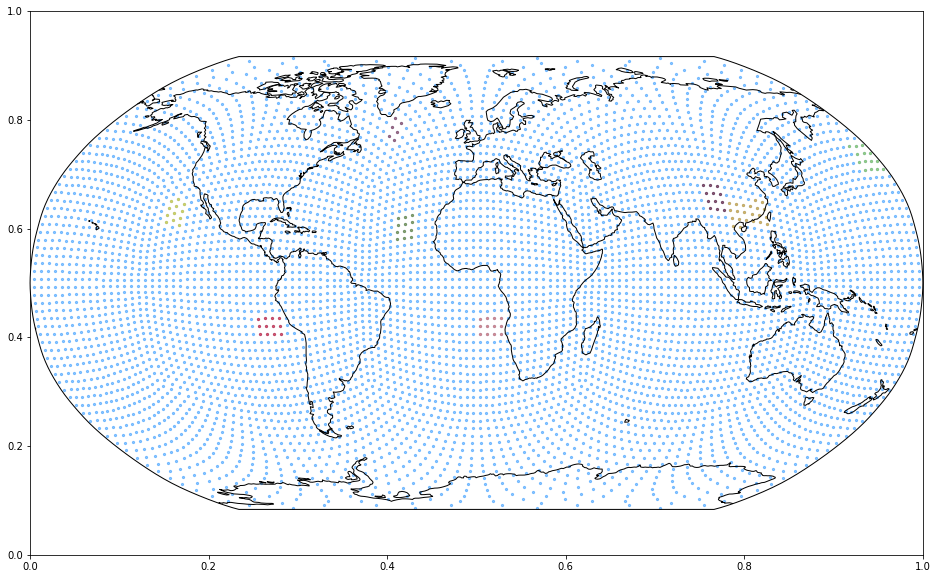

In [282]:
# Check the location of the selected column
#-- create figure and axes object
fig, ax = plt.subplots(figsize=(16,10))

#-- choose map projection
ax = fig.add_subplot(1,1,1, projection=ccrs.Robinson())
ax.set_global()
#-- add coastlines, country border lines, and grid lines
ax.coastlines()
ax.gridlines()
plt.scatter(lon[:], lat[:],
            color="dodgerblue",
            s=5,
            alpha=0.5,
            transform=ccrs.PlateCarree()) ## Important
        
for il in range(len(lon)):
    d0 = lonlat_in(lat[il], lon[il],-20,0,-10,10) # Namibian
    if d0>0:
        plt.scatter(lon[il], lat[il],
                    color="tomato",
                    s=5,
                    alpha=0.5,
                    transform=ccrs.PlateCarree()) ## Important

        
for il in range(len(lon)):
    d0 = lonlat_in(lat[il], lon[il],-20,270,-10,280) # Peruvian
    if d0>0:
        plt.scatter(lon[il], lat[il],
                    color="red",
                    s=5,
                    alpha=0.5,
                    transform=ccrs.PlateCarree()) ## Important

        
for il in range(len(lon)):
    d0 = lonlat_in(lat[il], lon[il],20,230,30,240) # Californian
    if d0>0:
        plt.scatter(lon[il], lat[il],
                    color="gold",
                    s=5,
                    alpha=0.5,
                    transform=ccrs.PlateCarree()) ## Important

for il in range(len(lon)):
    d0 = lonlat_in(lat[il], lon[il],25,95,35,105) # Australian
    if d0>0:
        plt.scatter(lon[il], lat[il],
                    color="maroon",
                    s=5,
                    alpha=0.5,
                    transform=ccrs.PlateCarree()) ## Important
        
        
for il in range(len(lon)):
    d0 = lonlat_in(lat[il], lon[il],15,325,25,335) # Canarian
    if d0>0:
        plt.scatter(lon[il], lat[il],
                    color="olive",
                    s=5,
                    alpha=0.5,
                    transform=ccrs.PlateCarree()) ## Important
        
for il in range(len(lon)):
    d0 = lonlat_in(lat[il], lon[il],40,170,50,180) # North Pacific
    if d0>0:
        plt.scatter(lon[il], lat[il],
                    color="yellowgreen",
                    s=5,
                    alpha=0.5,
                    transform=ccrs.PlateCarree()) ## Important
        
        
for il in range(len(lon)):
    d0 = lonlat_in(lat[il], lon[il],50,315,60,325) # North Atlantic
    if d0>0:
        plt.scatter(lon[il], lat[il],
                    color="brown",
                    s=5,
                    alpha=0.5,
                    transform=ccrs.PlateCarree()) ## Important

        
for il in range(len(lon)):
    d0 = lonlat_in(lat[il], lon[il],20,105,30,120) # China
    if d0>0:
        plt.scatter(lon[il], lat[il],
                    color="orange",
                    s=5,
                    alpha=0.5,
                    transform=ccrs.PlateCarree()) ## Important
#plt.scatter(lon[indselect0], lat[indselect0],
#            color="red",
#            s=50,
#            alpha=1,
#            transform=ccrs.PlateCarree()) ## Important


#plt.plot([lon_CERES[minindexlon1],lon_CERES[minindexlon2]],[lat_CERES[minindexlat1],lat_CERES[minindexlat2]],transform=ccrs.PlateCarree())
#plt.plot([lon_CERES[minindexlon1],lon_CERES[minindexlon3]],[lat_CERES[minindexlat1],lat_CERES[minindexlat3]],transform=ccrs.PlateCarree())
#plt.plot([lon_CERES[minindexlon2],lon_CERES[minindexlon4]],[lat_CERES[minindexlat2],lat_CERES[minindexlat4]],transform=ccrs.PlateCarree())
#plt.plot([lon_CERES[minindexlon3],lon_CERES[minindexlon4]],[lat_CERES[minindexlat3],lat_CERES[minindexlat4]],transform=ccrs.PlateCarree())

#plt.show()
#plt.savefig('Height_Time_position_WPac_272_m14.png')
plt.savefig('Height_Time_position_Klein_Hartmann_boxes.png')
#plt.savefig('Height_Time_position_WAus_102_m30.png')

In [283]:
TGCLDLWP_UP = UP2008.TGCLDLWP.values
TGCLDLWP_SP = SP2008.TGCLDLWP.values
TGCLDLWP_UPhy = UPhy2008.TGCLDLWP.values
TGCLDLWP_UPhysedi15 = UPhysedi15.TGCLDLWP.values
TGCLDLWP_UPhysedi20 = UPhysedi20.TGCLDLWP.values
CLDLOW_UP = UP2008.CLDLOW.values
CLDLOW_SP = SP2008.CLDLOW.values
CLDLOW_UPhy = UPhy2008.CLDLOW.values
CLDLOW_UPhysedi15 = UPhysedi15.CLDLOW.values
CLDLOW_UPhysedi20 = UPhysedi20.CLDLOW.values
FLNT_UP = UP2008.FLNT.values
FLNT_SP = SP2008.FLNT.values
FLNT_UPhy = UPhy2008.FLNT.values
FLNT_UPhysedi15 = UPhysedi15.FLNT.values
FLNT_UPhysedi20 = UPhysedi20.FLNT.values
FSNTOA_UP = UP2008.FSNTOA.values
FSNTOA_SP = SP2008.FSNTOA.values
FSNTOA_UPhy = UPhy2008.FSNTOA.values
FSNTOA_UPhysedi15 = UPhysedi15.FSNTOA.values
FSNTOA_UPhysedi20 = UPhysedi20.FSNTOA.values
PBLH_UP = UP2008.PBLH.values
PBLH_SP = SP2008.PBLH.values
PBLH_UPhy = UPhy2008.PBLH.values
PBLH_UPhysedi15 = UPhysedi15.PBLH.values
PBLH_UPhysedi20 = UPhysedi20.PBLH.values

In [381]:
T_UP = UP2008.T.values
T_SP = SP2008.T.values
T_UPhy = UPhy2008.T.values
T_UPhysedi15 = UPhysedi15.T.values
T_UPhysedi20 = UPhysedi20.T.values
Q_UP = UP2008.Q.values
Q_SP = SP2008.Q.values
Q_UPhy = UPhy2008.Q.values
Q_UPhysedi15 = UPhysedi15.Q.values
Q_UPhysedi20 = UPhysedi20.Q.values

In [376]:
countt = 0
XiERA5_1d = XiERA5.flatten()
YiERA5_1d = YiERA5.flatten()
temp = np.zeros([721,1440])
temp2 = np.zeros([721,1440])
ERA5_lwcPeruvian = np.zeros([24*7])
ERA5_lccPeruvian = np.zeros([24*7])
ERA5_lwcNamibian = np.zeros([24*7])
ERA5_lccNamibian = np.zeros([24*7])
ERA5_lwcCalifornian = np.zeros([24*7])
ERA5_lccCalifornian = np.zeros([24*7])
ERA5_lwcAustralian = np.zeros([24*7])
ERA5_lccAustralian = np.zeros([24*7])
ERA5_lwcCanarian = np.zeros([24*7])
ERA5_lccCanarian = np.zeros([24*7])
ERA5_lwcNPacific = np.zeros([24*7])
ERA5_lccNPacific = np.zeros([24*7])
ERA5_lwcNAtlantic = np.zeros([24*7])
ERA5_lccNAtlantic = np.zeros([24*7])
ERA5_lwcChina = np.zeros([24*7])
ERA5_lccChina = np.zeros([24*7])
ERA_Time = np.zeros([24*7])
for iday in range(7):
    print(iday)
    for ihour in range(24):
        temp[:,:] = ERA5_Ensemblelwp[iday,ihour,:,:]
        temp2[:,:] = ERA5_Ensemblelcc[iday,ihour,:,:]
        temp1d = temp.flatten()
        temp21d = temp2.flatten()
        counttt = 0
        counttt2 = 0
        counttt3 = 0
        counttt4 = 0
        counttt5 = 0
        counttt6 = 0
        counttt7 = 0
        counttt8 = 0
        for il in range(len(temp1d)):
            d0 = lonlat_in(YiERA5_1d[il], XiERA5_1d[il],-20,270,-10,280) # Peruvian
            if d0>0:
                ERA5_lwcPeruvian[countt] = ERA5_lwcPeruvian[countt] + temp1d[il]
                ERA5_lccPeruvian[countt] = ERA5_lccPeruvian[countt] + temp21d[il]
                counttt = counttt + 1
            d0 = lonlat_in(YiERA5_1d[il], XiERA5_1d[il],-20,0,-10,10) # Namibian
            if d0>0:
                ERA5_lwcNamibian[countt] = ERA5_lwcNamibian[countt] + temp1d[il]
                ERA5_lccNamibian[countt] = ERA5_lccNamibian[countt] + temp21d[il]
                counttt2 = counttt2 + 1
            d0 = lonlat_in(YiERA5_1d[il], XiERA5_1d[il],20,230,30,240) # Californian
            if d0>0:
                ERA5_lwcCalifornian[countt] = ERA5_lwcCalifornian[countt] + temp1d[il]
                ERA5_lccCalifornian[countt] = ERA5_lccCalifornian[countt] + temp21d[il]
                counttt3 = counttt3 + 1
            d0 = lonlat_in(YiERA5_1d[il], XiERA5_1d[il],25,95,35,105) # Australian
            if d0>0:
                ERA5_lwcAustralian[countt] = ERA5_lwcAustralian[countt] + temp1d[il]
                ERA5_lccAustralian[countt] = ERA5_lccAustralian[countt] + temp21d[il]
                counttt4 = counttt4 + 1
            d0 = lonlat_in(YiERA5_1d[il], XiERA5_1d[il],15,325,25,335) # Canarian
            if d0>0:
                ERA5_lwcCanarian[countt] = ERA5_lwcCanarian[countt] + temp1d[il]
                ERA5_lccCanarian[countt] = ERA5_lccCanarian[countt] + temp21d[il]
                counttt5 = counttt5 + 1
            d0 = lonlat_in(YiERA5_1d[il], XiERA5_1d[il],40,170,50,180) # North Pacific
            if d0>0:
                ERA5_lwcNPacific[countt] = ERA5_lwcNPacific[countt] + temp1d[il]
                ERA5_lccNPacific[countt] = ERA5_lccNPacific[countt] + temp21d[il]
                counttt6 = counttt6 + 1
            d0 = lonlat_in(YiERA5_1d[il], XiERA5_1d[il],50,315,60,325) # North Atlantic
            if d0>0:
                ERA5_lwcNAtlantic[countt] = ERA5_lwcNAtlantic[countt] + temp1d[il]
                ERA5_lccNAtlantic[countt] = ERA5_lccNAtlantic[countt] + temp21d[il]
                counttt7 = counttt7 + 1
            d0 = lonlat_in(YiERA5_1d[il], XiERA5_1d[il],20,105,30,120) # China
            if d0>0:
                ERA5_lwcChina[countt] = ERA5_lwcChina[countt] + temp1d[il]
                ERA5_lccChina[countt] = ERA5_lccChina[countt] + temp21d[il]
                counttt8 = counttt8 + 1
        ERA5_lwcPeruvian[countt] = ERA5_lwcPeruvian[countt]/counttt
        ERA5_lccPeruvian[countt] = ERA5_lccPeruvian[countt]/counttt
        ERA5_lwcNamibian[countt] = ERA5_lwcNamibian[countt]/counttt2
        ERA5_lccNamibian[countt] = ERA5_lccNamibian[countt]/counttt2
        ERA5_lwcCalifornian[countt] = ERA5_lwcCalifornian[countt]/counttt3
        ERA5_lccCalifornian[countt] = ERA5_lccCalifornian[countt]/counttt3
        ERA5_lwcAustralian[countt] = ERA5_lwcAustralian[countt]/counttt4
        ERA5_lccAustralian[countt] = ERA5_lccAustralian[countt]/counttt4
        ERA5_lwcCanarian[countt] = ERA5_lwcCanarian[countt]/counttt5
        ERA5_lccCanarian[countt] = ERA5_lccCanarian[countt]/counttt5
        ERA5_lwcNPacific[countt] = ERA5_lwcNPacific[countt]/counttt6
        ERA5_lccNPacific[countt] = ERA5_lccNPacific[countt]/counttt6
        ERA5_lwcNAtlantic[countt] = ERA5_lwcNAtlantic[countt]/counttt7
        ERA5_lccNAtlantic[countt] = ERA5_lccNAtlantic[countt]/counttt7
        ERA5_lwcChina[countt] = ERA5_lwcChina[countt]/counttt8
        ERA5_lccChina[countt] = ERA5_lccChina[countt]/counttt8
        ERA_Time[countt] = iday + ihour/24
        countt = countt+1

0
1
2
3
4
5
6


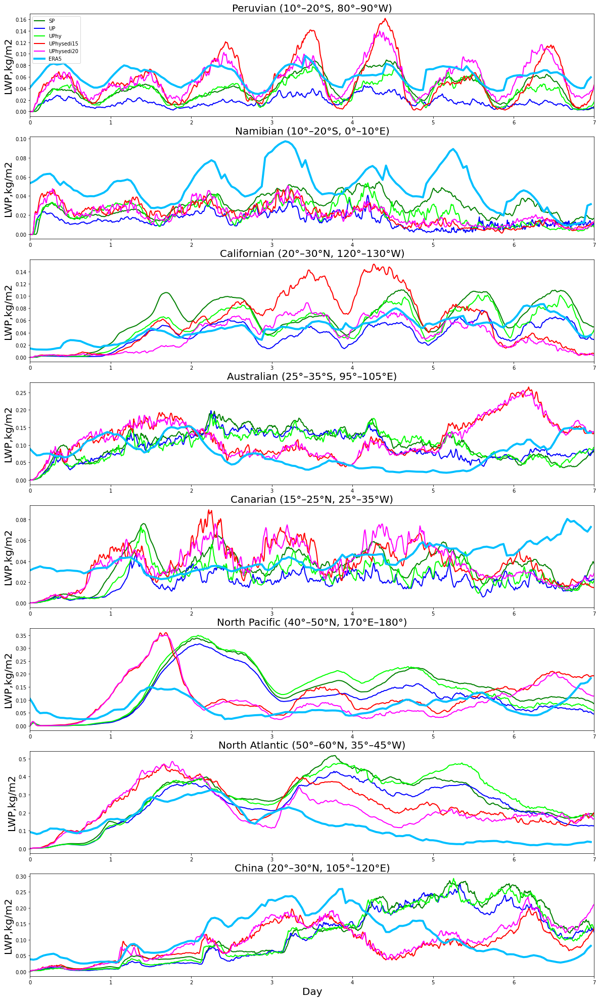

In [379]:
fig, (ax1,ax2,ax3,ax4,ax5,ax6,ax7,ax8) = plt.subplots(nrows=8, ncols=1, figsize=(20, 35))
# --------------------
LWP_SP = np.zeros([1009])
LWP_UP = np.zeros([1009])
LWP_UPhy = np.zeros([1009])
LWP_UPhysedi15 = np.zeros([1009])
LWP_UPhysedi20 = np.zeros([1009])

for it in range(len(LWP_SP)):
    count = 0
    for il in range(len(lon)):
        d0 = lonlat_in(lat[il], lon[il],-20,270,-10,280) # Peruvian
        if d0>0:
            LWP_SP[it]         = LWP_SP[it] + TGCLDLWP_SP[it,il]
            LWP_UP[it]         = LWP_UP[it] + TGCLDLWP_UP[it,il]
            LWP_UPhy[it]       = LWP_UPhy[it] + TGCLDLWP_UPhy[it,il]
            LWP_UPhysedi15[it] = LWP_UPhysedi15[it] + TGCLDLWP_UPhysedi15[it,il]
            LWP_UPhysedi20[it] = LWP_UPhysedi20[it] + TGCLDLWP_UPhysedi20[it,il]
            count = count + 1
    LWP_SP[it] = LWP_SP[it]/count
    LWP_UP[it] = LWP_UP[it]/count
    LWP_UPhy[it] = LWP_UPhy[it]/count
    LWP_UPhysedi15[it] = LWP_UPhysedi15[it]/count
    LWP_UPhysedi20[it] = LWP_UPhysedi20[it]/count
    
ax1.plot(time/144,LWP_SP,lw=2, color = colors[0],label = lab[0])
ax1.plot(time/144,LWP_UP,lw=2, color = colors[1],label = lab[1])
ax1.plot(time/144,LWP_UPhy,lw=2, color = colors[2],label = lab[2])
ax1.plot(time/144,LWP_UPhysedi15,lw=2, color = colors[3],label = lab[3])
ax1.plot(time/144,LWP_UPhysedi20,lw=2, color = colors[4],label = lab[4])
ax1.plot(ERA_Time,ERA5_lwcPeruvian,lw=4, color = 'deepskyblue',label = 'ERA5')
ax1.legend(prop ={'size': 10})
ax1.set(xlim=(0, 7))
titlestring = ("Peruvian (10°–20°S, 80°–90°W)")
tx = ax1.set_title(titlestring, fontsize=20)
#ax2.set_xlabel('Day', fontsize=20)
ax1.set_ylabel('LWP,kg/m2', fontsize=20)


for it in range(len(LWP_SP)):
    count = 0
    for il in range(len(lon)):
        d0 = lonlat_in(lat[il], lon[il],-20,0,-10,10) # Namibian
        if d0>0:
            LWP_SP[it]         = LWP_SP[it] + TGCLDLWP_SP[it,il]
            LWP_UP[it]         = LWP_UP[it] + TGCLDLWP_UP[it,il]
            LWP_UPhy[it]       = LWP_UPhy[it] + TGCLDLWP_UPhy[it,il]
            LWP_UPhysedi15[it] = LWP_UPhysedi15[it] + TGCLDLWP_UPhysedi15[it,il]
            LWP_UPhysedi20[it] = LWP_UPhysedi20[it] + TGCLDLWP_UPhysedi20[it,il]
            count = count + 1
    LWP_SP[it] = LWP_SP[it]/count
    LWP_UP[it] = LWP_UP[it]/count
    LWP_UPhy[it] = LWP_UPhy[it]/count
    LWP_UPhysedi15[it] = LWP_UPhysedi15[it]/count
    LWP_UPhysedi20[it] = LWP_UPhysedi20[it]/count
    
ax2.plot(time/144,LWP_SP,lw=2, color = colors[0],label = lab[0])
ax2.plot(time/144,LWP_UP,lw=2, color = colors[1],label = lab[1])
ax2.plot(time/144,LWP_UPhy,lw=2, color = colors[2],label = lab[2])
ax2.plot(time/144,LWP_UPhysedi15,lw=2, color = colors[3],label = lab[3])
ax2.plot(time/144,LWP_UPhysedi20,lw=2, color = colors[4],label = lab[4])
ax2.plot(ERA_Time,ERA5_lwcNamibian,lw=4, color = 'deepskyblue',label = 'ERA5')
ax2.set(xlim=(0, 7))
titlestring = ("Namibian (10°–20°S, 0°–10°E)")
tx = ax2.set_title(titlestring, fontsize=20)
#ax2.set_xlabel('Day', fontsize=20)
ax2.set_ylabel('LWP,kg/m2', fontsize=20)


for it in range(len(LWP_SP)):
    count = 0
    for il in range(len(lon)):
        d0 = lonlat_in(lat[il], lon[il],20,230,30,240) # Californian
        if d0>0:
            LWP_SP[it]         = LWP_SP[it] + TGCLDLWP_SP[it,il]
            LWP_UP[it]         = LWP_UP[it] + TGCLDLWP_UP[it,il]
            LWP_UPhy[it]       = LWP_UPhy[it] + TGCLDLWP_UPhy[it,il]
            LWP_UPhysedi15[it] = LWP_UPhysedi15[it] + TGCLDLWP_UPhysedi15[it,il]
            LWP_UPhysedi20[it] = LWP_UPhysedi20[it] + TGCLDLWP_UPhysedi20[it,il]
            count = count + 1
    LWP_SP[it] = LWP_SP[it]/count
    LWP_UP[it] = LWP_UP[it]/count
    LWP_UPhy[it] = LWP_UPhy[it]/count
    LWP_UPhysedi15[it] = LWP_UPhysedi15[it]/count
    LWP_UPhysedi20[it] = LWP_UPhysedi20[it]/count
    
ax3.plot(time/144,LWP_SP,lw=2, color = colors[0],label = lab[0])
ax3.plot(time/144,LWP_UP,lw=2, color = colors[1],label = lab[1])
ax3.plot(time/144,LWP_UPhy,lw=2, color = colors[2],label = lab[2])
ax3.plot(time/144,LWP_UPhysedi15,lw=2, color = colors[3],label = lab[3])
ax3.plot(time/144,LWP_UPhysedi20,lw=2, color = colors[4],label = lab[4])
ax3.plot(ERA_Time,ERA5_lwcCalifornian,lw=4, color = 'deepskyblue',label = 'ERA5')
ax3.set(xlim=(0, 7))
titlestring = ("Californian (20°–30°N, 120°–130°W)")
tx = ax3.set_title(titlestring, fontsize=20)
#ax2.set_xlabel('Day', fontsize=20)
ax3.set_ylabel('LWP,kg/m2', fontsize=20)


for it in range(len(LWP_SP)):
    count = 0
    for il in range(len(lon)):
        d0 = lonlat_in(lat[il], lon[il],25,95,35,105) # Australian
        if d0>0:
            LWP_SP[it]         = LWP_SP[it] + TGCLDLWP_SP[it,il]
            LWP_UP[it]         = LWP_UP[it] + TGCLDLWP_UP[it,il]
            LWP_UPhy[it]       = LWP_UPhy[it] + TGCLDLWP_UPhy[it,il]
            LWP_UPhysedi15[it] = LWP_UPhysedi15[it] + TGCLDLWP_UPhysedi15[it,il]
            LWP_UPhysedi20[it] = LWP_UPhysedi20[it] + TGCLDLWP_UPhysedi20[it,il]
            count = count + 1
    LWP_SP[it] = LWP_SP[it]/count
    LWP_UP[it] = LWP_UP[it]/count
    LWP_UPhy[it] = LWP_UPhy[it]/count
    LWP_UPhysedi15[it] = LWP_UPhysedi15[it]/count
    LWP_UPhysedi20[it] = LWP_UPhysedi20[it]/count
    
ax4.plot(time/144,LWP_SP,lw=2, color = colors[0],label = lab[0])
ax4.plot(time/144,LWP_UP,lw=2, color = colors[1],label = lab[1])
ax4.plot(time/144,LWP_UPhy,lw=2, color = colors[2],label = lab[2])
ax4.plot(time/144,LWP_UPhysedi15,lw=2, color = colors[3],label = lab[3])
ax4.plot(time/144,LWP_UPhysedi20,lw=2, color = colors[4],label = lab[4])
ax4.plot(ERA_Time,ERA5_lwcAustralian,lw=4, color = 'deepskyblue',label = 'ERA5')
ax4.set(xlim=(0, 7))
titlestring = ("Australian (25°–35°S, 95°–105°E)")
tx = ax4.set_title(titlestring, fontsize=20)
#ax2.set_xlabel('Day', fontsize=20)
ax4.set_ylabel('LWP,kg/m2', fontsize=20)


for it in range(len(LWP_SP)):
    count = 0
    for il in range(len(lon)):
        d0 = lonlat_in(lat[il], lon[il],15,325,25,335) # Canarian
        if d0>0:
            LWP_SP[it]         = LWP_SP[it] + TGCLDLWP_SP[it,il]
            LWP_UP[it]         = LWP_UP[it] + TGCLDLWP_UP[it,il]
            LWP_UPhy[it]       = LWP_UPhy[it] + TGCLDLWP_UPhy[it,il]
            LWP_UPhysedi15[it] = LWP_UPhysedi15[it] + TGCLDLWP_UPhysedi15[it,il]
            LWP_UPhysedi20[it] = LWP_UPhysedi20[it] + TGCLDLWP_UPhysedi20[it,il]
            count = count + 1
    LWP_SP[it] = LWP_SP[it]/count
    LWP_UP[it] = LWP_UP[it]/count
    LWP_UPhy[it] = LWP_UPhy[it]/count
    LWP_UPhysedi15[it] = LWP_UPhysedi15[it]/count
    LWP_UPhysedi20[it] = LWP_UPhysedi20[it]/count
    
ax5.plot(time/144,LWP_SP,lw=2, color = colors[0],label = lab[0])
ax5.plot(time/144,LWP_UP,lw=2, color = colors[1],label = lab[1])
ax5.plot(time/144,LWP_UPhy,lw=2, color = colors[2],label = lab[2])
ax5.plot(time/144,LWP_UPhysedi15,lw=2, color = colors[3],label = lab[3])
ax5.plot(time/144,LWP_UPhysedi20,lw=2, color = colors[4],label = lab[4])
ax5.plot(ERA_Time,ERA5_lwcCanarian,lw=4, color = 'deepskyblue',label = 'ERA5')
ax5.set(xlim=(0, 7))
titlestring = ("Canarian (15°–25°N, 25°–35°W)")
tx = ax5.set_title(titlestring, fontsize=20)
#ax2.set_xlabel('Day', fontsize=20)
ax5.set_ylabel('LWP,kg/m2', fontsize=20)


for it in range(len(LWP_SP)):
    count = 0
    for il in range(len(lon)):
        d0 = lonlat_in(lat[il], lon[il],40,170,50,180) # Namibian
        if d0>0:
            LWP_SP[it]         = LWP_SP[it] + TGCLDLWP_SP[it,il]
            LWP_UP[it]         = LWP_UP[it] + TGCLDLWP_UP[it,il]
            LWP_UPhy[it]       = LWP_UPhy[it] + TGCLDLWP_UPhy[it,il]
            LWP_UPhysedi15[it] = LWP_UPhysedi15[it] + TGCLDLWP_UPhysedi15[it,il]
            LWP_UPhysedi20[it] = LWP_UPhysedi20[it] + TGCLDLWP_UPhysedi20[it,il]
            count = count + 1
    LWP_SP[it] = LWP_SP[it]/count
    LWP_UP[it] = LWP_UP[it]/count
    LWP_UPhy[it] = LWP_UPhy[it]/count
    LWP_UPhysedi15[it] = LWP_UPhysedi15[it]/count
    LWP_UPhysedi20[it] = LWP_UPhysedi20[it]/count
    
ax6.plot(time/144,LWP_SP,lw=2, color = colors[0],label = lab[0])
ax6.plot(time/144,LWP_UP,lw=2, color = colors[1],label = lab[1])
ax6.plot(time/144,LWP_UPhy,lw=2, color = colors[2],label = lab[2])
ax6.plot(time/144,LWP_UPhysedi15,lw=2, color = colors[3],label = lab[3])
ax6.plot(time/144,LWP_UPhysedi20,lw=2, color = colors[4],label = lab[4])
ax6.plot(ERA_Time,ERA5_lwcNPacific,lw=4, color = 'deepskyblue',label = 'ERA5')
ax6.set(xlim=(0, 7))
titlestring = ("North Pacific (40°–50°N, 170°E–180°)")
tx = ax6.set_title(titlestring, fontsize=20)
#ax2.set_xlabel('Day', fontsize=20)
ax6.set_ylabel('LWP,kg/m2', fontsize=20)

for it in range(len(LWP_SP)):
    count = 0
    for il in range(len(lon)):
        d0 = lonlat_in(lat[il], lon[il],50,315,60,325) # Namibian
        if d0>0:
            LWP_SP[it]         = LWP_SP[it] + TGCLDLWP_SP[it,il]
            LWP_UP[it]         = LWP_UP[it] + TGCLDLWP_UP[it,il]
            LWP_UPhy[it]       = LWP_UPhy[it] + TGCLDLWP_UPhy[it,il]
            LWP_UPhysedi15[it] = LWP_UPhysedi15[it] + TGCLDLWP_UPhysedi15[it,il]
            LWP_UPhysedi20[it] = LWP_UPhysedi20[it] + TGCLDLWP_UPhysedi20[it,il]
            count = count + 1
    LWP_SP[it] = LWP_SP[it]/count
    LWP_UP[it] = LWP_UP[it]/count
    LWP_UPhy[it] = LWP_UPhy[it]/count
    LWP_UPhysedi15[it] = LWP_UPhysedi15[it]/count
    LWP_UPhysedi20[it] = LWP_UPhysedi20[it]/count
    
ax7.plot(time/144,LWP_SP,lw=2, color = colors[0],label = lab[0])
ax7.plot(time/144,LWP_UP,lw=2, color = colors[1],label = lab[1])
ax7.plot(time/144,LWP_UPhy,lw=2, color = colors[2],label = lab[2])
ax7.plot(time/144,LWP_UPhysedi15,lw=2, color = colors[3],label = lab[3])
ax7.plot(time/144,LWP_UPhysedi20,lw=2, color = colors[4],label = lab[4])
ax7.plot(ERA_Time,ERA5_lwcNAtlantic,lw=4, color = 'deepskyblue',label = 'ERA5')
ax7.set(xlim=(0, 7))
titlestring = ("North Atlantic (50°–60°N, 35°–45°W)")
tx = ax7.set_title(titlestring, fontsize=20)
#ax2.set_xlabel('Day', fontsize=20)
ax7.set_ylabel('LWP,kg/m2', fontsize=20)

for it in range(len(LWP_SP)):
    count = 0
    for il in range(len(lon)):
        d0 = lonlat_in(lat[il], lon[il],20,105,30,120) # Namibian
        if d0>0:
            LWP_SP[it]         = LWP_SP[it] + TGCLDLWP_SP[it,il]
            LWP_UP[it]         = LWP_UP[it] + TGCLDLWP_UP[it,il]
            LWP_UPhy[it]       = LWP_UPhy[it] + TGCLDLWP_UPhy[it,il]
            LWP_UPhysedi15[it] = LWP_UPhysedi15[it] + TGCLDLWP_UPhysedi15[it,il]
            LWP_UPhysedi20[it] = LWP_UPhysedi20[it] + TGCLDLWP_UPhysedi20[it,il]
            count = count + 1
    LWP_SP[it] = LWP_SP[it]/count
    LWP_UP[it] = LWP_UP[it]/count
    LWP_UPhy[it] = LWP_UPhy[it]/count
    LWP_UPhysedi15[it] = LWP_UPhysedi15[it]/count
    LWP_UPhysedi20[it] = LWP_UPhysedi20[it]/count
    
ax8.plot(time/144,LWP_SP,lw=2, color = colors[0],label = lab[0])
ax8.plot(time/144,LWP_UP,lw=2, color = colors[1],label = lab[1])
ax8.plot(time/144,LWP_UPhy,lw=2, color = colors[2],label = lab[2])
ax8.plot(time/144,LWP_UPhysedi15,lw=2, color = colors[3],label = lab[3])
ax8.plot(time/144,LWP_UPhysedi20,lw=2, color = colors[4],label = lab[4])
ax8.plot(ERA_Time,ERA5_lwcChina,lw=4, color = 'deepskyblue',label = 'ERA5')
ax8.set(xlim=(0, 7))
titlestring = ("China (20°–30°N, 105°–120°E)")
tx = ax8.set_title(titlestring, fontsize=20)
#ax2.set_xlabel('Day', fontsize=20)
ax8.set_ylabel('LWP,kg/m2', fontsize=20)
ax8.set_xlabel('Day', fontsize=20)
plt.savefig('LWP_Klein_Hartmann_boxes.png')

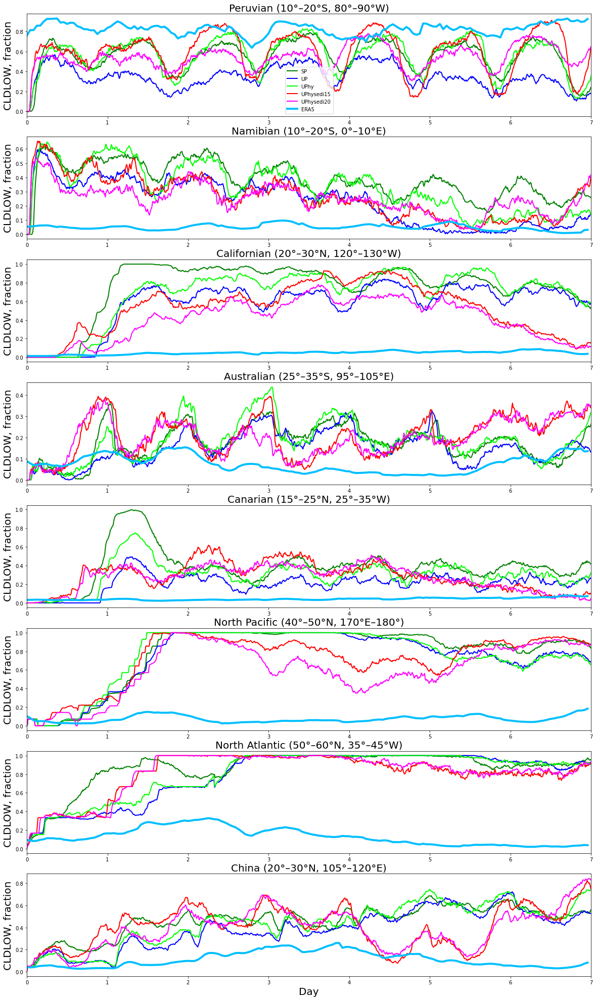

In [380]:
fig, (ax1,ax2,ax3,ax4,ax5,ax6,ax7,ax8) = plt.subplots(nrows=8, ncols=1, figsize=(20, 35))
# --------------------
CLOW_SP = np.zeros([1009])
CLOW_UP = np.zeros([1009])
CLOW_UPhy = np.zeros([1009])
CLOW_UPhysedi15 = np.zeros([1009])
CLOW_UPhysedi20 = np.zeros([1009])

for it in range(len(LWP_SP)):
    count = 0
    for il in range(len(lon)):
        d0 = lonlat_in(lat[il], lon[il],-20,270,-10,280) # Peruvian
        if d0>0:
            CLOW_SP[it]         = CLOW_SP[it] + CLDLOW_SP[it,il]
            CLOW_UP[it]         = CLOW_UP[it] + CLDLOW_UP[it,il]
            CLOW_UPhy[it]       = CLOW_UPhy[it] + CLDLOW_UPhy[it,il]
            CLOW_UPhysedi15[it] = CLOW_UPhysedi15[it] + CLDLOW_UPhysedi15[it,il]
            CLOW_UPhysedi20[it] = CLOW_UPhysedi20[it] + CLDLOW_UPhysedi20[it,il]
            count = count + 1
    CLOW_SP[it] = CLOW_SP[it]/count
    CLOW_UP[it] = CLOW_UP[it]/count
    CLOW_UPhy[it] = CLOW_UPhy[it]/count
    CLOW_UPhysedi15[it] = CLOW_UPhysedi15[it]/count
    CLOW_UPhysedi20[it] = CLOW_UPhysedi20[it]/count
    
ax1.plot(time/144,CLOW_SP,lw=2, color = colors[0],label = lab[0])
ax1.plot(time/144,CLOW_UP,lw=2, color = colors[1],label = lab[1])
ax1.plot(time/144,CLOW_UPhy,lw=2, color = colors[2],label = lab[2])
ax1.plot(time/144,CLOW_UPhysedi15,lw=2, color = colors[3],label = lab[3])
ax1.plot(time/144,CLOW_UPhysedi20,lw=2, color = colors[4],label = lab[4])
ax1.plot(ERA_Time,ERA5_lccPeruvian,lw=4, color = 'deepskyblue',label = 'ERA5')
ax1.legend(prop ={'size': 10})
ax1.set(xlim=(0, 7))
titlestring = ("Peruvian (10°–20°S, 80°–90°W)")
tx = ax1.set_title(titlestring, fontsize=20)
#ax2.set_xlabel('Day', fontsize=20)
ax1.set_ylabel('CLDLOW, fraction', fontsize=20)

CLOW_SP = np.zeros([1009])
CLOW_UP = np.zeros([1009])
CLOW_UPhy = np.zeros([1009])
CLOW_UPhysedi15 = np.zeros([1009])
CLOW_UPhysedi20 = np.zeros([1009])
for it in range(len(LWP_SP)):
    count = 0
    for il in range(len(lon)):
        d0 = lonlat_in(lat[il], lon[il],-20,0,-10,10) # Namibian
        if d0>0:
            CLOW_SP[it]         = CLOW_SP[it] + CLDLOW_SP[it,il]
            CLOW_UP[it]         = CLOW_UP[it] + CLDLOW_UP[it,il]
            CLOW_UPhy[it]       = CLOW_UPhy[it] + CLDLOW_UPhy[it,il]
            CLOW_UPhysedi15[it] = CLOW_UPhysedi15[it] + CLDLOW_UPhysedi15[it,il]
            CLOW_UPhysedi20[it] = CLOW_UPhysedi20[it] + CLDLOW_UPhysedi20[it,il]
            count = count + 1
    CLOW_SP[it] = CLOW_SP[it]/count
    CLOW_UP[it] = CLOW_UP[it]/count
    CLOW_UPhy[it] = CLOW_UPhy[it]/count
    CLOW_UPhysedi15[it] = CLOW_UPhysedi15[it]/count
    CLOW_UPhysedi20[it] = CLOW_UPhysedi20[it]/count
    
ax2.plot(time/144,CLOW_SP,lw=2, color = colors[0],label = lab[0])
ax2.plot(time/144,CLOW_UP,lw=2, color = colors[1],label = lab[1])
ax2.plot(time/144,CLOW_UPhy,lw=2, color = colors[2],label = lab[2])
ax2.plot(time/144,CLOW_UPhysedi15,lw=2, color = colors[3],label = lab[3])
ax2.plot(time/144,CLOW_UPhysedi20,lw=2, color = colors[4],label = lab[4])
ax2.plot(ERA_Time,ERA5_lwcNamibian,lw=4, color = 'deepskyblue',label = 'ERA5')
ax2.set(xlim=(0, 7))
titlestring = ("Namibian (10°–20°S, 0°–10°E)")
tx = ax2.set_title(titlestring, fontsize=20)
#ax2.set_xlabel('Day', fontsize=20)
ax2.set_ylabel('CLDLOW, fraction', fontsize=20)

CLOW_SP = np.zeros([1009])
CLOW_UP = np.zeros([1009])
CLOW_UPhy = np.zeros([1009])
CLOW_UPhysedi15 = np.zeros([1009])
CLOW_UPhysedi20 = np.zeros([1009])
for it in range(len(LWP_SP)):
    count = 0
    for il in range(len(lon)):
        d0 = lonlat_in(lat[il], lon[il],20,230,30,240) # Californian
        if d0>0:
            CLOW_SP[it]         = CLOW_SP[it] + CLDLOW_SP[it,il]
            CLOW_UP[it]         = CLOW_UP[it] + CLDLOW_UP[it,il]
            CLOW_UPhy[it]       = CLOW_UPhy[it] + CLDLOW_UPhy[it,il]
            CLOW_UPhysedi15[it] = CLOW_UPhysedi15[it] + CLDLOW_UPhysedi15[it,il]
            CLOW_UPhysedi20[it] = CLOW_UPhysedi20[it] + CLDLOW_UPhysedi20[it,il]
            count = count + 1
    CLOW_SP[it] = CLOW_SP[it]/count
    CLOW_UP[it] = CLOW_UP[it]/count
    CLOW_UPhy[it] = CLOW_UPhy[it]/count
    CLOW_UPhysedi15[it] = CLOW_UPhysedi15[it]/count
    CLOW_UPhysedi20[it] = CLOW_UPhysedi20[it]/count
    
ax3.plot(time/144,CLOW_SP,lw=2, color = colors[0],label = lab[0])
ax3.plot(time/144,CLOW_UP,lw=2, color = colors[1],label = lab[1])
ax3.plot(time/144,CLOW_UPhy,lw=2, color = colors[2],label = lab[2])
ax3.plot(time/144,CLOW_UPhysedi15,lw=2, color = colors[3],label = lab[3])
ax3.plot(time/144,CLOW_UPhysedi20,lw=2, color = colors[4],label = lab[4])
ax3.plot(ERA_Time,ERA5_lwcCalifornian,lw=4, color = 'deepskyblue',label = 'ERA5')
ax3.set(xlim=(0, 7))
titlestring = ("Californian (20°–30°N, 120°–130°W)")
tx = ax3.set_title(titlestring, fontsize=20)
#ax2.set_xlabel('Day', fontsize=20)
ax3.set_ylabel('CLDLOW, fraction', fontsize=20)

CLOW_SP = np.zeros([1009])
CLOW_UP = np.zeros([1009])
CLOW_UPhy = np.zeros([1009])
CLOW_UPhysedi15 = np.zeros([1009])
CLOW_UPhysedi20 = np.zeros([1009])
for it in range(len(LWP_SP)):
    count = 0
    for il in range(len(lon)):
        d0 = lonlat_in(lat[il], lon[il],25,95,35,105) # Australian
        if d0>0:
            CLOW_SP[it]         = CLOW_SP[it] + CLDLOW_SP[it,il]
            CLOW_UP[it]         = CLOW_UP[it] + CLDLOW_UP[it,il]
            CLOW_UPhy[it]       = CLOW_UPhy[it] + CLDLOW_UPhy[it,il]
            CLOW_UPhysedi15[it] = CLOW_UPhysedi15[it] + CLDLOW_UPhysedi15[it,il]
            CLOW_UPhysedi20[it] = CLOW_UPhysedi20[it] + CLDLOW_UPhysedi20[it,il]
            count = count + 1
    CLOW_SP[it] = CLOW_SP[it]/count
    CLOW_UP[it] = CLOW_UP[it]/count
    CLOW_UPhy[it] = CLOW_UPhy[it]/count
    CLOW_UPhysedi15[it] = CLOW_UPhysedi15[it]/count
    CLOW_UPhysedi20[it] = CLOW_UPhysedi20[it]/count
    
ax4.plot(time/144,CLOW_SP,lw=2, color = colors[0],label = lab[0])
ax4.plot(time/144,CLOW_UP,lw=2, color = colors[1],label = lab[1])
ax4.plot(time/144,CLOW_UPhy,lw=2, color = colors[2],label = lab[2])
ax4.plot(time/144,CLOW_UPhysedi15,lw=2, color = colors[3],label = lab[3])
ax4.plot(time/144,CLOW_UPhysedi20,lw=2, color = colors[4],label = lab[4])
ax4.plot(ERA_Time,ERA5_lwcAustralian,lw=4, color = 'deepskyblue',label = 'ERA5')
ax4.set(xlim=(0, 7))
titlestring = ("Australian (25°–35°S, 95°–105°E)")
tx = ax4.set_title(titlestring, fontsize=20)
#ax2.set_xlabel('Day', fontsize=20)
ax4.set_ylabel('CLDLOW, fraction', fontsize=20)

CLOW_SP = np.zeros([1009])
CLOW_UP = np.zeros([1009])
CLOW_UPhy = np.zeros([1009])
CLOW_UPhysedi15 = np.zeros([1009])
CLOW_UPhysedi20 = np.zeros([1009])
for it in range(len(LWP_SP)):
    count = 0
    for il in range(len(lon)):
        d0 = lonlat_in(lat[il], lon[il],15,325,25,335) # Canarian
        if d0>0:
            CLOW_SP[it]         = CLOW_SP[it] + CLDLOW_SP[it,il]
            CLOW_UP[it]         = CLOW_UP[it] + CLDLOW_UP[it,il]
            CLOW_UPhy[it]       = CLOW_UPhy[it] + CLDLOW_UPhy[it,il]
            CLOW_UPhysedi15[it] = CLOW_UPhysedi15[it] + CLDLOW_UPhysedi15[it,il]
            CLOW_UPhysedi20[it] = CLOW_UPhysedi20[it] + CLDLOW_UPhysedi20[it,il]
            count = count + 1
    CLOW_SP[it] = CLOW_SP[it]/count
    CLOW_UP[it] = CLOW_UP[it]/count
    CLOW_UPhy[it] = CLOW_UPhy[it]/count
    CLOW_UPhysedi15[it] = CLOW_UPhysedi15[it]/count
    CLOW_UPhysedi20[it] = CLOW_UPhysedi20[it]/count
    
ax5.plot(time/144,CLOW_SP,lw=2, color = colors[0],label = lab[0])
ax5.plot(time/144,CLOW_UP,lw=2, color = colors[1],label = lab[1])
ax5.plot(time/144,CLOW_UPhy,lw=2, color = colors[2],label = lab[2])
ax5.plot(time/144,CLOW_UPhysedi15,lw=2, color = colors[3],label = lab[3])
ax5.plot(time/144,CLOW_UPhysedi20,lw=2, color = colors[4],label = lab[4])
ax5.plot(ERA_Time,ERA5_lwcCanarian,lw=4, color = 'deepskyblue',label = 'ERA5')
ax5.set(xlim=(0, 7))
titlestring = ("Canarian (15°–25°N, 25°–35°W)")
tx = ax5.set_title(titlestring, fontsize=20)
#ax2.set_xlabel('Day', fontsize=20)
ax5.set_ylabel('CLDLOW, fraction', fontsize=20)

CLOW_SP = np.zeros([1009])
CLOW_UP = np.zeros([1009])
CLOW_UPhy = np.zeros([1009])
CLOW_UPhysedi15 = np.zeros([1009])
CLOW_UPhysedi20 = np.zeros([1009])
for it in range(len(LWP_SP)):
    count = 0
    for il in range(len(lon)):
        d0 = lonlat_in(lat[il], lon[il],40,170,50,180) # Namibian
        if d0>0:
            CLOW_SP[it]         = CLOW_SP[it] + CLDLOW_SP[it,il]
            CLOW_UP[it]         = CLOW_UP[it] + CLDLOW_UP[it,il]
            CLOW_UPhy[it]       = CLOW_UPhy[it] + CLDLOW_UPhy[it,il]
            CLOW_UPhysedi15[it] = CLOW_UPhysedi15[it] + CLDLOW_UPhysedi15[it,il]
            CLOW_UPhysedi20[it] = CLOW_UPhysedi20[it] + CLDLOW_UPhysedi20[it,il]
            count = count + 1
    CLOW_SP[it] = CLOW_SP[it]/count
    CLOW_UP[it] = CLOW_UP[it]/count
    CLOW_UPhy[it] = CLOW_UPhy[it]/count
    CLOW_UPhysedi15[it] = CLOW_UPhysedi15[it]/count
    CLOW_UPhysedi20[it] = CLOW_UPhysedi20[it]/count
    
ax6.plot(time/144,CLOW_SP,lw=2, color = colors[0],label = lab[0])
ax6.plot(time/144,CLOW_UP,lw=2, color = colors[1],label = lab[1])
ax6.plot(time/144,CLOW_UPhy,lw=2, color = colors[2],label = lab[2])
ax6.plot(time/144,CLOW_UPhysedi15,lw=2, color = colors[3],label = lab[3])
ax6.plot(time/144,CLOW_UPhysedi20,lw=2, color = colors[4],label = lab[4])
ax6.plot(ERA_Time,ERA5_lwcNPacific,lw=4, color = 'deepskyblue',label = 'ERA5')
ax6.set(xlim=(0, 7))
titlestring = ("North Pacific (40°–50°N, 170°E–180°)")
tx = ax6.set_title(titlestring, fontsize=20)
#ax2.set_xlabel('Day', fontsize=20)
ax6.set_ylabel('CLDLOW, fraction', fontsize=20)

CLOW_SP = np.zeros([1009])
CLOW_UP = np.zeros([1009])
CLOW_UPhy = np.zeros([1009])
CLOW_UPhysedi15 = np.zeros([1009])
CLOW_UPhysedi20 = np.zeros([1009])
for it in range(len(LWP_SP)):
    count = 0
    for il in range(len(lon)):
        d0 = lonlat_in(lat[il], lon[il],50,315,60,325) # Namibian
        if d0>0:
            CLOW_SP[it]         = CLOW_SP[it] + CLDLOW_SP[it,il]
            CLOW_UP[it]         = CLOW_UP[it] + CLDLOW_UP[it,il]
            CLOW_UPhy[it]       = CLOW_UPhy[it] + CLDLOW_UPhy[it,il]
            CLOW_UPhysedi15[it] = CLOW_UPhysedi15[it] + CLDLOW_UPhysedi15[it,il]
            CLOW_UPhysedi20[it] = CLOW_UPhysedi20[it] + CLDLOW_UPhysedi20[it,il]
            count = count + 1
    CLOW_SP[it] = CLOW_SP[it]/count
    CLOW_UP[it] = CLOW_UP[it]/count
    CLOW_UPhy[it] = CLOW_UPhy[it]/count
    CLOW_UPhysedi15[it] = CLOW_UPhysedi15[it]/count
    CLOW_UPhysedi20[it] = CLOW_UPhysedi20[it]/count
    
ax7.plot(time/144,CLOW_SP,lw=2, color = colors[0],label = lab[0])
ax7.plot(time/144,CLOW_UP,lw=2, color = colors[1],label = lab[1])
ax7.plot(time/144,CLOW_UPhy,lw=2, color = colors[2],label = lab[2])
ax7.plot(time/144,CLOW_UPhysedi15,lw=2, color = colors[3],label = lab[3])
ax7.plot(time/144,CLOW_UPhysedi20,lw=2, color = colors[4],label = lab[4])
ax7.plot(ERA_Time,ERA5_lwcNAtlantic,lw=4, color = 'deepskyblue',label = 'ERA5')
ax7.set(xlim=(0, 7))
titlestring = ("North Atlantic (50°–60°N, 35°–45°W)")
tx = ax7.set_title(titlestring, fontsize=20)
#ax2.set_xlabel('Day', fontsize=20)
ax7.set_ylabel('CLDLOW, fraction', fontsize=20)

CLOW_SP = np.zeros([1009])
CLOW_UP = np.zeros([1009])
CLOW_UPhy = np.zeros([1009])
CLOW_UPhysedi15 = np.zeros([1009])
CLOW_UPhysedi20 = np.zeros([1009])
for it in range(len(LWP_SP)):
    count = 0
    for il in range(len(lon)):
        d0 = lonlat_in(lat[il], lon[il],20,105,30,120) # Namibian
        if d0>0:
            CLOW_SP[it]         = CLOW_SP[it] + CLDLOW_SP[it,il]
            CLOW_UP[it]         = CLOW_UP[it] + CLDLOW_UP[it,il]
            CLOW_UPhy[it]       = CLOW_UPhy[it] + CLDLOW_UPhy[it,il]
            CLOW_UPhysedi15[it] = CLOW_UPhysedi15[it] + CLDLOW_UPhysedi15[it,il]
            CLOW_UPhysedi20[it] = CLOW_UPhysedi20[it] + CLDLOW_UPhysedi20[it,il]
            count = count + 1
    CLOW_SP[it] = CLOW_SP[it]/count
    CLOW_UP[it] = CLOW_UP[it]/count
    CLOW_UPhy[it] = CLOW_UPhy[it]/count
    CLOW_UPhysedi15[it] = CLOW_UPhysedi15[it]/count
    CLOW_UPhysedi20[it] = CLOW_UPhysedi20[it]/count
    
ax8.plot(time/144,CLOW_SP,lw=2, color = colors[0],label = lab[0])
ax8.plot(time/144,CLOW_UP,lw=2, color = colors[1],label = lab[1])
ax8.plot(time/144,CLOW_UPhy,lw=2, color = colors[2],label = lab[2])
ax8.plot(time/144,CLOW_UPhysedi15,lw=2, color = colors[3],label = lab[3])
ax8.plot(time/144,CLOW_UPhysedi20,lw=2, color = colors[4],label = lab[4])
ax8.plot(ERA_Time,ERA5_lwcChina,lw=4, color = 'deepskyblue',label = 'ERA5')
ax8.set(xlim=(0, 7))
titlestring = ("China (20°–30°N, 105°–120°E)")
tx = ax8.set_title(titlestring, fontsize=20)
#ax2.set_xlabel('Day', fontsize=20)
ax8.set_ylabel('CLDLOW, fraction', fontsize=20)
ax8.set_xlabel('Day', fontsize=20)
plt.savefig('CLDLOW_Klein_Hartmann_boxes.png')

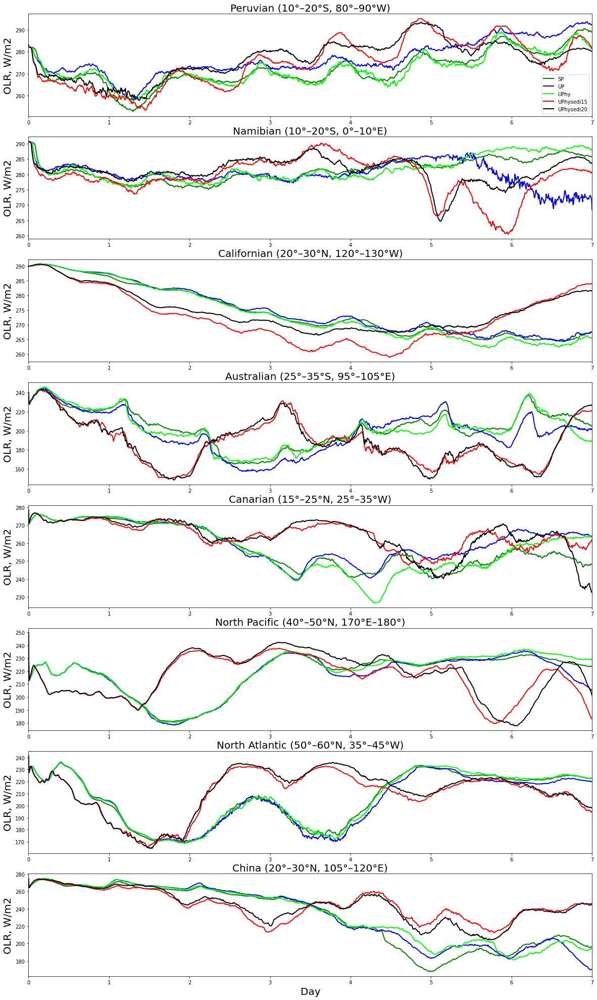

In [309]:
fig, (ax1,ax2,ax3,ax4,ax5,ax6,ax7,ax8) = plt.subplots(nrows=8, ncols=1, figsize=(20, 35))
# --------------------
OLR_SP = np.zeros([1009])
OLR_UP = np.zeros([1009])
OLR_UPhy = np.zeros([1009])
OLR_UPhysedi15 = np.zeros([1009])
OLR_UPhysedi20 = np.zeros([1009])

for it in range(len(LWP_SP)):
    count = 0
    for il in range(len(lon)):
        d0 = lonlat_in(lat[il], lon[il],-20,270,-10,280) # Peruvian
        if d0>0:
            OLR_SP[it]         = OLR_SP[it] + FLNT_SP[it,il]
            OLR_UP[it]         = OLR_UP[it] + FLNT_UP[it,il]
            OLR_UPhy[it]       = OLR_UPhy[it] + FLNT_UPhy[it,il]
            OLR_UPhysedi15[it] = OLR_UPhysedi15[it] + FLNT_UPhysedi15[it,il]
            OLR_UPhysedi20[it] = OLR_UPhysedi20[it] + FLNT_UPhysedi20[it,il]
            count = count + 1
    OLR_SP[it] = OLR_SP[it]/count
    OLR_UP[it] = OLR_UP[it]/count
    OLR_UPhy[it] = OLR_UPhy[it]/count
    OLR_UPhysedi15[it] = OLR_UPhysedi15[it]/count
    OLR_UPhysedi20[it] = OLR_UPhysedi20[it]/count
    
ax1.plot(time/144,OLR_SP,lw=2, color = colors[0],label = lab[0])
ax1.plot(time/144,OLR_UP,lw=2, color = colors[1],label = lab[1])
ax1.plot(time/144,OLR_UPhy,lw=2, color = colors[2],label = lab[2])
ax1.plot(time/144,OLR_UPhysedi15,lw=2, color = colors[3],label = lab[3])
ax1.plot(time/144,OLR_UPhysedi20,lw=2, color = colors[4],label = lab[4])
ax1.legend(prop ={'size': 10})
ax1.set(xlim=(0, 7))
titlestring = ("Peruvian (10°–20°S, 80°–90°W)")
tx = ax1.set_title(titlestring, fontsize=20)
#ax2.set_xlabel('Day', fontsize=20)
ax1.set_ylabel('OLR, W/m2', fontsize=20)

OLR_SP = np.zeros([1009])
OLR_UP = np.zeros([1009])
OLR_UPhy = np.zeros([1009])
OLR_UPhysedi15 = np.zeros([1009])
OLR_UPhysedi20 = np.zeros([1009])
for it in range(len(LWP_SP)):
    count = 0
    for il in range(len(lon)):
        d0 = lonlat_in(lat[il], lon[il],-20,0,-10,10) # Namibian
        if d0>0:
            OLR_SP[it]         = OLR_SP[it] + FLNT_SP[it,il]
            OLR_UP[it]         = OLR_UP[it] + FLNT_UP[it,il]
            OLR_UPhy[it]       = OLR_UPhy[it] + FLNT_UPhy[it,il]
            OLR_UPhysedi15[it] = OLR_UPhysedi15[it] + FLNT_UPhysedi15[it,il]
            OLR_UPhysedi20[it] = OLR_UPhysedi20[it] + FLNT_UPhysedi20[it,il]
            count = count + 1
    OLR_SP[it] = OLR_SP[it]/count
    OLR_UP[it] = OLR_UP[it]/count
    OLR_UPhy[it] = OLR_UPhy[it]/count
    OLR_UPhysedi15[it] = OLR_UPhysedi15[it]/count
    OLR_UPhysedi20[it] = OLR_UPhysedi20[it]/count
    
ax2.plot(time/144,OLR_SP,lw=2, color = colors[0],label = lab[0])
ax2.plot(time/144,OLR_UP,lw=2, color = colors[1],label = lab[1])
ax2.plot(time/144,OLR_UPhy,lw=2, color = colors[2],label = lab[2])
ax2.plot(time/144,OLR_UPhysedi15,lw=2, color = colors[3],label = lab[3])
ax2.plot(time/144,OLR_UPhysedi20,lw=2, color = colors[4],label = lab[4])
ax2.set(xlim=(0, 7))
titlestring = ("Namibian (10°–20°S, 0°–10°E)")
tx = ax2.set_title(titlestring, fontsize=20)
#ax2.set_xlabel('Day', fontsize=20)
ax2.set_ylabel('OLR, W/m2', fontsize=20)

OLR_SP = np.zeros([1009])
OLR_UP = np.zeros([1009])
OLR_UPhy = np.zeros([1009])
OLR_UPhysedi15 = np.zeros([1009])
OLR_UPhysedi20 = np.zeros([1009])
for it in range(len(LWP_SP)):
    count = 0
    for il in range(len(lon)):
        d0 = lonlat_in(lat[il], lon[il],20,230,30,240) # Californian
        if d0>0:
            OLR_SP[it]         = OLR_SP[it] + FLNT_SP[it,il]
            OLR_UP[it]         = OLR_UP[it] + FLNT_UP[it,il]
            OLR_UPhy[it]       = OLR_UPhy[it] + FLNT_UPhy[it,il]
            OLR_UPhysedi15[it] = OLR_UPhysedi15[it] + FLNT_UPhysedi15[it,il]
            OLR_UPhysedi20[it] = OLR_UPhysedi20[it] + FLNT_UPhysedi20[it,il]
            count = count + 1
    OLR_SP[it] = OLR_SP[it]/count
    OLR_UP[it] = OLR_UP[it]/count
    OLR_UPhy[it] = OLR_UPhy[it]/count
    OLR_UPhysedi15[it] = OLR_UPhysedi15[it]/count
    OLR_UPhysedi20[it] = OLR_UPhysedi20[it]/count
    
ax3.plot(time/144,OLR_SP,lw=2, color = colors[0],label = lab[0])
ax3.plot(time/144,OLR_UP,lw=2, color = colors[1],label = lab[1])
ax3.plot(time/144,OLR_UPhy,lw=2, color = colors[2],label = lab[2])
ax3.plot(time/144,OLR_UPhysedi15,lw=2, color = colors[3],label = lab[3])
ax3.plot(time/144,OLR_UPhysedi20,lw=2, color = colors[4],label = lab[4])
ax3.set(xlim=(0, 7))
titlestring = ("Californian (20°–30°N, 120°–130°W)")
tx = ax3.set_title(titlestring, fontsize=20)
#ax2.set_xlabel('Day', fontsize=20)
ax3.set_ylabel('OLR, W/m2', fontsize=20)

OLR_SP = np.zeros([1009])
OLR_UP = np.zeros([1009])
OLR_UPhy = np.zeros([1009])
OLR_UPhysedi15 = np.zeros([1009])
OLR_UPhysedi20 = np.zeros([1009])
for it in range(len(LWP_SP)):
    count = 0
    for il in range(len(lon)):
        d0 = lonlat_in(lat[il], lon[il],25,95,35,105) # Australian
        if d0>0:
            OLR_SP[it]         = OLR_SP[it] + FLNT_SP[it,il]
            OLR_UP[it]         = OLR_UP[it] + FLNT_UP[it,il]
            OLR_UPhy[it]       = OLR_UPhy[it] + FLNT_UPhy[it,il]
            OLR_UPhysedi15[it] = OLR_UPhysedi15[it] + FLNT_UPhysedi15[it,il]
            OLR_UPhysedi20[it] = OLR_UPhysedi20[it] + FLNT_UPhysedi20[it,il]
            count = count + 1
    OLR_SP[it] = OLR_SP[it]/count
    OLR_UP[it] = OLR_UP[it]/count
    OLR_UPhy[it] = OLR_UPhy[it]/count
    OLR_UPhysedi15[it] = OLR_UPhysedi15[it]/count
    OLR_UPhysedi20[it] = OLR_UPhysedi20[it]/count
    
ax4.plot(time/144,OLR_SP,lw=2, color = colors[0],label = lab[0])
ax4.plot(time/144,OLR_UP,lw=2, color = colors[1],label = lab[1])
ax4.plot(time/144,OLR_UPhy,lw=2, color = colors[2],label = lab[2])
ax4.plot(time/144,OLR_UPhysedi15,lw=2, color = colors[3],label = lab[3])
ax4.plot(time/144,OLR_UPhysedi20,lw=2, color = colors[4],label = lab[4])
ax4.set(xlim=(0, 7))
titlestring = ("Australian (25°–35°S, 95°–105°E)")
tx = ax4.set_title(titlestring, fontsize=20)
#ax2.set_xlabel('Day', fontsize=20)
ax4.set_ylabel('OLR, W/m2', fontsize=20)

OLR_SP = np.zeros([1009])
OLR_UP = np.zeros([1009])
OLR_UPhy = np.zeros([1009])
OLR_UPhysedi15 = np.zeros([1009])
OLR_UPhysedi20 = np.zeros([1009])
for it in range(len(LWP_SP)):
    count = 0
    for il in range(len(lon)):
        d0 = lonlat_in(lat[il], lon[il],15,325,25,335) # Canarian
        if d0>0:
            OLR_SP[it]         = OLR_SP[it] + FLNT_SP[it,il]
            OLR_UP[it]         = OLR_UP[it] + FLNT_UP[it,il]
            OLR_UPhy[it]       = OLR_UPhy[it] + FLNT_UPhy[it,il]
            OLR_UPhysedi15[it] = OLR_UPhysedi15[it] + FLNT_UPhysedi15[it,il]
            OLR_UPhysedi20[it] = OLR_UPhysedi20[it] + FLNT_UPhysedi20[it,il]
            count = count + 1
    OLR_SP[it] = OLR_SP[it]/count
    OLR_UP[it] = OLR_UP[it]/count
    OLR_UPhy[it] = OLR_UPhy[it]/count
    OLR_UPhysedi15[it] = OLR_UPhysedi15[it]/count
    OLR_UPhysedi20[it] = OLR_UPhysedi20[it]/count
    
ax5.plot(time/144,OLR_SP,lw=2, color = colors[0],label = lab[0])
ax5.plot(time/144,OLR_UP,lw=2, color = colors[1],label = lab[1])
ax5.plot(time/144,OLR_UPhy,lw=2, color = colors[2],label = lab[2])
ax5.plot(time/144,OLR_UPhysedi15,lw=2, color = colors[3],label = lab[3])
ax5.plot(time/144,OLR_UPhysedi20,lw=2, color = colors[4],label = lab[4])
ax5.set(xlim=(0, 7))
titlestring = ("Canarian (15°–25°N, 25°–35°W)")
tx = ax5.set_title(titlestring, fontsize=20)
#ax2.set_xlabel('Day', fontsize=20)
ax5.set_ylabel('OLR, W/m2', fontsize=20)

OLR_SP = np.zeros([1009])
OLR_UP = np.zeros([1009])
OLR_UPhy = np.zeros([1009])
OLR_UPhysedi15 = np.zeros([1009])
OLR_UPhysedi20 = np.zeros([1009])
for it in range(len(LWP_SP)):
    count = 0
    for il in range(len(lon)):
        d0 = lonlat_in(lat[il], lon[il],40,170,50,180) # Namibian
        if d0>0:
            OLR_SP[it]         = OLR_SP[it] + FLNT_SP[it,il]
            OLR_UP[it]         = OLR_UP[it] + FLNT_UP[it,il]
            OLR_UPhy[it]       = OLR_UPhy[it] + FLNT_UPhy[it,il]
            OLR_UPhysedi15[it] = OLR_UPhysedi15[it] + FLNT_UPhysedi15[it,il]
            OLR_UPhysedi20[it] = OLR_UPhysedi20[it] + FLNT_UPhysedi20[it,il]
            count = count + 1
    OLR_SP[it] = OLR_SP[it]/count
    OLR_UP[it] = OLR_UP[it]/count
    OLR_UPhy[it] = OLR_UPhy[it]/count
    OLR_UPhysedi15[it] = OLR_UPhysedi15[it]/count
    OLR_UPhysedi20[it] = OLR_UPhysedi20[it]/count
    
ax6.plot(time/144,OLR_SP,lw=2, color = colors[0],label = lab[0])
ax6.plot(time/144,OLR_UP,lw=2, color = colors[1],label = lab[1])
ax6.plot(time/144,OLR_UPhy,lw=2, color = colors[2],label = lab[2])
ax6.plot(time/144,OLR_UPhysedi15,lw=2, color = colors[3],label = lab[3])
ax6.plot(time/144,OLR_UPhysedi20,lw=2, color = colors[4],label = lab[4])
ax6.set(xlim=(0, 7))
titlestring = ("North Pacific (40°–50°N, 170°E–180°)")
tx = ax6.set_title(titlestring, fontsize=20)
#ax2.set_xlabel('Day', fontsize=20)
ax6.set_ylabel('OLR, W/m2', fontsize=20)

OLR_SP = np.zeros([1009])
OLR_UP = np.zeros([1009])
OLR_UPhy = np.zeros([1009])
OLR_UPhysedi15 = np.zeros([1009])
OLR_UPhysedi20 = np.zeros([1009])
for it in range(len(LWP_SP)):
    count = 0
    for il in range(len(lon)):
        d0 = lonlat_in(lat[il], lon[il],50,315,60,325) # Namibian
        if d0>0:
            OLR_SP[it]         = OLR_SP[it] + FLNT_SP[it,il]
            OLR_UP[it]         = OLR_UP[it] + FLNT_UP[it,il]
            OLR_UPhy[it]       = OLR_UPhy[it] + FLNT_UPhy[it,il]
            OLR_UPhysedi15[it] = OLR_UPhysedi15[it] + FLNT_UPhysedi15[it,il]
            OLR_UPhysedi20[it] = OLR_UPhysedi20[it] + FLNT_UPhysedi20[it,il]
            count = count + 1
    OLR_SP[it] = OLR_SP[it]/count
    OLR_UP[it] = OLR_UP[it]/count
    OLR_UPhy[it] = OLR_UPhy[it]/count
    OLR_UPhysedi15[it] = OLR_UPhysedi15[it]/count
    OLR_UPhysedi20[it] = OLR_UPhysedi20[it]/count
    
ax7.plot(time/144,OLR_SP,lw=2, color = colors[0],label = lab[0])
ax7.plot(time/144,OLR_UP,lw=2, color = colors[1],label = lab[1])
ax7.plot(time/144,OLR_UPhy,lw=2, color = colors[2],label = lab[2])
ax7.plot(time/144,OLR_UPhysedi15,lw=2, color = colors[3],label = lab[3])
ax7.plot(time/144,OLR_UPhysedi20,lw=2, color = colors[4],label = lab[4])
ax7.set(xlim=(0, 7))
titlestring = ("North Atlantic (50°–60°N, 35°–45°W)")
tx = ax7.set_title(titlestring, fontsize=20)
#ax2.set_xlabel('Day', fontsize=20)
ax7.set_ylabel('OLR, W/m2', fontsize=20)

OLR_SP = np.zeros([1009])
OLR_UP = np.zeros([1009])
OLR_UPhy = np.zeros([1009])
OLR_UPhysedi15 = np.zeros([1009])
OLR_UPhysedi20 = np.zeros([1009])

OLR_SP = np.zeros([1009])
OLR_UP = np.zeros([1009])
OLR_UPhy = np.zeros([1009])
OLR_UPhysedi15 = np.zeros([1009])
OLR_UPhysedi20 = np.zeros([1009])
for it in range(len(LWP_SP)):
    count = 0
    for il in range(len(lon)):
        d0 = lonlat_in(lat[il], lon[il],20,105,30,120) # Namibian
        if d0>0:
            OLR_SP[it]         = OLR_SP[it] + FLNT_SP[it,il]
            OLR_UP[it]         = OLR_UP[it] + FLNT_UP[it,il]
            OLR_UPhy[it]       = OLR_UPhy[it] + FLNT_UPhy[it,il]
            OLR_UPhysedi15[it] = OLR_UPhysedi15[it] + FLNT_UPhysedi15[it,il]
            OLR_UPhysedi20[it] = OLR_UPhysedi20[it] + FLNT_UPhysedi20[it,il]
            count = count + 1
    OLR_SP[it] = OLR_SP[it]/count
    OLR_UP[it] = OLR_UP[it]/count
    OLR_UPhy[it] = OLR_UPhy[it]/count
    OLR_UPhysedi15[it] = OLR_UPhysedi15[it]/count
    OLR_UPhysedi20[it] = OLR_UPhysedi20[it]/count
    
ax8.plot(time/144,OLR_SP,lw=2, color = colors[0],label = lab[0])
ax8.plot(time/144,OLR_UP,lw=2, color = colors[1],label = lab[1])
ax8.plot(time/144,OLR_UPhy,lw=2, color = colors[2],label = lab[2])
ax8.plot(time/144,OLR_UPhysedi15,lw=2, color = colors[3],label = lab[3])
ax8.plot(time/144,OLR_UPhysedi20,lw=2, color = colors[4],label = lab[4])
ax8.set(xlim=(0, 7))
titlestring = ("China (20°–30°N, 105°–120°E)")
tx = ax8.set_title(titlestring, fontsize=20)
#ax2.set_xlabel('Day', fontsize=20)
ax8.set_ylabel('OLR, W/m2', fontsize=20)
ax8.set_xlabel('Day', fontsize=20)
plt.savefig('FLNT_Klein_Hartmann_boxes.png')



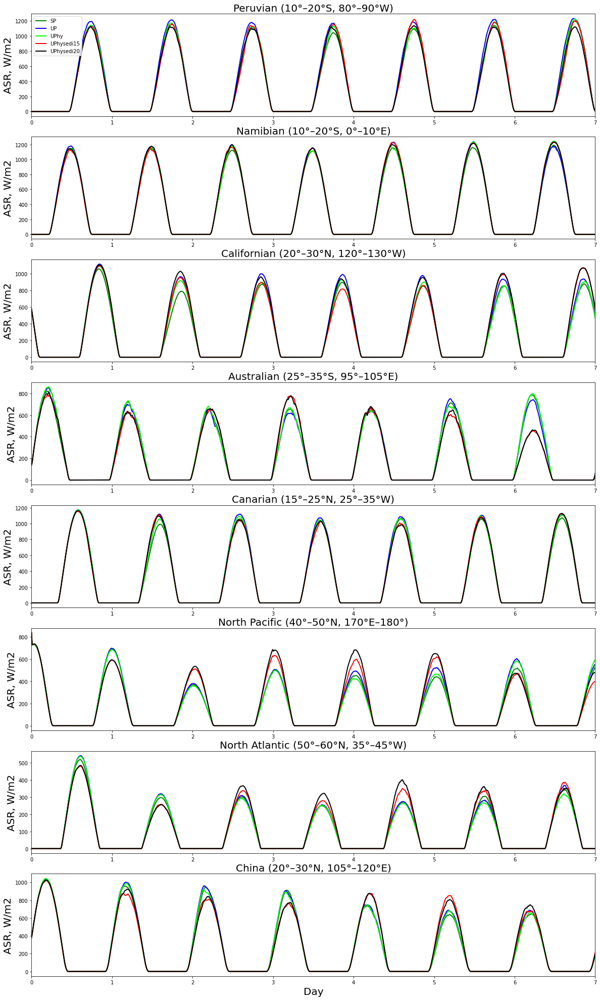

In [310]:
fig, (ax1,ax2,ax3,ax4,ax5,ax6,ax7,ax8) = plt.subplots(nrows=8, ncols=1, figsize=(20, 35))
# --------------------
ASR_SP = np.zeros([1009])
ASR_UP = np.zeros([1009])
ASR_UPhy = np.zeros([1009])
ASR_UPhysedi15 = np.zeros([1009])
ASR_UPhysedi20 = np.zeros([1009])

for it in range(len(LWP_SP)):
    count = 0
    for il in range(len(lon)):
        d0 = lonlat_in(lat[il], lon[il],-20,270,-10,280) # Peruvian
        if d0>0:
            ASR_SP[it]         = ASR_SP[it] + FSNTOA_SP[it,il]
            ASR_UP[it]         = ASR_UP[it] + FSNTOA_UP[it,il]
            ASR_UPhy[it]       = ASR_UPhy[it] + FSNTOA_UPhy[it,il]
            ASR_UPhysedi15[it] = ASR_UPhysedi15[it] + FSNTOA_UPhysedi15[it,il]
            ASR_UPhysedi20[it] = ASR_UPhysedi20[it] + FSNTOA_UPhysedi20[it,il]
            count = count + 1
    ASR_SP[it] = ASR_SP[it]/count
    ASR_UP[it] = ASR_UP[it]/count
    ASR_UPhy[it] = ASR_UPhy[it]/count
    ASR_UPhysedi15[it] = ASR_UPhysedi15[it]/count
    ASR_UPhysedi20[it] = ASR_UPhysedi20[it]/count
    
ax1.plot(time/144,ASR_SP,lw=2, color = colors[0],label = lab[0])
ax1.plot(time/144,ASR_UP,lw=2, color = colors[1],label = lab[1])
ax1.plot(time/144,ASR_UPhy,lw=2, color = colors[2],label = lab[2])
ax1.plot(time/144,ASR_UPhysedi15,lw=2, color = colors[3],label = lab[3])
ax1.plot(time/144,ASR_UPhysedi20,lw=2, color = colors[4],label = lab[4])
ax1.legend(prop ={'size': 10})
ax1.set(xlim=(0, 7))
titlestring = ("Peruvian (10°–20°S, 80°–90°W)")
tx = ax1.set_title(titlestring, fontsize=20)
#ax2.set_xlabel('Day', fontsize=20)
ax1.set_ylabel('ASR, W/m2', fontsize=20)

ASR_SP = np.zeros([1009])
ASR_UP = np.zeros([1009])
ASR_UPhy = np.zeros([1009])
ASR_UPhysedi15 = np.zeros([1009])
ASR_UPhysedi20 = np.zeros([1009])
for it in range(len(LWP_SP)):
    count = 0
    for il in range(len(lon)):
        d0 = lonlat_in(lat[il], lon[il],-20,0,-10,10) # Namibian
        if d0>0:
            ASR_SP[it]         = ASR_SP[it] + FSNTOA_SP[it,il]
            ASR_UP[it]         = ASR_UP[it] + FSNTOA_UP[it,il]
            ASR_UPhy[it]       = ASR_UPhy[it] + FSNTOA_UPhy[it,il]
            ASR_UPhysedi15[it] = ASR_UPhysedi15[it] + FSNTOA_UPhysedi15[it,il]
            ASR_UPhysedi20[it] = ASR_UPhysedi20[it] + FSNTOA_UPhysedi20[it,il]
            count = count + 1
    ASR_SP[it] = ASR_SP[it]/count
    ASR_UP[it] = ASR_UP[it]/count
    ASR_UPhy[it] = ASR_UPhy[it]/count
    ASR_UPhysedi15[it] = ASR_UPhysedi15[it]/count
    ASR_UPhysedi20[it] = ASR_UPhysedi20[it]/count
    
ax2.plot(time/144,ASR_SP,lw=2, color = colors[0],label = lab[0])
ax2.plot(time/144,ASR_UP,lw=2, color = colors[1],label = lab[1])
ax2.plot(time/144,ASR_UPhy,lw=2, color = colors[2],label = lab[2])
ax2.plot(time/144,ASR_UPhysedi15,lw=2, color = colors[3],label = lab[3])
ax2.plot(time/144,ASR_UPhysedi20,lw=2, color = colors[4],label = lab[4])
ax2.set(xlim=(0, 7))
titlestring = ("Namibian (10°–20°S, 0°–10°E)")
tx = ax2.set_title(titlestring, fontsize=20)
#ax2.set_xlabel('Day', fontsize=20)
ax2.set_ylabel('ASR, W/m2', fontsize=20)

ASR_SP = np.zeros([1009])
ASR_UP = np.zeros([1009])
ASR_UPhy = np.zeros([1009])
ASR_UPhysedi15 = np.zeros([1009])
ASR_UPhysedi20 = np.zeros([1009])
for it in range(len(LWP_SP)):
    count = 0
    for il in range(len(lon)):
        d0 = lonlat_in(lat[il], lon[il],20,230,30,240) # Californian
        if d0>0:
            ASR_SP[it]         = ASR_SP[it] + FSNTOA_SP[it,il]
            ASR_UP[it]         = ASR_UP[it] + FSNTOA_UP[it,il]
            ASR_UPhy[it]       = ASR_UPhy[it] + FSNTOA_UPhy[it,il]
            ASR_UPhysedi15[it] = ASR_UPhysedi15[it] + FSNTOA_UPhysedi15[it,il]
            ASR_UPhysedi20[it] = ASR_UPhysedi20[it] + FSNTOA_UPhysedi20[it,il]
            count = count + 1
    ASR_SP[it] = ASR_SP[it]/count
    ASR_UP[it] = ASR_UP[it]/count
    ASR_UPhy[it] = ASR_UPhy[it]/count
    ASR_UPhysedi15[it] = ASR_UPhysedi15[it]/count
    ASR_UPhysedi20[it] = ASR_UPhysedi20[it]/count
    
ax3.plot(time/144,ASR_SP,lw=2, color = colors[0],label = lab[0])
ax3.plot(time/144,ASR_UP,lw=2, color = colors[1],label = lab[1])
ax3.plot(time/144,ASR_UPhy,lw=2, color = colors[2],label = lab[2])
ax3.plot(time/144,ASR_UPhysedi15,lw=2, color = colors[3],label = lab[3])
ax3.plot(time/144,ASR_UPhysedi20,lw=2, color = colors[4],label = lab[4])
ax3.set(xlim=(0, 7))
titlestring = ("Californian (20°–30°N, 120°–130°W)")
tx = ax3.set_title(titlestring, fontsize=20)
#ax2.set_xlabel('Day', fontsize=20)
ax3.set_ylabel('ASR, W/m2', fontsize=20)

ASR_SP = np.zeros([1009])
ASR_UP = np.zeros([1009])
ASR_UPhy = np.zeros([1009])
ASR_UPhysedi15 = np.zeros([1009])
ASR_UPhysedi20 = np.zeros([1009])
for it in range(len(LWP_SP)):
    count = 0
    for il in range(len(lon)):
        d0 = lonlat_in(lat[il], lon[il],25,95,35,105) # Australian
        if d0>0:
            ASR_SP[it]         = ASR_SP[it] + FSNTOA_SP[it,il]
            ASR_UP[it]         = ASR_UP[it] + FSNTOA_UP[it,il]
            ASR_UPhy[it]       = ASR_UPhy[it] + FSNTOA_UPhy[it,il]
            ASR_UPhysedi15[it] = ASR_UPhysedi15[it] + FSNTOA_UPhysedi15[it,il]
            ASR_UPhysedi20[it] = ASR_UPhysedi20[it] + FSNTOA_UPhysedi20[it,il]
            count = count + 1
    ASR_SP[it] = ASR_SP[it]/count
    ASR_UP[it] = ASR_UP[it]/count
    ASR_UPhy[it] = ASR_UPhy[it]/count
    ASR_UPhysedi15[it] = ASR_UPhysedi15[it]/count
    ASR_UPhysedi20[it] = ASR_UPhysedi20[it]/count
    
ax4.plot(time/144,ASR_SP,lw=2, color = colors[0],label = lab[0])
ax4.plot(time/144,ASR_UP,lw=2, color = colors[1],label = lab[1])
ax4.plot(time/144,ASR_UPhy,lw=2, color = colors[2],label = lab[2])
ax4.plot(time/144,ASR_UPhysedi15,lw=2, color = colors[3],label = lab[3])
ax4.plot(time/144,ASR_UPhysedi20,lw=2, color = colors[4],label = lab[4])
ax4.set(xlim=(0, 7))
titlestring = ("Australian (25°–35°S, 95°–105°E)")
tx = ax4.set_title(titlestring, fontsize=20)
#ax2.set_xlabel('Day', fontsize=20)
ax4.set_ylabel('ASR, W/m2', fontsize=20)

ASR_SP = np.zeros([1009])
ASR_UP = np.zeros([1009])
ASR_UPhy = np.zeros([1009])
ASR_UPhysedi15 = np.zeros([1009])
ASR_UPhysedi20 = np.zeros([1009])
for it in range(len(LWP_SP)):
    count = 0
    for il in range(len(lon)):
        d0 = lonlat_in(lat[il], lon[il],15,325,25,335) # Canarian
        if d0>0:
            ASR_SP[it]         = ASR_SP[it] + FSNTOA_SP[it,il]
            ASR_UP[it]         = ASR_UP[it] + FSNTOA_UP[it,il]
            ASR_UPhy[it]       = ASR_UPhy[it] + FSNTOA_UPhy[it,il]
            ASR_UPhysedi15[it] = ASR_UPhysedi15[it] + FSNTOA_UPhysedi15[it,il]
            ASR_UPhysedi20[it] = ASR_UPhysedi20[it] + FSNTOA_UPhysedi20[it,il]
            count = count + 1
    ASR_SP[it] = ASR_SP[it]/count
    ASR_UP[it] = ASR_UP[it]/count
    ASR_UPhy[it] = ASR_UPhy[it]/count
    ASR_UPhysedi15[it] = ASR_UPhysedi15[it]/count
    ASR_UPhysedi20[it] = ASR_UPhysedi20[it]/count
    
ax5.plot(time/144,ASR_SP,lw=2, color = colors[0],label = lab[0])
ax5.plot(time/144,ASR_UP,lw=2, color = colors[1],label = lab[1])
ax5.plot(time/144,ASR_UPhy,lw=2, color = colors[2],label = lab[2])
ax5.plot(time/144,ASR_UPhysedi15,lw=2, color = colors[3],label = lab[3])
ax5.plot(time/144,ASR_UPhysedi20,lw=2, color = colors[4],label = lab[4])
ax5.set(xlim=(0, 7))
titlestring = ("Canarian (15°–25°N, 25°–35°W)")
tx = ax5.set_title(titlestring, fontsize=20)
#ax2.set_xlabel('Day', fontsize=20)
ax5.set_ylabel('ASR, W/m2', fontsize=20)

ASR_SP = np.zeros([1009])
ASR_UP = np.zeros([1009])
ASR_UPhy = np.zeros([1009])
ASR_UPhysedi15 = np.zeros([1009])
ASR_UPhysedi20 = np.zeros([1009])
for it in range(len(LWP_SP)):
    count = 0
    for il in range(len(lon)):
        d0 = lonlat_in(lat[il], lon[il],40,170,50,180) # Namibian
        if d0>0:
            ASR_SP[it]         = ASR_SP[it] + FSNTOA_SP[it,il]
            ASR_UP[it]         = ASR_UP[it] + FSNTOA_UP[it,il]
            ASR_UPhy[it]       = ASR_UPhy[it] + FSNTOA_UPhy[it,il]
            ASR_UPhysedi15[it] = ASR_UPhysedi15[it] + FSNTOA_UPhysedi15[it,il]
            ASR_UPhysedi20[it] = ASR_UPhysedi20[it] + FSNTOA_UPhysedi20[it,il]
            count = count + 1
    ASR_SP[it] = ASR_SP[it]/count
    ASR_UP[it] = ASR_UP[it]/count
    ASR_UPhy[it] = ASR_UPhy[it]/count
    ASR_UPhysedi15[it] = ASR_UPhysedi15[it]/count
    ASR_UPhysedi20[it] = ASR_UPhysedi20[it]/count
    
ax6.plot(time/144,ASR_SP,lw=2, color = colors[0],label = lab[0])
ax6.plot(time/144,ASR_UP,lw=2, color = colors[1],label = lab[1])
ax6.plot(time/144,ASR_UPhy,lw=2, color = colors[2],label = lab[2])
ax6.plot(time/144,ASR_UPhysedi15,lw=2, color = colors[3],label = lab[3])
ax6.plot(time/144,ASR_UPhysedi20,lw=2, color = colors[4],label = lab[4])
ax6.set(xlim=(0, 7))
titlestring = ("North Pacific (40°–50°N, 170°E–180°)")
tx = ax6.set_title(titlestring, fontsize=20)
#ax2.set_xlabel('Day', fontsize=20)
ax6.set_ylabel('ASR, W/m2', fontsize=20)

ASR_SP = np.zeros([1009])
ASR_UP = np.zeros([1009])
ASR_UPhy = np.zeros([1009])
ASR_UPhysedi15 = np.zeros([1009])
ASR_UPhysedi20 = np.zeros([1009])
for it in range(len(LWP_SP)):
    count = 0
    for il in range(len(lon)):
        d0 = lonlat_in(lat[il], lon[il],50,315,60,325) # Namibian
        if d0>0:
            ASR_SP[it]         = ASR_SP[it] + FSNTOA_SP[it,il]
            ASR_UP[it]         = ASR_UP[it] + FSNTOA_UP[it,il]
            ASR_UPhy[it]       = ASR_UPhy[it] + FSNTOA_UPhy[it,il]
            ASR_UPhysedi15[it] = ASR_UPhysedi15[it] + FSNTOA_UPhysedi15[it,il]
            ASR_UPhysedi20[it] = ASR_UPhysedi20[it] + FSNTOA_UPhysedi20[it,il]
            count = count + 1
    ASR_SP[it] = ASR_SP[it]/count
    ASR_UP[it] = ASR_UP[it]/count
    ASR_UPhy[it] = ASR_UPhy[it]/count
    ASR_UPhysedi15[it] = ASR_UPhysedi15[it]/count
    ASR_UPhysedi20[it] = ASR_UPhysedi20[it]/count
    
ax7.plot(time/144,ASR_SP,lw=2, color = colors[0],label = lab[0])
ax7.plot(time/144,ASR_UP,lw=2, color = colors[1],label = lab[1])
ax7.plot(time/144,ASR_UPhy,lw=2, color = colors[2],label = lab[2])
ax7.plot(time/144,ASR_UPhysedi15,lw=2, color = colors[3],label = lab[3])
ax7.plot(time/144,ASR_UPhysedi20,lw=2, color = colors[4],label = lab[4])
ax7.set(xlim=(0, 7))
titlestring = ("North Atlantic (50°–60°N, 35°–45°W)")
tx = ax7.set_title(titlestring, fontsize=20)
#ax2.set_xlabel('Day', fontsize=20)
ax7.set_ylabel('ASR, W/m2', fontsize=20)

ASR_SP = np.zeros([1009])
ASR_UP = np.zeros([1009])
ASR_UPhy = np.zeros([1009])
ASR_UPhysedi15 = np.zeros([1009])
ASR_UPhysedi20 = np.zeros([1009])
for it in range(len(LWP_SP)):
    count = 0
    for il in range(len(lon)):
        d0 = lonlat_in(lat[il], lon[il],20,105,30,120) # Namibian
        if d0>0:
            ASR_SP[it]         = ASR_SP[it] + FSNTOA_SP[it,il]
            ASR_UP[it]         = ASR_UP[it] + FSNTOA_UP[it,il]
            ASR_UPhy[it]       = ASR_UPhy[it] + FSNTOA_UPhy[it,il]
            ASR_UPhysedi15[it] = ASR_UPhysedi15[it] + FSNTOA_UPhysedi15[it,il]
            ASR_UPhysedi20[it] = ASR_UPhysedi20[it] + FSNTOA_UPhysedi20[it,il]
            count = count + 1
    ASR_SP[it] = ASR_SP[it]/count
    ASR_UP[it] = ASR_UP[it]/count
    ASR_UPhy[it] = ASR_UPhy[it]/count
    ASR_UPhysedi15[it] = ASR_UPhysedi15[it]/count
    ASR_UPhysedi20[it] = ASR_UPhysedi20[it]/count
    
ax8.plot(time/144,ASR_SP,lw=2, color = colors[0],label = lab[0])
ax8.plot(time/144,ASR_UP,lw=2, color = colors[1],label = lab[1])
ax8.plot(time/144,ASR_UPhy,lw=2, color = colors[2],label = lab[2])
ax8.plot(time/144,ASR_UPhysedi15,lw=2, color = colors[3],label = lab[3])
ax8.plot(time/144,ASR_UPhysedi20,lw=2, color = colors[4],label = lab[4])
ax8.set(xlim=(0, 7))
titlestring = ("China (20°–30°N, 105°–120°E)")
tx = ax8.set_title(titlestring, fontsize=20)
#ax2.set_xlabel('Day', fontsize=20)
ax8.set_ylabel('ASR, W/m2', fontsize=20)
ax8.set_xlabel('Day', fontsize=20)
plt.savefig('FSNTOA_Klein_Hartmann_boxes.png')


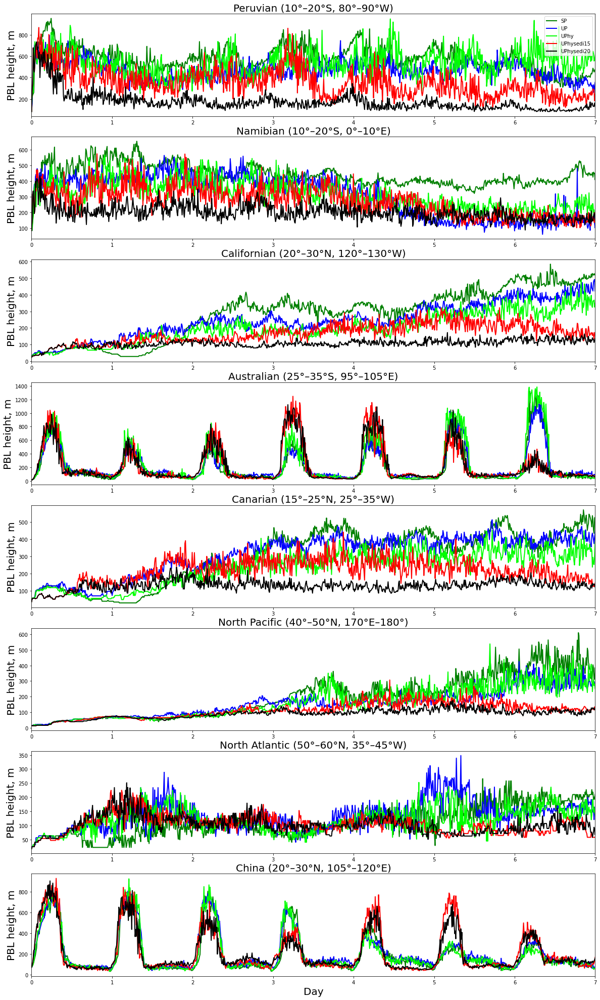

In [312]:
fig, (ax1,ax2,ax3,ax4,ax5,ax6,ax7,ax8) = plt.subplots(nrows=8, ncols=1, figsize=(20, 35))
# --------------------
PH_SP = np.zeros([1009])
PH_UP = np.zeros([1009])
PH_UPhy = np.zeros([1009])
PH_UPhysedi15 = np.zeros([1009])
PH_UPhysedi20 = np.zeros([1009])

for it in range(len(LWP_SP)):
    count = 0
    for il in range(len(lon)):
        d0 = lonlat_in(lat[il], lon[il],-20,270,-10,280) # Peruvian
        if d0>0:
            PH_SP[it]         = PH_SP[it] + PBLH_SP[it,il]
            PH_UP[it]         = PH_UP[it] + PBLH_UP[it,il]
            PH_UPhy[it]       = PH_UPhy[it] + PBLH_UPhy[it,il]
            PH_UPhysedi15[it] = PH_UPhysedi15[it] + PBLH_UPhysedi15[it,il]
            PH_UPhysedi20[it] = PH_UPhysedi20[it] + PBLH_UPhysedi20[it,il]
            count = count + 1
    PH_SP[it] = PH_SP[it]/count
    PH_UP[it] = PH_UP[it]/count
    PH_UPhy[it] = PH_UPhy[it]/count
    PH_UPhysedi15[it] = PH_UPhysedi15[it]/count
    PH_UPhysedi20[it] = PH_UPhysedi20[it]/count
    
ax1.plot(time/144,PH_SP,lw=2, color = colors[0],label = lab[0])
ax1.plot(time/144,PH_UP,lw=2, color = colors[1],label = lab[1])
ax1.plot(time/144,PH_UPhy,lw=2, color = colors[2],label = lab[2])
ax1.plot(time/144,PH_UPhysedi15,lw=2, color = colors[3],label = lab[3])
ax1.plot(time/144,PH_UPhysedi20,lw=2, color = colors[4],label = lab[4])
ax1.legend(prop ={'size': 10})
ax1.set(xlim=(0, 7))
titlestring = ("Peruvian (10°–20°S, 80°–90°W)")
tx = ax1.set_title(titlestring, fontsize=20)
#ax2.set_xlabel('Day', fontsize=20)
ax1.set_ylabel('PBL height, m', fontsize=20)

PH_SP = np.zeros([1009])
PH_UP = np.zeros([1009])
PH_UPhy = np.zeros([1009])
PH_UPhysedi15 = np.zeros([1009])
PH_UPhysedi20 = np.zeros([1009])
for it in range(len(LWP_SP)):
    count = 0
    for il in range(len(lon)):
        d0 = lonlat_in(lat[il], lon[il],-20,0,-10,10) # Namibian
        if d0>0:
            PH_SP[it]         = PH_SP[it] + PBLH_SP[it,il]
            PH_UP[it]         = PH_UP[it] + PBLH_UP[it,il]
            PH_UPhy[it]       = PH_UPhy[it] + PBLH_UPhy[it,il]
            PH_UPhysedi15[it] = PH_UPhysedi15[it] + PBLH_UPhysedi15[it,il]
            PH_UPhysedi20[it] = PH_UPhysedi20[it] + PBLH_UPhysedi20[it,il]
            count = count + 1
    PH_SP[it] = PH_SP[it]/count
    PH_UP[it] = PH_UP[it]/count
    PH_UPhy[it] = PH_UPhy[it]/count
    PH_UPhysedi15[it] = PH_UPhysedi15[it]/count
    PH_UPhysedi20[it] = PH_UPhysedi20[it]/count
    
ax2.plot(time/144,PH_SP,lw=2, color = colors[0],label = lab[0])
ax2.plot(time/144,PH_UP,lw=2, color = colors[1],label = lab[1])
ax2.plot(time/144,PH_UPhy,lw=2, color = colors[2],label = lab[2])
ax2.plot(time/144,PH_UPhysedi15,lw=2, color = colors[3],label = lab[3])
ax2.plot(time/144,PH_UPhysedi20,lw=2, color = colors[4],label = lab[4])
ax2.set(xlim=(0, 7))
titlestring = ("Namibian (10°–20°S, 0°–10°E)")
tx = ax2.set_title(titlestring, fontsize=20)
#ax2.set_xlabel('Day', fontsize=20)
ax2.set_ylabel('PBL height, m', fontsize=20)

PH_SP = np.zeros([1009])
PH_UP = np.zeros([1009])
PH_UPhy = np.zeros([1009])
PH_UPhysedi15 = np.zeros([1009])
PH_UPhysedi20 = np.zeros([1009])
for it in range(len(LWP_SP)):
    count = 0
    for il in range(len(lon)):
        d0 = lonlat_in(lat[il], lon[il],20,230,30,240) # Californian
        if d0>0:
            PH_SP[it]         = PH_SP[it] + PBLH_SP[it,il]
            PH_UP[it]         = PH_UP[it] + PBLH_UP[it,il]
            PH_UPhy[it]       = PH_UPhy[it] + PBLH_UPhy[it,il]
            PH_UPhysedi15[it] = PH_UPhysedi15[it] + PBLH_UPhysedi15[it,il]
            PH_UPhysedi20[it] = PH_UPhysedi20[it] + PBLH_UPhysedi20[it,il]
            count = count + 1
    PH_SP[it] = PH_SP[it]/count
    PH_UP[it] = PH_UP[it]/count
    PH_UPhy[it] = PH_UPhy[it]/count
    PH_UPhysedi15[it] = PH_UPhysedi15[it]/count
    PH_UPhysedi20[it] = PH_UPhysedi20[it]/count
    
ax3.plot(time/144,PH_SP,lw=2, color = colors[0],label = lab[0])
ax3.plot(time/144,PH_UP,lw=2, color = colors[1],label = lab[1])
ax3.plot(time/144,PH_UPhy,lw=2, color = colors[2],label = lab[2])
ax3.plot(time/144,PH_UPhysedi15,lw=2, color = colors[3],label = lab[3])
ax3.plot(time/144,PH_UPhysedi20,lw=2, color = colors[4],label = lab[4])
ax3.set(xlim=(0, 7))
titlestring = ("Californian (20°–30°N, 120°–130°W)")
tx = ax3.set_title(titlestring, fontsize=20)
#ax2.set_xlabel('Day', fontsize=20)
ax3.set_ylabel('PBL height, m', fontsize=20)

PH_SP = np.zeros([1009])
PH_UP = np.zeros([1009])
PH_UPhy = np.zeros([1009])
PH_UPhysedi15 = np.zeros([1009])
PH_UPhysedi20 = np.zeros([1009])
for it in range(len(LWP_SP)):
    count = 0
    for il in range(len(lon)):
        d0 = lonlat_in(lat[il], lon[il],25,95,35,105) # Australian
        if d0>0:
            PH_SP[it]         = PH_SP[it] + PBLH_SP[it,il]
            PH_UP[it]         = PH_UP[it] + PBLH_UP[it,il]
            PH_UPhy[it]       = PH_UPhy[it] + PBLH_UPhy[it,il]
            PH_UPhysedi15[it] = PH_UPhysedi15[it] + PBLH_UPhysedi15[it,il]
            PH_UPhysedi20[it] = PH_UPhysedi20[it] + PBLH_UPhysedi20[it,il]
            count = count + 1
    PH_SP[it] = PH_SP[it]/count
    PH_UP[it] = PH_UP[it]/count
    PH_UPhy[it] = PH_UPhy[it]/count
    PH_UPhysedi15[it] = PH_UPhysedi15[it]/count
    PH_UPhysedi20[it] = PH_UPhysedi20[it]/count
    
ax4.plot(time/144,PH_SP,lw=2, color = colors[0],label = lab[0])
ax4.plot(time/144,PH_UP,lw=2, color = colors[1],label = lab[1])
ax4.plot(time/144,PH_UPhy,lw=2, color = colors[2],label = lab[2])
ax4.plot(time/144,PH_UPhysedi15,lw=2, color = colors[3],label = lab[3])
ax4.plot(time/144,PH_UPhysedi20,lw=2, color = colors[4],label = lab[4])
ax4.set(xlim=(0, 7))
titlestring = ("Australian (25°–35°S, 95°–105°E)")
tx = ax4.set_title(titlestring, fontsize=20)
#ax2.set_xlabel('Day', fontsize=20)
ax4.set_ylabel('PBL height, m', fontsize=20)

PH_SP = np.zeros([1009])
PH_UP = np.zeros([1009])
PH_UPhy = np.zeros([1009])
PH_UPhysedi15 = np.zeros([1009])
PH_UPhysedi20 = np.zeros([1009])
for it in range(len(LWP_SP)):
    count = 0
    for il in range(len(lon)):
        d0 = lonlat_in(lat[il], lon[il],15,325,25,335) # Canarian
        if d0>0:
            PH_SP[it]         = PH_SP[it] + PBLH_SP[it,il]
            PH_UP[it]         = PH_UP[it] + PBLH_UP[it,il]
            PH_UPhy[it]       = PH_UPhy[it] + PBLH_UPhy[it,il]
            PH_UPhysedi15[it] = PH_UPhysedi15[it] + PBLH_UPhysedi15[it,il]
            PH_UPhysedi20[it] = PH_UPhysedi20[it] + PBLH_UPhysedi20[it,il]
            count = count + 1
    PH_SP[it] = PH_SP[it]/count
    PH_UP[it] = PH_UP[it]/count
    PH_UPhy[it] = PH_UPhy[it]/count
    PH_UPhysedi15[it] = PH_UPhysedi15[it]/count
    PH_UPhysedi20[it] = PH_UPhysedi20[it]/count
    
ax5.plot(time/144,PH_SP,lw=2, color = colors[0],label = lab[0])
ax5.plot(time/144,PH_UP,lw=2, color = colors[1],label = lab[1])
ax5.plot(time/144,PH_UPhy,lw=2, color = colors[2],label = lab[2])
ax5.plot(time/144,PH_UPhysedi15,lw=2, color = colors[3],label = lab[3])
ax5.plot(time/144,PH_UPhysedi20,lw=2, color = colors[4],label = lab[4])
ax5.set(xlim=(0, 7))
titlestring = ("Canarian (15°–25°N, 25°–35°W)")
tx = ax5.set_title(titlestring, fontsize=20)
#ax2.set_xlabel('Day', fontsize=20)
ax5.set_ylabel('PBL height, m', fontsize=20)

PH_SP = np.zeros([1009])
PH_UP = np.zeros([1009])
PH_UPhy = np.zeros([1009])
PH_UPhysedi15 = np.zeros([1009])
PH_UPhysedi20 = np.zeros([1009])
for it in range(len(LWP_SP)):
    count = 0
    for il in range(len(lon)):
        d0 = lonlat_in(lat[il], lon[il],40,170,50,180) # Namibian
        if d0>0:
            PH_SP[it]         = PH_SP[it] + PBLH_SP[it,il]
            PH_UP[it]         = PH_UP[it] + PBLH_UP[it,il]
            PH_UPhy[it]       = PH_UPhy[it] + PBLH_UPhy[it,il]
            PH_UPhysedi15[it] = PH_UPhysedi15[it] + PBLH_UPhysedi15[it,il]
            PH_UPhysedi20[it] = PH_UPhysedi20[it] + PBLH_UPhysedi20[it,il]
            count = count + 1
    PH_SP[it] = PH_SP[it]/count
    PH_UP[it] = PH_UP[it]/count
    PH_UPhy[it] = PH_UPhy[it]/count
    PH_UPhysedi15[it] = PH_UPhysedi15[it]/count
    PH_UPhysedi20[it] = PH_UPhysedi20[it]/count
    
ax6.plot(time/144,PH_SP,lw=2, color = colors[0],label = lab[0])
ax6.plot(time/144,PH_UP,lw=2, color = colors[1],label = lab[1])
ax6.plot(time/144,PH_UPhy,lw=2, color = colors[2],label = lab[2])
ax6.plot(time/144,PH_UPhysedi15,lw=2, color = colors[3],label = lab[3])
ax6.plot(time/144,PH_UPhysedi20,lw=2, color = colors[4],label = lab[4])
ax6.set(xlim=(0, 7))
titlestring = ("North Pacific (40°–50°N, 170°E–180°)")
tx = ax6.set_title(titlestring, fontsize=20)
#ax2.set_xlabel('Day', fontsize=20)
ax6.set_ylabel('PBL height, m', fontsize=20)

PH_SP = np.zeros([1009])
PH_UP = np.zeros([1009])
PH_UPhy = np.zeros([1009])
PH_UPhysedi15 = np.zeros([1009])
PH_UPhysedi20 = np.zeros([1009])
for it in range(len(LWP_SP)):
    count = 0
    for il in range(len(lon)):
        d0 = lonlat_in(lat[il], lon[il],50,315,60,325) # Namibian
        if d0>0:
            PH_SP[it]         = PH_SP[it] + PBLH_SP[it,il]
            PH_UP[it]         = PH_UP[it] + PBLH_UP[it,il]
            PH_UPhy[it]       = PH_UPhy[it] + PBLH_UPhy[it,il]
            PH_UPhysedi15[it] = PH_UPhysedi15[it] + PBLH_UPhysedi15[it,il]
            PH_UPhysedi20[it] = PH_UPhysedi20[it] + PBLH_UPhysedi20[it,il]
            count = count + 1
    PH_SP[it] = PH_SP[it]/count
    PH_UP[it] = PH_UP[it]/count
    PH_UPhy[it] = PH_UPhy[it]/count
    PH_UPhysedi15[it] = PH_UPhysedi15[it]/count
    PH_UPhysedi20[it] = PH_UPhysedi20[it]/count
    
ax7.plot(time/144,PH_SP,lw=2, color = colors[0],label = lab[0])
ax7.plot(time/144,PH_UP,lw=2, color = colors[1],label = lab[1])
ax7.plot(time/144,PH_UPhy,lw=2, color = colors[2],label = lab[2])
ax7.plot(time/144,PH_UPhysedi15,lw=2, color = colors[3],label = lab[3])
ax7.plot(time/144,PH_UPhysedi20,lw=2, color = colors[4],label = lab[4])
ax7.set(xlim=(0, 7))
titlestring = ("North Atlantic (50°–60°N, 35°–45°W)")
tx = ax7.set_title(titlestring, fontsize=20)
#ax2.set_xlabel('Day', fontsize=20)
ax7.set_ylabel('PBL height, m', fontsize=20)

PH_SP = np.zeros([1009])
PH_UP = np.zeros([1009])
PH_UPhy = np.zeros([1009])
PH_UPhysedi15 = np.zeros([1009])
PH_UPhysedi20 = np.zeros([1009])
for it in range(len(LWP_SP)):
    count = 0
    for il in range(len(lon)):
        d0 = lonlat_in(lat[il], lon[il],20,105,30,120) # Namibian
        if d0>0:
            PH_SP[it]         = PH_SP[it] + PBLH_SP[it,il]
            PH_UP[it]         = PH_UP[it] + PBLH_UP[it,il]
            PH_UPhy[it]       = PH_UPhy[it] + PBLH_UPhy[it,il]
            PH_UPhysedi15[it] = PH_UPhysedi15[it] + PBLH_UPhysedi15[it,il]
            PH_UPhysedi20[it] = PH_UPhysedi20[it] + PBLH_UPhysedi20[it,il]
            count = count + 1
    PH_SP[it] = PH_SP[it]/count
    PH_UP[it] = PH_UP[it]/count
    PH_UPhy[it] = PH_UPhy[it]/count
    PH_UPhysedi15[it] = PH_UPhysedi15[it]/count
    PH_UPhysedi20[it] = PH_UPhysedi20[it]/count
    
ax8.plot(time/144,PH_SP,lw=2, color = colors[0],label = lab[0])
ax8.plot(time/144,PH_UP,lw=2, color = colors[1],label = lab[1])
ax8.plot(time/144,PH_UPhy,lw=2, color = colors[2],label = lab[2])
ax8.plot(time/144,PH_UPhysedi15,lw=2, color = colors[3],label = lab[3])
ax8.plot(time/144,PH_UPhysedi20,lw=2, color = colors[4],label = lab[4])
ax8.set(xlim=(0, 7))
titlestring = ("China (20°–30°N, 105°–120°E)")
tx = ax8.set_title(titlestring, fontsize=20)
#ax2.set_xlabel('Day', fontsize=20)
ax8.set_ylabel('PBL height, m', fontsize=20)
ax8.set_xlabel('Day', fontsize=20)
plt.savefig('PBLH_Klein_Hartmann_boxes.png')

# Peruvian (10°–20°S, 80°–90°W)

In [383]:
spww_SPPeruvian = np.zeros([1009,125])
spww_UPPeruvian = np.zeros([1009,125])
spww_UPhyPeruvian = np.zeros([1009,125])
spww_UPhysedi20Peruvian = np.zeros([1009,125])
spww_UPhysedi15Peruvian = np.zeros([1009,125])
pttend_SPPeruvian = np.zeros([1009,125])
pttend_UPPeruvian = np.zeros([1009,125])
pttend_UPhyPeruvian = np.zeros([1009,125])
pttend_UPhysedi20Peruvian = np.zeros([1009,125])
pttend_UPhysedi15Peruvian = np.zeros([1009,125])
cld_SPPeruvian = np.zeros([1009,125])
cld_UPPeruvian = np.zeros([1009,125])
cld_UPhyPeruvian = np.zeros([1009,125])
cld_UPhysedi20Peruvian = np.zeros([1009,125])
cld_UPhysedi15Peruvian = np.zeros([1009,125])
T_SPPeruvian = np.zeros([1009,125])
T_UPPeruvian = np.zeros([1009,125])
T_UPhyPeruvian = np.zeros([1009,125])
T_UPhysedi20Peruvian = np.zeros([1009,125])
T_UPhysedi15Peruvian = np.zeros([1009,125])
Q_SPPeruvian = np.zeros([1009,125])
Q_UPPeruvian = np.zeros([1009,125])
Q_UPhyPeruvian = np.zeros([1009,125])
Q_UPhysedi20Peruvian = np.zeros([1009,125])
Q_UPhysedi15Peruvian = np.zeros([1009,125])
for it in range(len(LWP_SP)):
    count = 0
    for il in range(len(lon)):
        d0 = lonlat_in(lat[il], lon[il],-20,270,-10,280) # Peruvian
        if d0>0:
            PH_SP[it]         = PH_SP[it] + PBLH_SP[it,il]
            PH_UP[it]         = PH_UP[it] + PBLH_UP[it,il]
            PH_UPhy[it]       = PH_UPhy[it] + PBLH_UPhy[it,il]
            PH_UPhysedi15[it] = PH_UPhysedi15[it] + PBLH_UPhysedi15[it,il]
            PH_UPhysedi20[it] = PH_UPhysedi20[it] + PBLH_UPhysedi20[it,il]
            spww_SPPeruvian[it,:] = spww_SPPeruvian[it,:] + SPWWSP[it,:,il]
            spww_UPPeruvian[it,:] = spww_UPPeruvian[it,:] + SPWWUP[it,:,il]
            spww_UPhyPeruvian[it,:] = spww_UPhyPeruvian[it,:] + SPWWUPhy[it,:,il]
            spww_UPhysedi15Peruvian[it,:] = spww_UPhysedi15Peruvian[it,:] + SPWWUPhysedi15[it,:,il]
            spww_UPhysedi20Peruvian[it,:] = spww_UPhysedi20Peruvian[it,:] + SPWWUPhysedi20[it,:,il]
            T_SPPeruvian[it,:] = T_SPPeruvian[it,:] + T_SP[it,:,il]
            T_UPPeruvian[it,:] = T_UPPeruvian[it,:] + T_UP[it,:,il]
            T_UPhyPeruvian[it,:] = T_UPhyPeruvian[it,:] + T_UPhy[it,:,il]
            T_UPhysedi15Peruvian[it,:] = T_UPhysedi15Peruvian[it,:] + T_UPhysedi15[it,:,il]
            T_UPhysedi20Peruvian[it,:] = T_UPhysedi20Peruvian[it,:] + T_UPhysedi20[it,:,il]
            Q_SPPeruvian[it,:] = Q_SPPeruvian[it,:] + Q_SP[it,:,il]
            Q_UPPeruvian[it,:] = Q_UPPeruvian[it,:] + Q_UP[it,:,il]
            Q_UPhyPeruvian[it,:] = Q_UPhyPeruvian[it,:] + Q_UPhy[it,:,il]
            Q_UPhysedi15Peruvian[it,:] = Q_UPhysedi15Peruvian[it,:] + Q_UPhysedi15[it,:,il]
            Q_UPhysedi20Peruvian[it,:] = Q_UPhysedi20Peruvian[it,:] + Q_UPhysedi20[it,:,il]
            pttend_SPPeruvian[it,:] = pttend_SPPeruvian[it,:] + PTTEND_SP[it,:,il]
            pttend_UPPeruvian[it,:] = pttend_UPPeruvian[it,:] + PTTEND_UP[it,:,il]
            pttend_UPhyPeruvian[it,:] = pttend_UPhyPeruvian[it,:] + PTTEND_UPhy[it,:,il]
            pttend_UPhysedi15Peruvian[it,:] = pttend_UPhysedi15Peruvian[it,:] + PTTEND_UPhysedi15[it,:,il]
            pttend_UPhysedi20Peruvian[it,:] = pttend_UPhysedi20Peruvian[it,:] + PTTEND_UPhysedi20[it,:,il]
            cld_SPPeruvian[it,:] = cld_SPPeruvian[it,:] + CLOUD_SP[it,:,il]
            cld_UPPeruvian[it,:] = cld_UPPeruvian[it,:] + CLOUD_UP[it,:,il]
            cld_UPhyPeruvian[it,:] = cld_UPhyPeruvian[it,:] + CLOUD_UPhy[it,:,il]
            cld_UPhysedi15Peruvian[it,:] = cld_UPhysedi15Peruvian[it,:] + CLOUD_UPhysedi15[it,:,il]
            cld_UPhysedi20Peruvian[it,:] = cld_UPhysedi20Peruvian[it,:] + CLOUD_UPhysedi20[it,:,il]
            count = count + 1
            
    PH_SP[it] = PH_SP[it]/count
    PH_UP[it] = PH_UP[it]/count
    PH_UPhy[it] = PH_UPhy[it]/count
    PH_UPhysedi15[it] = PH_UPhysedi15[it]/count
    PH_UPhysedi20[it] = PH_UPhysedi20[it]/count
    spww_SPPeruvian[it,:] = spww_SPPeruvian[it,:] /count
    spww_UPPeruvian[it,:] = spww_UPPeruvian[it,:]  /count
    spww_UPhyPeruvian[it,:] = spww_UPhyPeruvian[it,:] /count
    spww_UPhysedi15Peruvian[it,:] = spww_UPhysedi15Peruvian[it,:] /count
    spww_UPhysedi20Peruvian[it,:] = spww_UPhysedi20Peruvian[it,:] /count
    T_SPPeruvian[it,:] = T_SPPeruvian[it,:] /count
    T_UPPeruvian[it,:] = T_UPPeruvian[it,:]  /count
    T_UPhyPeruvian[it,:] = T_UPhyPeruvian[it,:] /count
    T_UPhysedi15Peruvian[it,:] = T_UPhysedi15Peruvian[it,:] /count
    T_UPhysedi20Peruvian[it,:] = T_UPhysedi20Peruvian[it,:] /count
    Q_SPPeruvian[it,:] = Q_SPPeruvian[it,:] /count
    Q_UPPeruvian[it,:] = Q_UPPeruvian[it,:]  /count
    Q_UPhyPeruvian[it,:] = Q_UPhyPeruvian[it,:] /count
    Q_UPhysedi15Peruvian[it,:] = Q_UPhysedi15Peruvian[it,:] /count
    Q_UPhysedi20Peruvian[it,:] = Q_UPhysedi20Peruvian[it,:] /count
    pttend_SPPeruvian[it,:] = pttend_SPPeruvian[it,:] /count
    pttend_UPPeruvian[it,:] = pttend_UPPeruvian[it,:]  /count
    pttend_UPhyPeruvian[it,:] = pttend_UPhyPeruvian[it,:] /count
    pttend_UPhysedi15Peruvian[it,:] = pttend_UPhysedi15Peruvian[it,:] /count
    pttend_UPhysedi20Peruvian[it,:] = pttend_UPhysedi20Peruvian[it,:] /count
    cld_SPPeruvian[it,:] = cld_SPPeruvian[it,:] /count
    cld_UPPeruvian[it,:] = cld_UPPeruvian[it,:]  /count
    cld_UPhyPeruvian[it,:] = cld_UPhyPeruvian[it,:] /count
    cld_UPhysedi15Peruvian[it,:] = cld_UPhysedi15Peruvian[it,:] /count
    cld_UPhysedi20Peruvian[it,:] = cld_UPhysedi20Peruvian[it,:] /count
    
spww_crossSPPeruvian = np.transpose(spww_SPPeruvian)
spww_crossUPPeruvian = np.transpose(spww_UPPeruvian)
spww_crossUPhyPeruvian = np.transpose(spww_UPhyPeruvian)
spww_crossUPhysedi15Peruvian = np.transpose(spww_UPhysedi15Peruvian)
spww_crossUPhysedi20Peruvian = np.transpose(spww_UPhysedi20Peruvian)
T_crossSPPeruvian = np.transpose(T_SPPeruvian)
T_crossUPPeruvian = np.transpose(T_UPPeruvian)
T_crossUPhyPeruvian = np.transpose(T_UPhyPeruvian)
T_crossUPhysedi15Peruvian = np.transpose(T_UPhysedi15Peruvian)
T_crossUPhysedi20Peruvian = np.transpose(T_UPhysedi20Peruvian)
Q_crossSPPeruvian = np.transpose(Q_SPPeruvian)
Q_crossUPPeruvian = np.transpose(Q_UPPeruvian)
Q_crossUPhyPeruvian = np.transpose(Q_UPhyPeruvian)
Q_crossUPhysedi15Peruvian = np.transpose(Q_UPhysedi15Peruvian)
Q_crossUPhysedi20Peruvian = np.transpose(Q_UPhysedi20Peruvian)
pttend_crossSPPeruvian = np.transpose(pttend_SPPeruvian)
pttend_crossUPPeruvian = np.transpose(pttend_UPPeruvian)
pttend_crossUPhyPeruvian = np.transpose(pttend_UPhyPeruvian)
pttend_crossUPhysedi15Peruvian = np.transpose(pttend_UPhysedi15Peruvian)
pttend_crossUPhysedi20Peruvian = np.transpose(pttend_UPhysedi20Peruvian)
cld_crossSPPeruvian = np.transpose(cld_SPPeruvian)
cld_crossUPPeruvian = np.transpose(cld_UPPeruvian)
cld_crossUPhyPeruvian = np.transpose(cld_UPhyPeruvian)
cld_crossUPhysedi15Peruvian = np.transpose(cld_UPhysedi15Peruvian)
cld_crossUPhysedi20Peruvian = np.transpose(cld_UPhysedi20Peruvian)

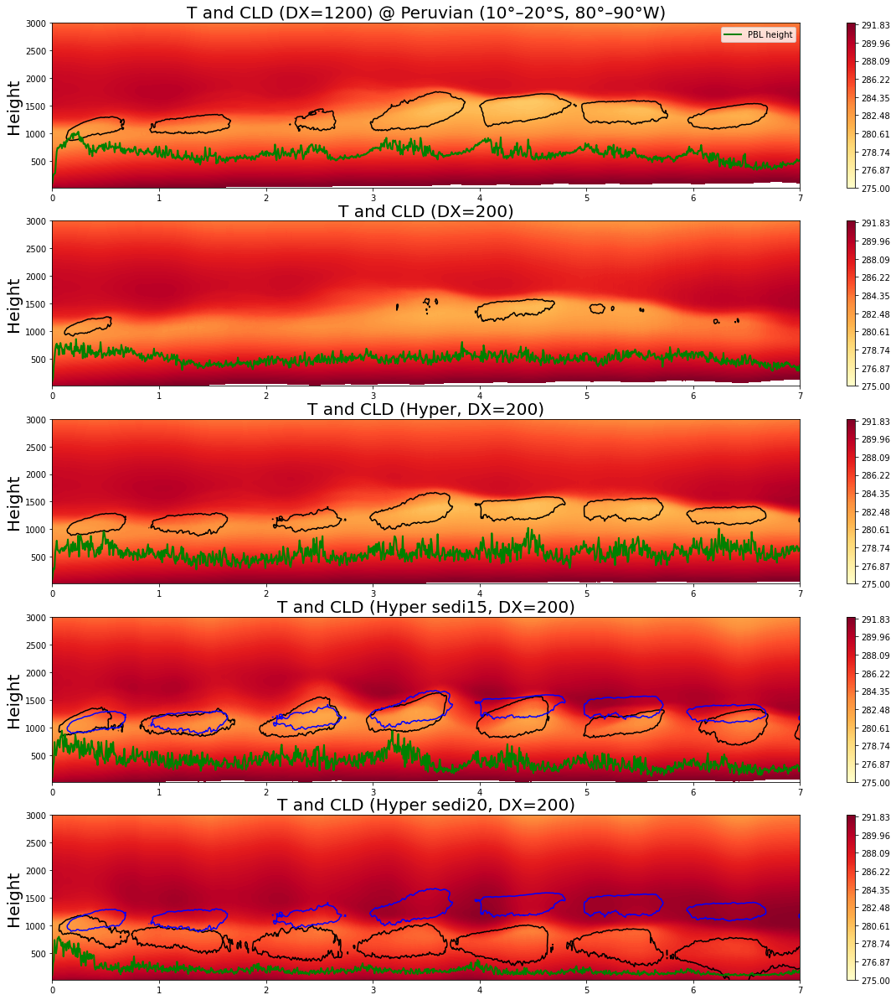

In [391]:
#  For SPCTRL and UPCTRL, both finished 5 day simulation
fig, (ax1,ax2,ax3,ax4,ax5) = plt.subplots(nrows=5, ncols=1, figsize=(20, 21))
varmin = [275]
varmax = [292]
varinter = [101]
vardmin = [-4]
vardmax = [4]
vardinter = [101]
num1 = 1009
num2 = 1009
time = np.linspace(0, num1, num1)
time2 = np.linspace(0, num2, num2)
time3 = np.linspace(0, 289, 289)
levels = np.linspace(varmin[0], varmax[0], varinter[0])
levels2 = np.linspace(vardmin[0], vardmax[0], vardinter[0])

cf = ax1.contourf(time/144,Z3SP,T_crossSPPeruvian,200, cmap="YlOrRd", levels=levels)
cf01 = ax1.contour(time/144,Z3SP,cld_crossSPPeruvian,200,colors='k', levels=[0.2], linestyles='-')
ax1.plot(time/144,PH_SP,lw=2, color = 'green',label = 'PBL height')
ax1.legend(prop ={'size': 10})
#cf0002 = ax1.contour(time/144,Z3p,cld_cross1,200, colors='k', levels=[0.8], linestyles=':')
cb = fig.colorbar(cf, ax=ax1)
ax1.set(xlim=(0, 7), ylim=(min(Z3SP), 3000))
titlestring = ("T and CLD (DX=1200) @ Peruvian (10°–20°S, 80°–90°W)")
tx = ax1.set_title(titlestring, fontsize=20)
#ax1.set_xlabel('Day', fontsize=20)
ax1.set_ylabel('Height', fontsize=20)

cf2 = ax2.contourf(time/144,Z3UP,T_crossUPPeruvian,200, cmap="YlOrRd", levels=levels)
cf02 = ax2.contour(time/144,Z3UP,cld_crossUPPeruvian,200,colors='k', levels=[0.2], linestyles='-')
ax2.plot(time/144,PH_UP,lw=2, color = 'green')
cb2 = fig.colorbar(cf2, ax=ax2)
ax2.set(xlim=(0, 7), ylim=(min(Z3UP), 3000))
titlestring = ("T and CLD (DX=200)")
tx = ax2.set_title(titlestring, fontsize=20)
#ax2.set_xlabel('Day', fontsize=20)
ax2.set_ylabel('Height', fontsize=20)

cf3 = ax3.contourf(time/144,Z3UPhy,T_crossUPhyPeruvian,200, cmap="YlOrRd", levels=levels)
cf03 = ax3.contour(time/144,Z3UPhy,cld_crossUPhyPeruvian,200,colors='k', levels=[0.2], linestyles='-')
ax3.plot(time/144,PH_UPhy,lw=2, color = 'green')
cb3 = fig.colorbar(cf3, ax=ax3)
ax3.set(xlim=(0, 7), ylim=(min(Z3UPhy), 3000))
titlestring = ("T and CLD (Hyper, DX=200)")
tx = ax3.set_title(titlestring, fontsize=20)
#ax2.set_xlabel('Day', fontsize=20)
ax3.set_ylabel('Height', fontsize=20)

cf4 = ax4.contourf(time/144,Z3UPhysedi15,T_crossUPhysedi15Peruvian,200, cmap="YlOrRd", levels=levels)
cf04 = ax4.contour(time/144,Z3UPhysedi15,cld_crossUPhysedi15Peruvian,200,colors='k', levels=[0.2], linestyles='-')
cf042 = ax4.contour(time/144,Z3UPhy,cld_crossUPhyPeruvian,200,colors='b', levels=[0.2], linestyles='-')
ax4.plot(time/144,PH_UPhysedi15,lw=2, color = 'green')
cb4 = fig.colorbar(cf4, ax=ax4)
ax4.set(xlim=(0, 7), ylim=(min(Z3UPhysedi15), 3000))
titlestring = ("T and CLD (Hyper sedi15, DX=200)")
tx = ax4.set_title(titlestring, fontsize=20)
#ax2.set_xlabel('Day', fontsize=20)
ax4.set_ylabel('Height', fontsize=20)

cf5 = ax5.contourf(time/144,Z3UPhysedi20,T_crossUPhysedi20Peruvian,200, cmap="YlOrRd", levels=levels)
cf05 = ax5.contour(time/144,Z3UPhysedi20,cld_crossUPhysedi20Peruvian,200,colors='k', levels=[0.2], linestyles='-')
cf052 = ax5.contour(time/144,Z3UPhy,cld_crossUPhyPeruvian,200,colors='b', levels=[0.2], linestyles='-')
ax5.plot(time/144,PH_UPhysedi20,lw=2, color = 'green')
cb5 = fig.colorbar(cf4, ax=ax5)
ax5.set(xlim=(0, 7), ylim=(min(Z3UPhysedi15), 3000))
titlestring = ("T and CLD (Hyper sedi20, DX=200)")
tx = ax5.set_title(titlestring, fontsize=20)
#ax2.set_xlabel('Day', fontsize=20)
ax5.set_ylabel('Height', fontsize=20)

plt.savefig('SP_UP_iniT_crosssection_Peruvian_5_m11_TCLD_Time_Height_UP.png')
#plt.savefig('SP_UP_inispww_crosssection_WAus_102_m30_TCLD_Time_Height_UP.png')
#plt.savefig('SP_UP_inispww_crosssection_WPac_272_m14_SPWWCLD_Time_Height_UP.png')

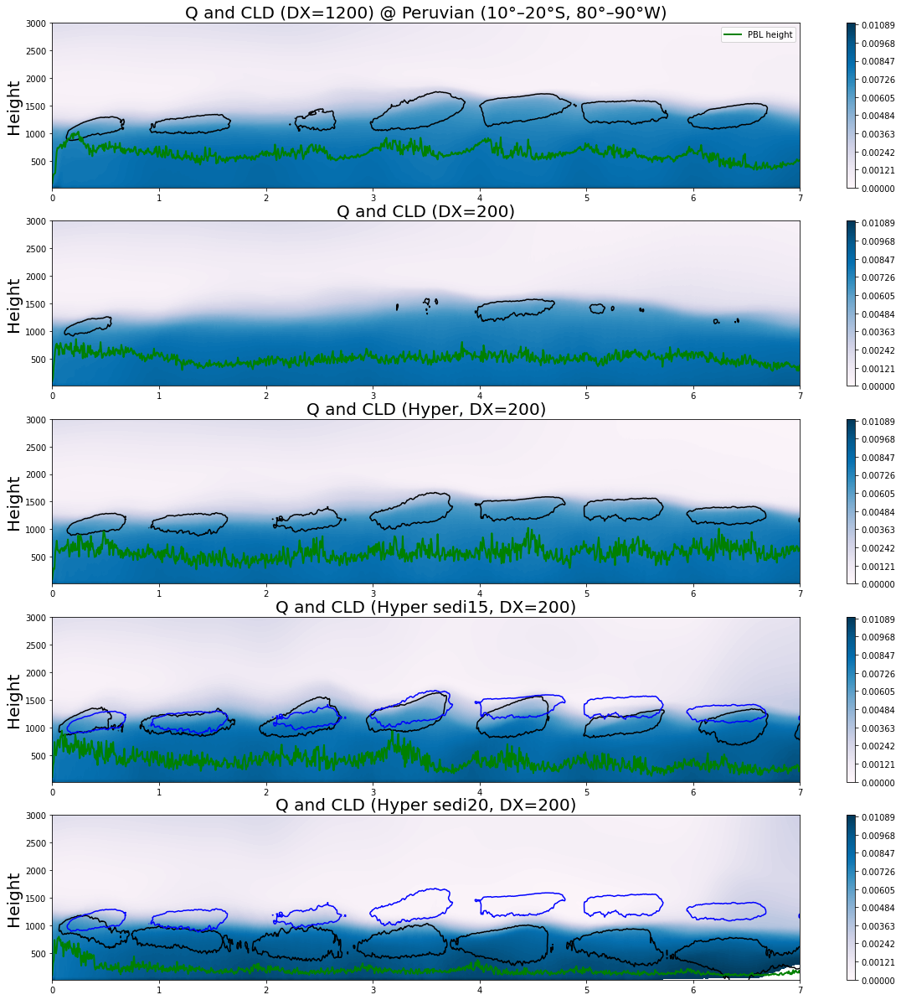

In [395]:
#  For SPCTRL and UPCTRL, both finished 5 day simulation
fig, (ax1,ax2,ax3,ax4,ax5) = plt.subplots(nrows=5, ncols=1, figsize=(20, 21))
varmin = [0]
varmax = [0.011]
varinter = [101]
vardmin = [-4]
vardmax = [4]
vardinter = [101]
num1 = 1009
num2 = 1009
time = np.linspace(0, num1, num1)
time2 = np.linspace(0, num2, num2)
time3 = np.linspace(0, 289, 289)
levels = np.linspace(varmin[0], varmax[0], varinter[0])
levels2 = np.linspace(vardmin[0], vardmax[0], vardinter[0])

cf = ax1.contourf(time/144,Z3SP,Q_crossSPPeruvian,200, cmap="PuBu", levels=levels)
cf01 = ax1.contour(time/144,Z3SP,cld_crossSPPeruvian,200,colors='k', levels=[0.2], linestyles='-')
ax1.plot(time/144,PH_SP,lw=2, color = 'green',label = 'PBL height')
ax1.legend(prop ={'size': 10})
#cf0002 = ax1.contour(time/144,Z3p,cld_cross1,200, colors='k', levels=[0.8], linestyles=':')
cb = fig.colorbar(cf, ax=ax1)
ax1.set(xlim=(0, 7), ylim=(min(Z3SP), 3000))
titlestring = ("Q and CLD (DX=1200) @ Peruvian (10°–20°S, 80°–90°W)")
tx = ax1.set_title(titlestring, fontsize=20)
#ax1.set_xlabel('Day', fontsize=20)
ax1.set_ylabel('Height', fontsize=20)

cf2 = ax2.contourf(time/144,Z3UP,Q_crossUPPeruvian,200, cmap="PuBu", levels=levels)
cf02 = ax2.contour(time/144,Z3UP,cld_crossUPPeruvian,200,colors='k', levels=[0.2], linestyles='-')
ax2.plot(time/144,PH_UP,lw=2, color = 'green')
cb2 = fig.colorbar(cf2, ax=ax2)
ax2.set(xlim=(0, 7), ylim=(min(Z3UP), 3000))
titlestring = ("Q and CLD (DX=200)")
tx = ax2.set_title(titlestring, fontsize=20)
#ax2.set_xlabel('Day', fontsize=20)
ax2.set_ylabel('Height', fontsize=20)

cf3 = ax3.contourf(time/144,Z3UPhy,Q_crossUPhyPeruvian,200, cmap="PuBu", levels=levels)
cf03 = ax3.contour(time/144,Z3UPhy,cld_crossUPhyPeruvian,200,colors='k', levels=[0.2], linestyles='-')
ax3.plot(time/144,PH_UPhy,lw=2, color = 'green')
cb3 = fig.colorbar(cf3, ax=ax3)
ax3.set(xlim=(0, 7), ylim=(min(Z3UPhy), 3000))
titlestring = ("Q and CLD (Hyper, DX=200)")
tx = ax3.set_title(titlestring, fontsize=20)
#ax2.set_xlabel('Day', fontsize=20)
ax3.set_ylabel('Height', fontsize=20)

cf4 = ax4.contourf(time/144,Z3UPhysedi15,Q_crossUPhysedi15Peruvian,200, cmap="PuBu", levels=levels)
cf04 = ax4.contour(time/144,Z3UPhysedi15,cld_crossUPhysedi15Peruvian,200,colors='k', levels=[0.2], linestyles='-')
cf042 = ax4.contour(time/144,Z3UPhy,cld_crossUPhyPeruvian,200,colors='b', levels=[0.2], linestyles='-')
ax4.plot(time/144,PH_UPhysedi15,lw=2, color = 'green')
cb4 = fig.colorbar(cf4, ax=ax4)
ax4.set(xlim=(0, 7), ylim=(min(Z3UPhysedi15), 3000))
titlestring = ("Q and CLD (Hyper sedi15, DX=200)")
tx = ax4.set_title(titlestring, fontsize=20)
#ax2.set_xlabel('Day', fontsize=20)
ax4.set_ylabel('Height', fontsize=20)

cf5 = ax5.contourf(time/144,Z3UPhysedi20,Q_crossUPhysedi20Peruvian,200, cmap="PuBu", levels=levels)
cf05 = ax5.contour(time/144,Z3UPhysedi20,cld_crossUPhysedi20Peruvian,200,colors='k', levels=[0.2], linestyles='-')
cf052 = ax5.contour(time/144,Z3UPhy,cld_crossUPhyPeruvian,200,colors='b', levels=[0.2], linestyles='-')
ax5.plot(time/144,PH_UPhysedi20,lw=2, color = 'green')
cb5 = fig.colorbar(cf4, ax=ax5)
ax5.set(xlim=(0, 7), ylim=(min(Z3UPhysedi15), 3000))
titlestring = ("Q and CLD (Hyper sedi20, DX=200)")
tx = ax5.set_title(titlestring, fontsize=20)
#ax2.set_xlabel('Day', fontsize=20)
ax5.set_ylabel('Height', fontsize=20)

plt.savefig('SP_UP_iniQ_crosssection_Peruvian_5_m11_QCLD_Time_Height_UP.png')
#plt.savefig('SP_UP_iniQ_crosssection_WAus_102_m30_TCLD_Time_Height_UP.png')
#plt.savefig('SP_UP_iniQ_crosssection_WPac_272_m14_QCLD_Time_Height_UP.png')

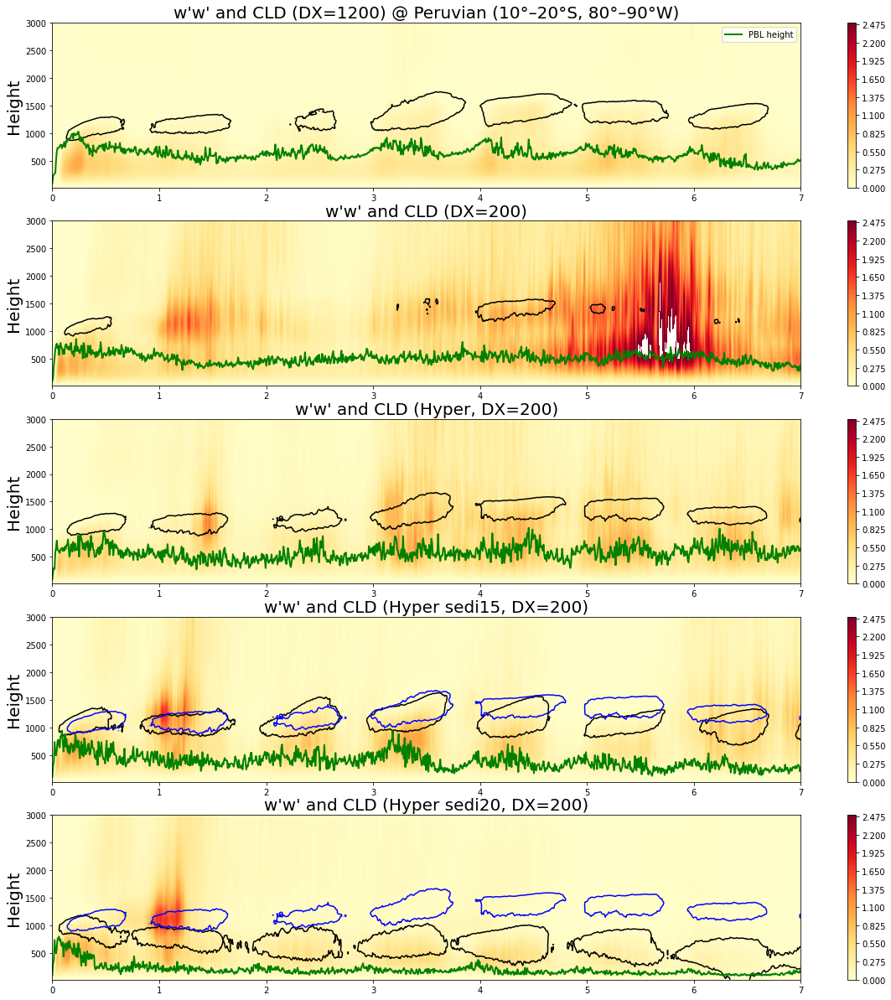

In [396]:
#  For SPCTRL and UPCTRL, both finished 5 day simulation
fig, (ax1,ax2,ax3,ax4,ax5) = plt.subplots(nrows=5, ncols=1, figsize=(20, 21))
varmin = [0]
varmax = [2.5]
varinter = [101]
vardmin = [-4]
vardmax = [4]
vardinter = [101]
num1 = 1009
num2 = 1009
time = np.linspace(0, num1, num1)
time2 = np.linspace(0, num2, num2)
time3 = np.linspace(0, 289, 289)
levels = np.linspace(varmin[0], varmax[0], varinter[0])
levels2 = np.linspace(vardmin[0], vardmax[0], vardinter[0])

cf = ax1.contourf(time/144,Z3SP,spww_crossSPPeruvian,200, cmap="YlOrRd", levels=levels)
cf01 = ax1.contour(time/144,Z3SP,cld_crossSPPeruvian,200,colors='k', levels=[0.2], linestyles='-')
ax1.plot(time/144,PH_SP,lw=2, color = 'green',label = 'PBL height')
ax1.legend(prop ={'size': 10})
#cf0002 = ax1.contour(time/144,Z3p,cld_cross1,200, colors='k', levels=[0.8], linestyles=':')
cb = fig.colorbar(cf, ax=ax1)
ax1.set(xlim=(0, 7), ylim=(min(Z3SP), 3000))
titlestring = ("w'w' and CLD (DX=1200) @ Peruvian (10°–20°S, 80°–90°W)")
tx = ax1.set_title(titlestring, fontsize=20)
#ax1.set_xlabel('Day', fontsize=20)
ax1.set_ylabel('Height', fontsize=20)

cf2 = ax2.contourf(time/144,Z3UP,spww_crossUPPeruvian,200, cmap="YlOrRd", levels=levels)
cf02 = ax2.contour(time/144,Z3UP,cld_crossUPPeruvian,200,colors='k', levels=[0.2], linestyles='-')
ax2.plot(time/144,PH_UP,lw=2, color = 'green')
cb2 = fig.colorbar(cf2, ax=ax2)
ax2.set(xlim=(0, 7), ylim=(min(Z3UP), 3000))
titlestring = ("w'w' and CLD (DX=200)")
tx = ax2.set_title(titlestring, fontsize=20)
#ax2.set_xlabel('Day', fontsize=20)
ax2.set_ylabel('Height', fontsize=20)

cf3 = ax3.contourf(time/144,Z3UPhy,spww_crossUPhyPeruvian,200, cmap="YlOrRd", levels=levels)
cf03 = ax3.contour(time/144,Z3UPhy,cld_crossUPhyPeruvian,200,colors='k', levels=[0.2], linestyles='-')
ax3.plot(time/144,PH_UPhy,lw=2, color = 'green')
cb3 = fig.colorbar(cf3, ax=ax3)
ax3.set(xlim=(0, 7), ylim=(min(Z3UPhy), 3000))
titlestring = ("w'w' and CLD (Hyper, DX=200)")
tx = ax3.set_title(titlestring, fontsize=20)
#ax2.set_xlabel('Day', fontsize=20)
ax3.set_ylabel('Height', fontsize=20)

cf4 = ax4.contourf(time/144,Z3UPhysedi15,spww_crossUPhysedi15Peruvian,200, cmap="YlOrRd", levels=levels)
cf04 = ax4.contour(time/144,Z3UPhysedi15,cld_crossUPhysedi15Peruvian,200,colors='k', levels=[0.2], linestyles='-')
cf042 = ax4.contour(time/144,Z3UPhy,cld_crossUPhyPeruvian,200,colors='b', levels=[0.2], linestyles='-')
ax4.plot(time/144,PH_UPhysedi15,lw=2, color = 'green')
cb4 = fig.colorbar(cf4, ax=ax4)
ax4.set(xlim=(0, 7), ylim=(min(Z3UPhysedi15), 3000))
titlestring = ("w'w' and CLD (Hyper sedi15, DX=200)")
tx = ax4.set_title(titlestring, fontsize=20)
#ax2.set_xlabel('Day', fontsize=20)
ax4.set_ylabel('Height', fontsize=20)

cf5 = ax5.contourf(time/144,Z3UPhysedi20,spww_crossUPhysedi20Peruvian,200, cmap="YlOrRd", levels=levels)
cf05 = ax5.contour(time/144,Z3UPhysedi20,cld_crossUPhysedi20Peruvian,200,colors='k', levels=[0.2], linestyles='-')
cf052 = ax5.contour(time/144,Z3UPhy,cld_crossUPhyPeruvian,200,colors='b', levels=[0.2], linestyles='-')
ax5.plot(time/144,PH_UPhysedi20,lw=2, color = 'green')
cb5 = fig.colorbar(cf4, ax=ax5)
ax5.set(xlim=(0, 7), ylim=(min(Z3UPhysedi15), 3000))
titlestring = ("w'w' and CLD (Hyper sedi20, DX=200)")
tx = ax5.set_title(titlestring, fontsize=20)
#ax2.set_xlabel('Day', fontsize=20)
ax5.set_ylabel('Height', fontsize=20)

plt.savefig('SP_UP_inispww_crosssection_Peruvian_5_m11_SPWWCLD_Time_Height_UP.png')
#plt.savefig('SP_UP_inispww_crosssection_WAus_102_m30_TCLD_Time_Height_UP.png')
#plt.savefig('SP_UP_inispww_crosssection_WPac_272_m14_SPWWCLD_Time_Height_UP.png')

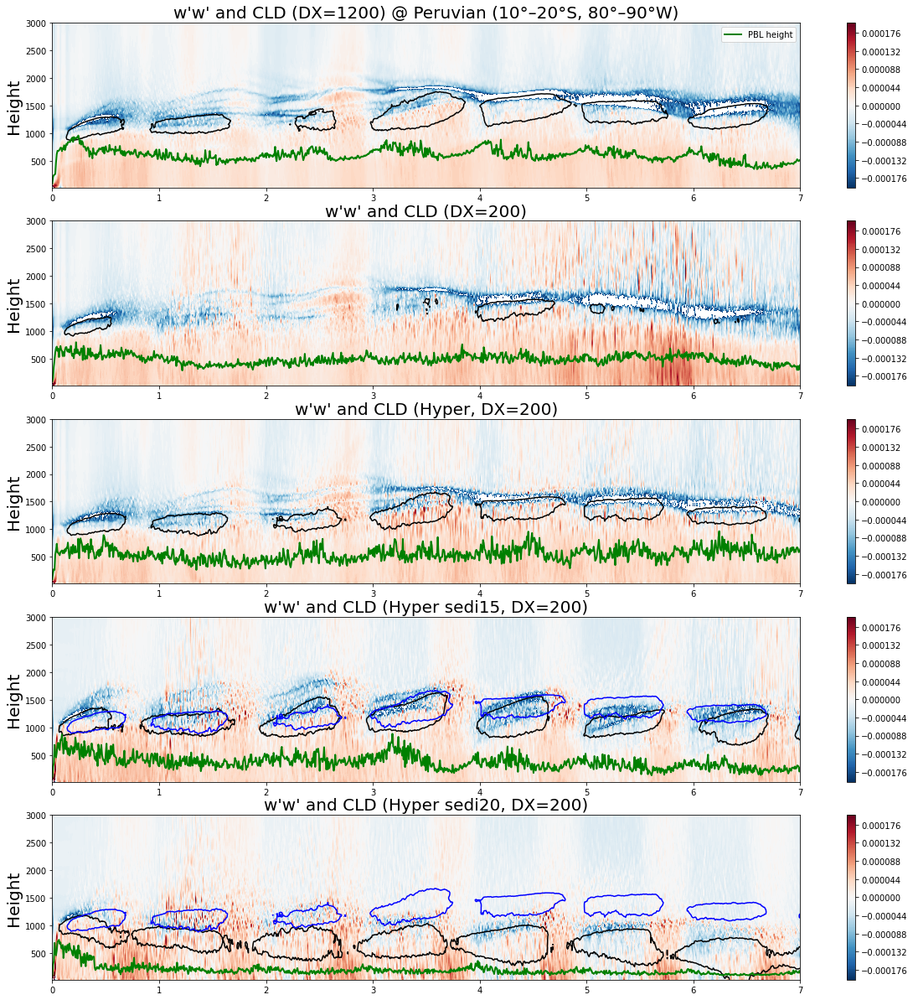

In [357]:
#  For SPCTRL and UPCTRL, both finished 5 day simulation
fig, (ax1,ax2,ax3,ax4,ax5) = plt.subplots(nrows=5, ncols=1, figsize=(20, 21))
varmin = [-2e-4]
varmax = [2e-4]
varinter = [101]
vardmin = [-4]
vardmax = [4]
vardinter = [101]
num1 = 1009
num2 = 1009
time = np.linspace(0, num1, num1)
time2 = np.linspace(0, num2, num2)
time3 = np.linspace(0, 289, 289)
levels = np.linspace(varmin[0], varmax[0], varinter[0])
levels2 = np.linspace(vardmin[0], vardmax[0], vardinter[0])

cf = ax1.contourf(time/144,Z3SP,pttend_crossSPPeruvian,200, cmap="RdBu_r", levels=levels)
cf01 = ax1.contour(time/144,Z3SP,cld_crossSPPeruvian,200,colors='k', levels=[0.2], linestyles='-')
ax1.plot(time/144,PH_SP,lw=2, color = 'green',label = 'PBL height')
ax1.legend(prop ={'size': 10})
#cf0002 = ax1.contour(time/144,Z3p,cld_cross1,200, colors='k', levels=[0.8], linestyles=':')
cb = fig.colorbar(cf, ax=ax1)
ax1.set(xlim=(0, 7), ylim=(min(Z3SP), 3000))
titlestring = ("w'w' and CLD (DX=1200) @ Peruvian (10°–20°S, 80°–90°W)")
tx = ax1.set_title(titlestring, fontsize=20)
#ax1.set_xlabel('Day', fontsize=20)
ax1.set_ylabel('Height', fontsize=20)

cf2 = ax2.contourf(time/144,Z3UP,pttend_crossUPPeruvian,200, cmap="RdBu_r", levels=levels)
cf02 = ax2.contour(time/144,Z3UP,cld_crossUPPeruvian,200,colors='k', levels=[0.2], linestyles='-')
ax2.plot(time/144,PH_UP,lw=2, color = 'green')
cb2 = fig.colorbar(cf2, ax=ax2)
ax2.set(xlim=(0, 7), ylim=(min(Z3UP), 3000))
titlestring = ("w'w' and CLD (DX=200)")
tx = ax2.set_title(titlestring, fontsize=20)
#ax2.set_xlabel('Day', fontsize=20)
ax2.set_ylabel('Height', fontsize=20)

cf3 = ax3.contourf(time/144,Z3UPhy,pttend_crossUPhyPeruvian,200, cmap="RdBu_r", levels=levels)
cf03 = ax3.contour(time/144,Z3UPhy,cld_crossUPhyPeruvian,200,colors='k', levels=[0.2], linestyles='-')
ax3.plot(time/144,PH_UPhy,lw=2, color = 'green')
cb3 = fig.colorbar(cf3, ax=ax3)
ax3.set(xlim=(0, 7), ylim=(min(Z3UPhy), 3000))
titlestring = ("w'w' and CLD (Hyper, DX=200)")
tx = ax3.set_title(titlestring, fontsize=20)
#ax2.set_xlabel('Day', fontsize=20)
ax3.set_ylabel('Height', fontsize=20)

cf4 = ax4.contourf(time/144,Z3UPhysedi15,pttend_crossUPhysedi15Peruvian,200, cmap="RdBu_r", levels=levels)
cf04 = ax4.contour(time/144,Z3UPhysedi15,cld_crossUPhysedi15Peruvian,200,colors='k', levels=[0.2], linestyles='-')
cf042 = ax4.contour(time/144,Z3UPhy,cld_crossUPhyPeruvian,200,colors='b', levels=[0.2], linestyles='-')
ax4.plot(time/144,PH_UPhysedi15,lw=2, color = 'green')
cb4 = fig.colorbar(cf4, ax=ax4)
ax4.set(xlim=(0, 7), ylim=(min(Z3UPhysedi15), 3000))
titlestring = ("w'w' and CLD (Hyper sedi15, DX=200)")
tx = ax4.set_title(titlestring, fontsize=20)
#ax2.set_xlabel('Day', fontsize=20)
ax4.set_ylabel('Height', fontsize=20)

cf5 = ax5.contourf(time/144,Z3UPhysedi20,pttend_crossUPhysedi20Peruvian,200, cmap="RdBu_r", levels=levels)
cf05 = ax5.contour(time/144,Z3UPhysedi20,cld_crossUPhysedi20Peruvian,200,colors='k', levels=[0.2], linestyles='-')
cf052 = ax5.contour(time/144,Z3UPhy,cld_crossUPhyPeruvian,200,colors='b', levels=[0.2], linestyles='-')
ax5.plot(time/144,PH_UPhysedi20,lw=2, color = 'green')
cb5 = fig.colorbar(cf4, ax=ax5)
ax5.set(xlim=(0, 7), ylim=(min(Z3UPhysedi15), 3000))
titlestring = ("w'w' and CLD (Hyper sedi20, DX=200)")
tx = ax5.set_title(titlestring, fontsize=20)
#ax2.set_xlabel('Day', fontsize=20)
ax5.set_ylabel('Height', fontsize=20)

plt.savefig('SP_UP_inipttend_crosssection_Peruvian_5_m11_pttendCLD_Time_Height_UP.png')
#plt.savefig('SP_UP_inipttend_crosssection_WAus_102_m30_TCLD_Time_Height_UP.png')
#plt.savefig('SP_UP_inipttend_crosssection_WPac_272_m14_pttendCLD_Time_Height_UP.png')

# Namibian (10°–20°S, 0°–10°E)

In [342]:
spww_SPNamibian = np.zeros([1009,125])
spww_UPNamibian = np.zeros([1009,125])
spww_UPhyNamibian = np.zeros([1009,125])
spww_UPhysedi20Namibian = np.zeros([1009,125])
spww_UPhysedi15Namibian = np.zeros([1009,125])
cld_SPNamibian = np.zeros([1009,125])
cld_UPNamibian = np.zeros([1009,125])
cld_UPhyNamibian = np.zeros([1009,125])
cld_UPhysedi20Namibian = np.zeros([1009,125])
cld_UPhysedi15Namibian = np.zeros([1009,125])
for it in range(len(LWP_SP)):
    count = 0
    for il in range(len(lon)):
        d0 = lonlat_in(lat[il], lon[il],-20,0,-10,10) # Namibian
        if d0>0:
            PH_SP[it]         = PH_SP[it] + PBLH_SP[it,il]
            PH_UP[it]         = PH_UP[it] + PBLH_UP[it,il]
            PH_UPhy[it]       = PH_UPhy[it] + PBLH_UPhy[it,il]
            PH_UPhysedi15[it] = PH_UPhysedi15[it] + PBLH_UPhysedi15[it,il]
            PH_UPhysedi20[it] = PH_UPhysedi20[it] + PBLH_UPhysedi20[it,il]
            spww_SPNamibian[it,:] = spww_SPNamibian[it,:] + SPWWSP[it,:,il]
            spww_UPNamibian[it,:] = spww_UPNamibian[it,:] + SPWWUP[it,:,il]
            spww_UPhyNamibian[it,:] = spww_UPhyNamibian[it,:] + SPWWUPhy[it,:,il]
            spww_UPhysedi15Namibian[it,:] = spww_UPhysedi15Namibian[it,:] + SPWWUPhysedi15[it,:,il]
            spww_UPhysedi20Namibian[it,:] = spww_UPhysedi20Namibian[it,:] + SPWWUPhysedi20[it,:,il]
            cld_SPNamibian[it,:] = cld_SPNamibian[it,:] + CLOUD_SP[it,:,il]
            cld_UPNamibian[it,:] = cld_UPNamibian[it,:] + CLOUD_UP[it,:,il]
            cld_UPhyNamibian[it,:] = cld_UPhyNamibian[it,:] + CLOUD_UPhy[it,:,il]
            cld_UPhysedi15Namibian[it,:] = cld_UPhysedi15Namibian[it,:] + CLOUD_UPhysedi15[it,:,il]
            cld_UPhysedi20Namibian[it,:] = cld_UPhysedi20Namibian[it,:] + CLOUD_UPhysedi20[it,:,il]
            count = count + 1
            
    PH_SP[it] = PH_SP[it]/count
    PH_UP[it] = PH_UP[it]/count
    PH_UPhy[it] = PH_UPhy[it]/count
    PH_UPhysedi15[it] = PH_UPhysedi15[it]/count
    PH_UPhysedi20[it] = PH_UPhysedi20[it]/count
    spww_SPNamibian[it,:] = spww_SPNamibian[it,:] /count
    spww_UPNamibian[it,:] = spww_UPNamibian[it,:]  /count
    spww_UPhyNamibian[it,:] = spww_UPhyNamibian[it,:] /count
    spww_UPhysedi15Namibian[it,:] = spww_UPhysedi15Namibian[it,:] /count
    spww_UPhysedi20Namibian[it,:] = spww_UPhysedi20Namibian[it,:] /count
    cld_SPNamibian[it,:] = cld_SPNamibian[it,:] /count
    cld_UPNamibian[it,:] = cld_UPNamibian[it,:]  /count
    cld_UPhyNamibian[it,:] = cld_UPhyNamibian[it,:] /count
    cld_UPhysedi15Namibian[it,:] = cld_UPhysedi15Namibian[it,:] /count
    cld_UPhysedi20Namibian[it,:] = cld_UPhysedi20Namibian[it,:] /count
    
spww_crossSPNamibian = np.transpose(spww_SPNamibian)
spww_crossUPNamibian = np.transpose(spww_UPNamibian)
spww_crossUPhyNamibian = np.transpose(spww_UPhyNamibian)
spww_crossUPhysedi15Namibian = np.transpose(spww_UPhysedi15Namibian)
spww_crossUPhysedi20Namibian = np.transpose(spww_UPhysedi20Namibian)
cld_crossSPNamibian = np.transpose(cld_SPNamibian)
cld_crossUPNamibian = np.transpose(cld_UPNamibian)
cld_crossUPhyNamibian = np.transpose(cld_UPhyNamibian)
cld_crossUPhysedi15Namibian = np.transpose(cld_UPhysedi15Namibian)
cld_crossUPhysedi20Namibian = np.transpose(cld_UPhysedi20Namibian)

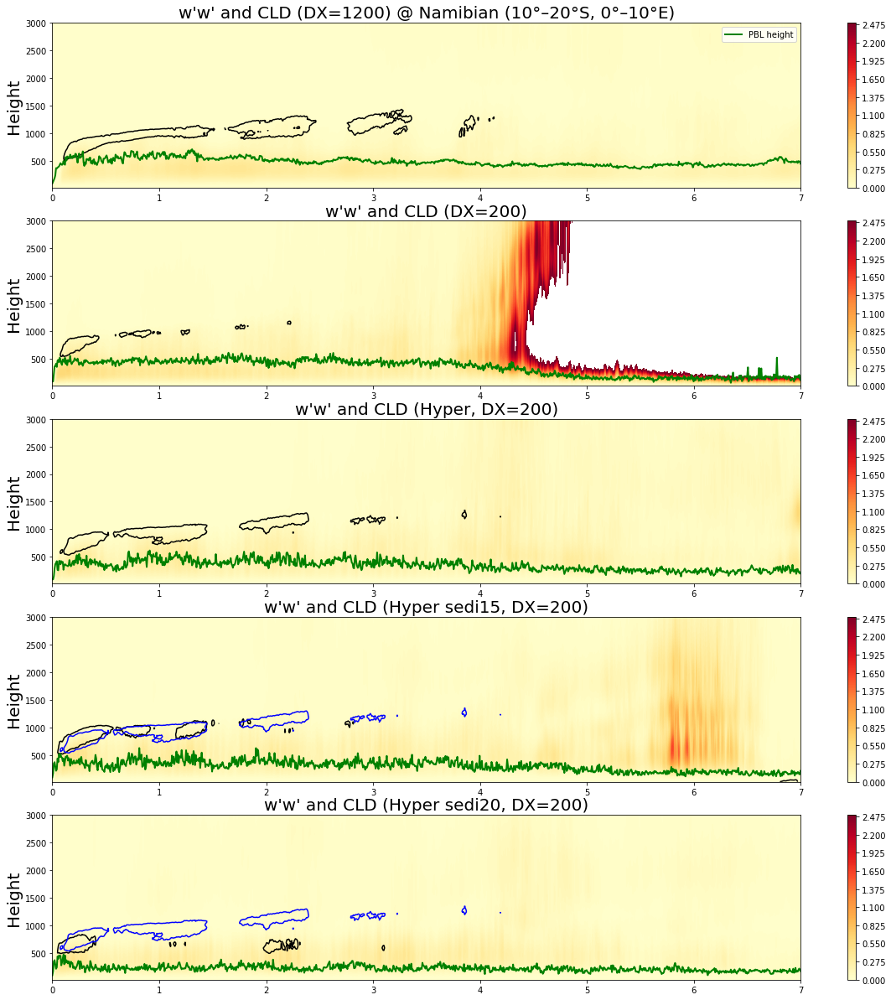

In [344]:
#  For SPCTRL and UPCTRL, both finished 5 day simulation
fig, (ax1,ax2,ax3,ax4,ax5) = plt.subplots(nrows=5, ncols=1, figsize=(20, 21))
varmin = [0]
varmax = [2.5]
varinter = [101]
vardmin = [-4]
vardmax = [4]
vardinter = [101]
num1 = 1009
num2 = 1009
time = np.linspace(0, num1, num1)
time2 = np.linspace(0, num2, num2)
time3 = np.linspace(0, 289, 289)
levels = np.linspace(varmin[0], varmax[0], varinter[0])
levels2 = np.linspace(vardmin[0], vardmax[0], vardinter[0])

cf = ax1.contourf(time/144,Z3SP,spww_crossSPNamibian,200, cmap="YlOrRd", levels=levels)
cf01 = ax1.contour(time/144,Z3SP,cld_crossSPNamibian,200,colors='k', levels=[0.2], linestyles='-')
ax1.plot(time/144,PH_SP,lw=2, color = 'green',label = 'PBL height')
ax1.legend(prop ={'size': 10})
#cf0002 = ax1.contour(time/144,Z3p,cld_cross1,200, colors='k', levels=[0.8], linestyles=':')
cb = fig.colorbar(cf, ax=ax1)
ax1.set(xlim=(0, 7), ylim=(min(Z3SP), 3000))
titlestring = ("w'w' and CLD (DX=1200) @ Namibian (10°–20°S, 0°–10°E)")
tx = ax1.set_title(titlestring, fontsize=20)
#ax1.set_xlabel('Day', fontsize=20)
ax1.set_ylabel('Height', fontsize=20)

cf2 = ax2.contourf(time/144,Z3UP,spww_crossUPNamibian,200, cmap="YlOrRd", levels=levels)
cf02 = ax2.contour(time/144,Z3UP,cld_crossUPNamibian,200,colors='k', levels=[0.2], linestyles='-')
ax2.plot(time/144,PH_UP,lw=2, color = 'green')
cb2 = fig.colorbar(cf2, ax=ax2)
ax2.set(xlim=(0, 7), ylim=(min(Z3UP), 3000))
titlestring = ("w'w' and CLD (DX=200)")
tx = ax2.set_title(titlestring, fontsize=20)
#ax2.set_xlabel('Day', fontsize=20)
ax2.set_ylabel('Height', fontsize=20)

cf3 = ax3.contourf(time/144,Z3UPhy,spww_crossUPhyNamibian,200, cmap="YlOrRd", levels=levels)
cf03 = ax3.contour(time/144,Z3UPhy,cld_crossUPhyNamibian,200,colors='k', levels=[0.2], linestyles='-')
ax3.plot(time/144,PH_UPhy,lw=2, color = 'green')
cb3 = fig.colorbar(cf3, ax=ax3)
ax3.set(xlim=(0, 7), ylim=(min(Z3UPhy), 3000))
titlestring = ("w'w' and CLD (Hyper, DX=200)")
tx = ax3.set_title(titlestring, fontsize=20)
#ax2.set_xlabel('Day', fontsize=20)
ax3.set_ylabel('Height', fontsize=20)

cf4 = ax4.contourf(time/144,Z3UPhysedi15,spww_crossUPhysedi15Namibian,200, cmap="YlOrRd", levels=levels)
cf04 = ax4.contour(time/144,Z3UPhysedi15,cld_crossUPhysedi15Namibian,200,colors='k', levels=[0.2], linestyles='-')
cf042 = ax4.contour(time/144,Z3UPhy,cld_crossUPhyNamibian,200,colors='b', levels=[0.2], linestyles='-')
ax4.plot(time/144,PH_UPhysedi15,lw=2, color = 'green')
cb4 = fig.colorbar(cf4, ax=ax4)
ax4.set(xlim=(0, 7), ylim=(min(Z3UPhysedi15), 3000))
titlestring = ("w'w' and CLD (Hyper sedi15, DX=200)")
tx = ax4.set_title(titlestring, fontsize=20)
#ax2.set_xlabel('Day', fontsize=20)
ax4.set_ylabel('Height', fontsize=20)

cf5 = ax5.contourf(time/144,Z3UPhysedi20,spww_crossUPhysedi20Namibian,200, cmap="YlOrRd", levels=levels)
cf05 = ax5.contour(time/144,Z3UPhysedi20,cld_crossUPhysedi20Namibian,200,colors='k', levels=[0.2], linestyles='-')
cf052 = ax5.contour(time/144,Z3UPhy,cld_crossUPhyNamibian,200,colors='b', levels=[0.2], linestyles='-')
ax5.plot(time/144,PH_UPhysedi20,lw=2, color = 'green')
cb5 = fig.colorbar(cf4, ax=ax5)
ax5.set(xlim=(0, 7), ylim=(min(Z3UPhysedi15), 3000))
titlestring = ("w'w' and CLD (Hyper sedi20, DX=200)")
tx = ax5.set_title(titlestring, fontsize=20)
#ax2.set_xlabel('Day', fontsize=20)
ax5.set_ylabel('Height', fontsize=20)

plt.savefig('SP_UP_inispww_crosssection_Namibian_5_m11_SPWWCLD_Time_Height_UP.png')
#plt.savefig('SP_UP_inispww_crosssection_WAus_102_m30_TCLD_Time_Height_UP.png')
#plt.savefig('SP_UP_inispww_crosssection_WPac_272_m14_SPWWCLD_Time_Height_UP.png')

# Californian (20°–30°N, 120°–130°W)

In [351]:
spww_SPCalifornian = np.zeros([1009,125])
spww_UPCalifornian = np.zeros([1009,125])
spww_UPhyCalifornian = np.zeros([1009,125])
spww_UPhysedi20Californian = np.zeros([1009,125])
spww_UPhysedi15Californian = np.zeros([1009,125])
cld_SPCalifornian = np.zeros([1009,125])
cld_UPCalifornian = np.zeros([1009,125])
cld_UPhyCalifornian = np.zeros([1009,125])
cld_UPhysedi20Californian = np.zeros([1009,125])
cld_UPhysedi15Californian = np.zeros([1009,125])
for it in range(len(LWP_SP)):
    count = 0
    for il in range(len(lon)):
        d0 = lonlat_in(lat[il], lon[il],20,230,30,240) # Californian
        if d0>0:
            PH_SP[it]         = PH_SP[it] + PBLH_SP[it,il]
            PH_UP[it]         = PH_UP[it] + PBLH_UP[it,il]
            PH_UPhy[it]       = PH_UPhy[it] + PBLH_UPhy[it,il]
            PH_UPhysedi15[it] = PH_UPhysedi15[it] + PBLH_UPhysedi15[it,il]
            PH_UPhysedi20[it] = PH_UPhysedi20[it] + PBLH_UPhysedi20[it,il]
            spww_SPCalifornian[it,:] = spww_SPCalifornian[it,:] + SPWWSP[it,:,il]
            spww_UPCalifornian[it,:] = spww_UPCalifornian[it,:] + SPWWUP[it,:,il]
            spww_UPhyCalifornian[it,:] = spww_UPhyCalifornian[it,:] + SPWWUPhy[it,:,il]
            spww_UPhysedi15Californian[it,:] = spww_UPhysedi15Californian[it,:] + SPWWUPhysedi15[it,:,il]
            spww_UPhysedi20Californian[it,:] = spww_UPhysedi20Californian[it,:] + SPWWUPhysedi20[it,:,il]
            cld_SPCalifornian[it,:] = cld_SPCalifornian[it,:] + CLOUD_SP[it,:,il]
            cld_UPCalifornian[it,:] = cld_UPCalifornian[it,:] + CLOUD_UP[it,:,il]
            cld_UPhyCalifornian[it,:] = cld_UPhyCalifornian[it,:] + CLOUD_UPhy[it,:,il]
            cld_UPhysedi15Californian[it,:] = cld_UPhysedi15Californian[it,:] + CLOUD_UPhysedi15[it,:,il]
            cld_UPhysedi20Californian[it,:] = cld_UPhysedi20Californian[it,:] + CLOUD_UPhysedi20[it,:,il]
            count = count + 1
            
    PH_SP[it] = PH_SP[it]/count
    PH_UP[it] = PH_UP[it]/count
    PH_UPhy[it] = PH_UPhy[it]/count
    PH_UPhysedi15[it] = PH_UPhysedi15[it]/count
    PH_UPhysedi20[it] = PH_UPhysedi20[it]/count
    spww_SPCalifornian[it,:] = spww_SPCalifornian[it,:] /count
    spww_UPCalifornian[it,:] = spww_UPCalifornian[it,:]  /count
    spww_UPhyCalifornian[it,:] = spww_UPhyCalifornian[it,:] /count
    spww_UPhysedi15Californian[it,:] = spww_UPhysedi15Californian[it,:] /count
    spww_UPhysedi20Californian[it,:] = spww_UPhysedi20Californian[it,:] /count
    cld_SPCalifornian[it,:] = cld_SPCalifornian[it,:] /count
    cld_UPCalifornian[it,:] = cld_UPCalifornian[it,:]  /count
    cld_UPhyCalifornian[it,:] = cld_UPhyCalifornian[it,:] /count
    cld_UPhysedi15Californian[it,:] = cld_UPhysedi15Californian[it,:] /count
    cld_UPhysedi20Californian[it,:] = cld_UPhysedi20Californian[it,:] /count
    
spww_crossSPCalifornian = np.transpose(spww_SPCalifornian)
spww_crossUPCalifornian = np.transpose(spww_UPCalifornian)
spww_crossUPhyCalifornian = np.transpose(spww_UPhyCalifornian)
spww_crossUPhysedi15Californian = np.transpose(spww_UPhysedi15Californian)
spww_crossUPhysedi20Californian = np.transpose(spww_UPhysedi20Californian)
cld_crossSPCalifornian = np.transpose(cld_SPCalifornian)
cld_crossUPCalifornian = np.transpose(cld_UPCalifornian)
cld_crossUPhyCalifornian = np.transpose(cld_UPhyCalifornian)
cld_crossUPhysedi15Californian = np.transpose(cld_UPhysedi15Californian)
cld_crossUPhysedi20Californian = np.transpose(cld_UPhysedi20Californian)

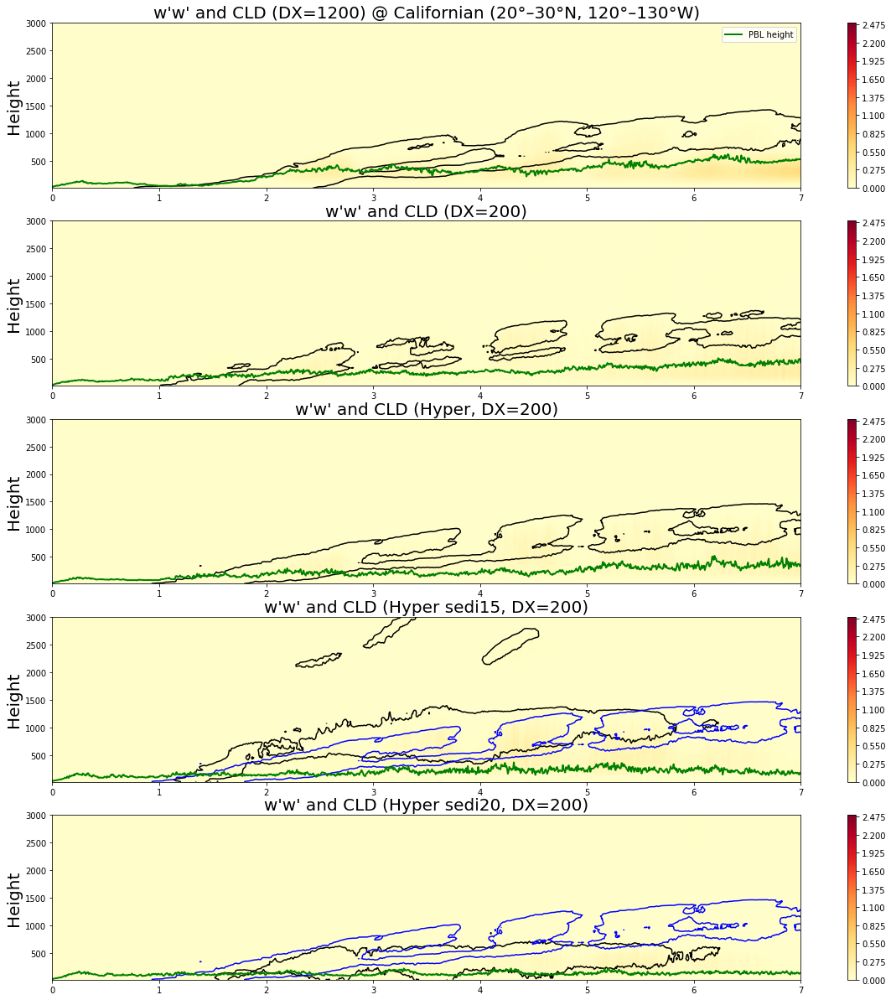

In [352]:
#  For SPCTRL and UPCTRL, both finished 5 day simulation
fig, (ax1,ax2,ax3,ax4,ax5) = plt.subplots(nrows=5, ncols=1, figsize=(20, 21))
varmin = [0]
varmax = [2.5]
varinter = [101]
vardmin = [-4]
vardmax = [4]
vardinter = [101]
num1 = 1009
num2 = 1009
time = np.linspace(0, num1, num1)
time2 = np.linspace(0, num2, num2)
time3 = np.linspace(0, 289, 289)
levels = np.linspace(varmin[0], varmax[0], varinter[0])
levels2 = np.linspace(vardmin[0], vardmax[0], vardinter[0])

cf = ax1.contourf(time/144,Z3SP,spww_crossSPCalifornian,200, cmap="YlOrRd", levels=levels)
cf01 = ax1.contour(time/144,Z3SP,cld_crossSPCalifornian,200,colors='k', levels=[0.2], linestyles='-')
ax1.plot(time/144,PH_SP,lw=2, color = 'green',label = 'PBL height')
ax1.legend(prop ={'size': 10})
#cf0002 = ax1.contour(time/144,Z3p,cld_cross1,200, colors='k', levels=[0.8], linestyles=':')
cb = fig.colorbar(cf, ax=ax1)
ax1.set(xlim=(0, 7), ylim=(min(Z3SP), 3000))
titlestring = ("w'w' and CLD (DX=1200) @ Californian (20°–30°N, 120°–130°W)")
tx = ax1.set_title(titlestring, fontsize=20)
#ax1.set_xlabel('Day', fontsize=20)
ax1.set_ylabel('Height', fontsize=20)

cf2 = ax2.contourf(time/144,Z3UP,spww_crossUPCalifornian,200, cmap="YlOrRd", levels=levels)
cf02 = ax2.contour(time/144,Z3UP,cld_crossUPCalifornian,200,colors='k', levels=[0.2], linestyles='-')
ax2.plot(time/144,PH_UP,lw=2, color = 'green')
cb2 = fig.colorbar(cf2, ax=ax2)
ax2.set(xlim=(0, 7), ylim=(min(Z3UP), 3000))
titlestring = ("w'w' and CLD (DX=200)")
tx = ax2.set_title(titlestring, fontsize=20)
#ax2.set_xlabel('Day', fontsize=20)
ax2.set_ylabel('Height', fontsize=20)

cf3 = ax3.contourf(time/144,Z3UPhy,spww_crossUPhyCalifornian,200, cmap="YlOrRd", levels=levels)
cf03 = ax3.contour(time/144,Z3UPhy,cld_crossUPhyCalifornian,200,colors='k', levels=[0.2], linestyles='-')
ax3.plot(time/144,PH_UPhy,lw=2, color = 'green')
cb3 = fig.colorbar(cf3, ax=ax3)
ax3.set(xlim=(0, 7), ylim=(min(Z3UPhy), 3000))
titlestring = ("w'w' and CLD (Hyper, DX=200)")
tx = ax3.set_title(titlestring, fontsize=20)
#ax2.set_xlabel('Day', fontsize=20)
ax3.set_ylabel('Height', fontsize=20)

cf4 = ax4.contourf(time/144,Z3UPhysedi15,spww_crossUPhysedi15Californian,200, cmap="YlOrRd", levels=levels)
cf04 = ax4.contour(time/144,Z3UPhysedi15,cld_crossUPhysedi15Californian,200,colors='k', levels=[0.2], linestyles='-')
cf042 = ax4.contour(time/144,Z3UPhy,cld_crossUPhyCalifornian,200,colors='b', levels=[0.2], linestyles='-')
ax4.plot(time/144,PH_UPhysedi15,lw=2, color = 'green')
cb4 = fig.colorbar(cf4, ax=ax4)
ax4.set(xlim=(0, 7), ylim=(min(Z3UPhysedi15), 3000))
titlestring = ("w'w' and CLD (Hyper sedi15, DX=200)")
tx = ax4.set_title(titlestring, fontsize=20)
#ax2.set_xlabel('Day', fontsize=20)
ax4.set_ylabel('Height', fontsize=20)

cf5 = ax5.contourf(time/144,Z3UPhysedi20,spww_crossUPhysedi20Californian,200, cmap="YlOrRd", levels=levels)
cf05 = ax5.contour(time/144,Z3UPhysedi20,cld_crossUPhysedi20Californian,200,colors='k', levels=[0.2], linestyles='-')
cf052 = ax5.contour(time/144,Z3UPhy,cld_crossUPhyCalifornian,200,colors='b', levels=[0.2], linestyles='-')
ax5.plot(time/144,PH_UPhysedi20,lw=2, color = 'green')
cb5 = fig.colorbar(cf4, ax=ax5)
ax5.set(xlim=(0, 7), ylim=(min(Z3UPhysedi15), 3000))
titlestring = ("w'w' and CLD (Hyper sedi20, DX=200)")
tx = ax5.set_title(titlestring, fontsize=20)
#ax2.set_xlabel('Day', fontsize=20)
ax5.set_ylabel('Height', fontsize=20)

plt.savefig('SP_UP_inispww_crosssection_Californian_5_m11_SPWWCLD_Time_Height_UP.png')
#plt.savefig('SP_UP_inispww_crosssection_WAus_102_m30_TCLD_Time_Height_UP.png')
#plt.savefig('SP_UP_inispww_crosssection_WPac_272_m14_SPWWCLD_Time_Height_UP.png')

# Australian (25°–35°S, 95°–105°E)

In [349]:
spww_SPAustralian = np.zeros([1009,125])
spww_UPAustralian = np.zeros([1009,125])
spww_UPhyAustralian = np.zeros([1009,125])
spww_UPhysedi20Australian = np.zeros([1009,125])
spww_UPhysedi15Australian = np.zeros([1009,125])
cld_SPAustralian = np.zeros([1009,125])
cld_UPAustralian = np.zeros([1009,125])
cld_UPhyAustralian = np.zeros([1009,125])
cld_UPhysedi20Australian = np.zeros([1009,125])
cld_UPhysedi15Australian = np.zeros([1009,125])
for it in range(len(LWP_SP)):
    count = 0
    for il in range(len(lon)):
        d0 = lonlat_in(lat[il], lon[il],25,95,35,105) # Australian
        if d0>0:
            PH_SP[it]         = PH_SP[it] + PBLH_SP[it,il]
            PH_UP[it]         = PH_UP[it] + PBLH_UP[it,il]
            PH_UPhy[it]       = PH_UPhy[it] + PBLH_UPhy[it,il]
            PH_UPhysedi15[it] = PH_UPhysedi15[it] + PBLH_UPhysedi15[it,il]
            PH_UPhysedi20[it] = PH_UPhysedi20[it] + PBLH_UPhysedi20[it,il]
            spww_SPAustralian[it,:] = spww_SPAustralian[it,:] + SPWWSP[it,:,il]
            spww_UPAustralian[it,:] = spww_UPAustralian[it,:] + SPWWUP[it,:,il]
            spww_UPhyAustralian[it,:] = spww_UPhyAustralian[it,:] + SPWWUPhy[it,:,il]
            spww_UPhysedi15Australian[it,:] = spww_UPhysedi15Australian[it,:] + SPWWUPhysedi15[it,:,il]
            spww_UPhysedi20Australian[it,:] = spww_UPhysedi20Australian[it,:] + SPWWUPhysedi20[it,:,il]
            cld_SPAustralian[it,:] = cld_SPAustralian[it,:] + CLOUD_SP[it,:,il]
            cld_UPAustralian[it,:] = cld_UPAustralian[it,:] + CLOUD_UP[it,:,il]
            cld_UPhyAustralian[it,:] = cld_UPhyAustralian[it,:] + CLOUD_UPhy[it,:,il]
            cld_UPhysedi15Australian[it,:] = cld_UPhysedi15Australian[it,:] + CLOUD_UPhysedi15[it,:,il]
            cld_UPhysedi20Australian[it,:] = cld_UPhysedi20Australian[it,:] + CLOUD_UPhysedi20[it,:,il]
            count = count + 1
            
    PH_SP[it] = PH_SP[it]/count
    PH_UP[it] = PH_UP[it]/count
    PH_UPhy[it] = PH_UPhy[it]/count
    PH_UPhysedi15[it] = PH_UPhysedi15[it]/count
    PH_UPhysedi20[it] = PH_UPhysedi20[it]/count
    spww_SPAustralian[it,:] = spww_SPAustralian[it,:] /count
    spww_UPAustralian[it,:] = spww_UPAustralian[it,:]  /count
    spww_UPhyAustralian[it,:] = spww_UPhyAustralian[it,:] /count
    spww_UPhysedi15Australian[it,:] = spww_UPhysedi15Australian[it,:] /count
    spww_UPhysedi20Australian[it,:] = spww_UPhysedi20Australian[it,:] /count
    cld_SPAustralian[it,:] = cld_SPAustralian[it,:] /count
    cld_UPAustralian[it,:] = cld_UPAustralian[it,:]  /count
    cld_UPhyAustralian[it,:] = cld_UPhyAustralian[it,:] /count
    cld_UPhysedi15Australian[it,:] = cld_UPhysedi15Australian[it,:] /count
    cld_UPhysedi20Australian[it,:] = cld_UPhysedi20Australian[it,:] /count
    
spww_crossSPAustralian = np.transpose(spww_SPAustralian)
spww_crossUPAustralian = np.transpose(spww_UPAustralian)
spww_crossUPhyAustralian = np.transpose(spww_UPhyAustralian)
spww_crossUPhysedi15Australian = np.transpose(spww_UPhysedi15Australian)
spww_crossUPhysedi20Australian = np.transpose(spww_UPhysedi20Australian)
cld_crossSPAustralian = np.transpose(cld_SPAustralian)
cld_crossUPAustralian = np.transpose(cld_UPAustralian)
cld_crossUPhyAustralian = np.transpose(cld_UPhyAustralian)
cld_crossUPhysedi15Australian = np.transpose(cld_UPhysedi15Australian)
cld_crossUPhysedi20Australian = np.transpose(cld_UPhysedi20Australian)

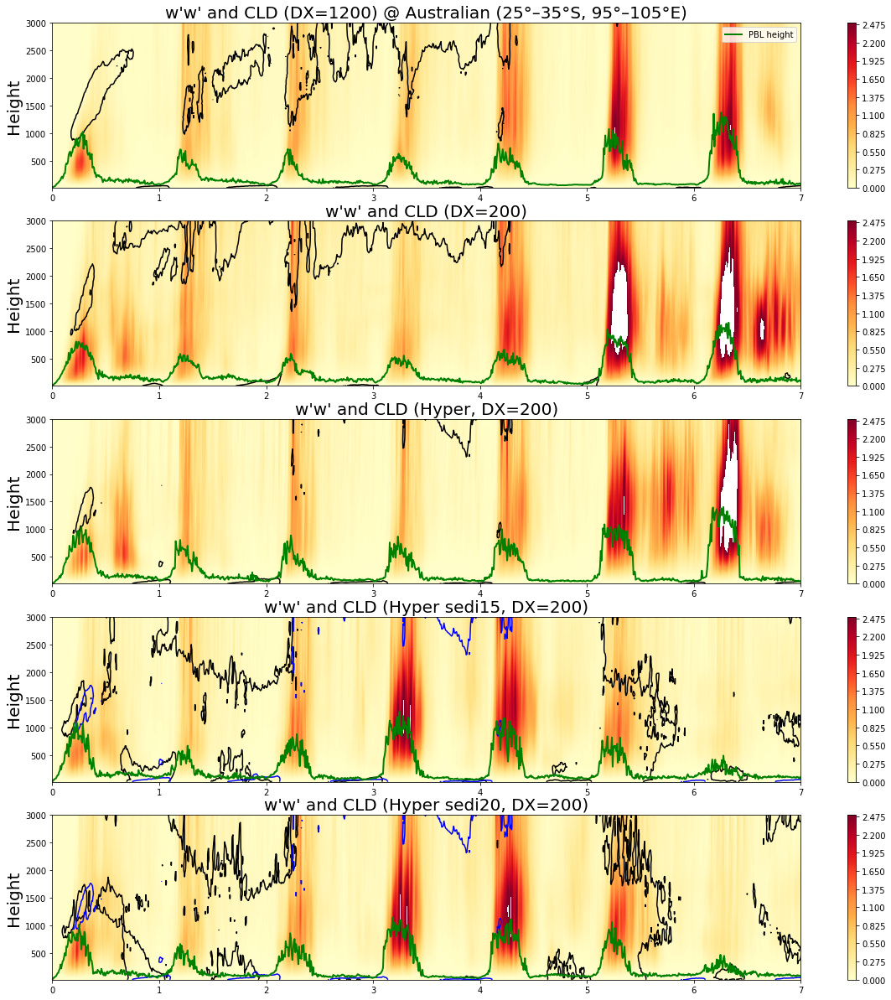

In [350]:
#  For SPCTRL and UPCTRL, both finished 5 day simulation
fig, (ax1,ax2,ax3,ax4,ax5) = plt.subplots(nrows=5, ncols=1, figsize=(20, 21))
varmin = [0]
varmax = [2.5]
varinter = [101]
vardmin = [-4]
vardmax = [4]
vardinter = [101]
num1 = 1009
num2 = 1009
time = np.linspace(0, num1, num1)
time2 = np.linspace(0, num2, num2)
time3 = np.linspace(0, 289, 289)
levels = np.linspace(varmin[0], varmax[0], varinter[0])
levels2 = np.linspace(vardmin[0], vardmax[0], vardinter[0])

cf = ax1.contourf(time/144,Z3SP,spww_crossSPAustralian,200, cmap="YlOrRd", levels=levels)
cf01 = ax1.contour(time/144,Z3SP,cld_crossSPAustralian,200,colors='k', levels=[0.2], linestyles='-')
ax1.plot(time/144,PH_SP,lw=2, color = 'green',label = 'PBL height')
ax1.legend(prop ={'size': 10})
#cf0002 = ax1.contour(time/144,Z3p,cld_cross1,200, colors='k', levels=[0.8], linestyles=':')
cb = fig.colorbar(cf, ax=ax1)
ax1.set(xlim=(0, 7), ylim=(min(Z3SP), 3000))
titlestring = ("w'w' and CLD (DX=1200) @ Australian (25°–35°S, 95°–105°E)")
tx = ax1.set_title(titlestring, fontsize=20)
#ax1.set_xlabel('Day', fontsize=20)
ax1.set_ylabel('Height', fontsize=20)

cf2 = ax2.contourf(time/144,Z3UP,spww_crossUPAustralian,200, cmap="YlOrRd", levels=levels)
cf02 = ax2.contour(time/144,Z3UP,cld_crossUPAustralian,200,colors='k', levels=[0.2], linestyles='-')
ax2.plot(time/144,PH_UP,lw=2, color = 'green')
cb2 = fig.colorbar(cf2, ax=ax2)
ax2.set(xlim=(0, 7), ylim=(min(Z3UP), 3000))
titlestring = ("w'w' and CLD (DX=200)")
tx = ax2.set_title(titlestring, fontsize=20)
#ax2.set_xlabel('Day', fontsize=20)
ax2.set_ylabel('Height', fontsize=20)

cf3 = ax3.contourf(time/144,Z3UPhy,spww_crossUPhyAustralian,200, cmap="YlOrRd", levels=levels)
cf03 = ax3.contour(time/144,Z3UPhy,cld_crossUPhyAustralian,200,colors='k', levels=[0.2], linestyles='-')
ax3.plot(time/144,PH_UPhy,lw=2, color = 'green')
cb3 = fig.colorbar(cf3, ax=ax3)
ax3.set(xlim=(0, 7), ylim=(min(Z3UPhy), 3000))
titlestring = ("w'w' and CLD (Hyper, DX=200)")
tx = ax3.set_title(titlestring, fontsize=20)
#ax2.set_xlabel('Day', fontsize=20)
ax3.set_ylabel('Height', fontsize=20)

cf4 = ax4.contourf(time/144,Z3UPhysedi15,spww_crossUPhysedi15Australian,200, cmap="YlOrRd", levels=levels)
cf04 = ax4.contour(time/144,Z3UPhysedi15,cld_crossUPhysedi15Australian,200,colors='k', levels=[0.2], linestyles='-')
cf042 = ax4.contour(time/144,Z3UPhy,cld_crossUPhyAustralian,200,colors='b', levels=[0.2], linestyles='-')
ax4.plot(time/144,PH_UPhysedi15,lw=2, color = 'green')
cb4 = fig.colorbar(cf4, ax=ax4)
ax4.set(xlim=(0, 7), ylim=(min(Z3UPhysedi15), 3000))
titlestring = ("w'w' and CLD (Hyper sedi15, DX=200)")
tx = ax4.set_title(titlestring, fontsize=20)
#ax2.set_xlabel('Day', fontsize=20)
ax4.set_ylabel('Height', fontsize=20)

cf5 = ax5.contourf(time/144,Z3UPhysedi20,spww_crossUPhysedi20Australian,200, cmap="YlOrRd", levels=levels)
cf05 = ax5.contour(time/144,Z3UPhysedi20,cld_crossUPhysedi20Australian,200,colors='k', levels=[0.2], linestyles='-')
cf052 = ax5.contour(time/144,Z3UPhy,cld_crossUPhyAustralian,200,colors='b', levels=[0.2], linestyles='-')
ax5.plot(time/144,PH_UPhysedi20,lw=2, color = 'green')
cb5 = fig.colorbar(cf4, ax=ax5)
ax5.set(xlim=(0, 7), ylim=(min(Z3UPhysedi15), 3000))
titlestring = ("w'w' and CLD (Hyper sedi20, DX=200)")
tx = ax5.set_title(titlestring, fontsize=20)
#ax2.set_xlabel('Day', fontsize=20)
ax5.set_ylabel('Height', fontsize=20)

plt.savefig('SP_UP_inispww_crosssection_Australian_5_m11_SPWWCLD_Time_Height_UP.png')
#plt.savefig('SP_UP_inispww_crosssection_WAus_102_m30_TCLD_Time_Height_UP.png')
#plt.savefig('SP_UP_inispww_crosssection_WPac_272_m14_SPWWCLD_Time_Height_UP.png')